In [ ]:
import pandas as pd
train = pd.read_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/scaffold_test_all.csv")
smiles_lis=train['smiles']

Loading previously saved dgl graphs...
in node features  76
smiles:  CCOC(=O)[C@H](C)NP(=O)(N[C@@H](C)C(=O)OCC)OC[C@H]1O[C@@](C#N)(c2ccc3c(N)ncnn23)[C@H](O)[C@@H]1O
logD:  0.3
Jchem:  -1.61
ADMET:  -1.536
fpadmet:  1.345
prediction:  0.693


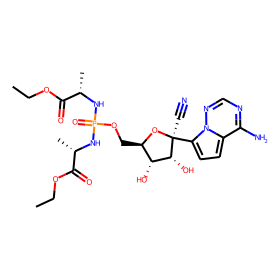

smiles:  CCCCC(NC(=O)C1CCCN1C(=O)CNC(=O)C(CCCCN)NC(=O)C(Cc1c[nH]cn1)NC(=O)C(CO)NC(=O)C(CC(C)C)N(C)C(=O)C(CCCN=C(N)N)NC(=O)C1CCCN1C(=O)C(CCCNC(=N)N)NC(=O)C(CCC(N)=O)NC(=O)C(CCCNC(=N)N)NC(=O)C(CCCNC(=N)N)NC(=O)C(Cc1ccccc1)NC(=O)C(CCCCN)NC(=O)CCOCCOCCOCCOCCOCCOCCOCCN)C(=O)NC(C)(C)C(=O)NC(Cc1ccc(Br)cc1)C(=O)O
logD:  -1.82
Jchem:  -25.63245638
ADMET:  -3.586
fpadmet:  0.141
prediction:  -1.529


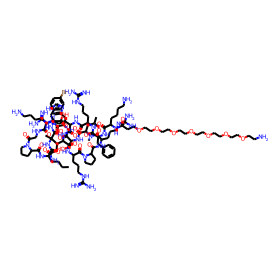

smiles:  CCCCC(NC(=O)C1CCCN1C(=O)CNC(=O)C(CCCCN)NC(=O)C(Cc1c[nH]cn1)NC(=O)C(CO)NC(=O)C(CC(C)C)N(C)C(=O)C(CCCN=C(N)N)NC(=O)C1CCCN1C(=O)C(CCCNC(=N)N)NC(=O)C(CCC(N)=O)NC(=O)C(CCCNC(=N)N)NC(=O)C(CCCNC(=N)N)NC(=O)C(Cc1ccccc1)NC(=O)C(N)CCCCN)C(=O)NC(C)(C)C(=O)NC(Cc1ccc(Br)cc1)C(=O)O
logD:  -2.01
Jchem:  -23.23761151
ADMET:  -3.15
fpadmet:  -0.372
prediction:  -1.49


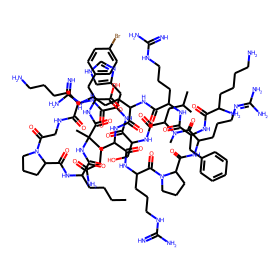

smiles:  CSCCC(NC(=O)C1CCCN1C(=O)CNC(=O)C(CCCCN)NC(=O)C(Cc1c[nH]cn1)NC(=O)C(CO)NC(=O)C(CC(C)C)NC(=O)C(CCCN=C(N)N)NC(=O)C1CCCN1C(=O)C(CCCNC(=N)N)NC(=O)C(CCC(N)=O)NC(=O)C(CCCNC(=N)N)NC(=O)C(CCCNC(=N)N)NC(=O)C(Cc1ccccc1)NC(=O)C(N)CCCCN)C(=O)N1CCCC1C(=O)NC(Cc1ccccc1)C(=O)O
logD:  -2.57
Jchem:  -25.15100046
ADMET:  -5.0
fpadmet:  -0.202
prediction:  -1.402


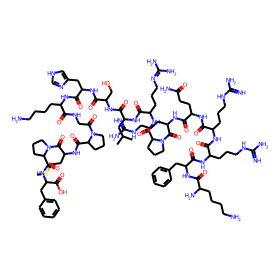

It took 803.6131s to complete the task


In [7]:
# -*- coding: utf-8 -*-
#
# Copyright Amazon.com, Inc. or its affiliates. All Rights Reserved.
# SPDX-License-Identifier: Apache-2.0
import time
import json
import pickle
import datetime
import pandas as pd
import numpy as np
import torch
import copy
from rdkit import Chem
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D
from IPython.display import SVG
from IPython.display import display
import matplotlib
import matplotlib.cm as cm
from matplotlib import pyplot as plt

import torch.nn as nn
from dgllife.utils import Meter, EarlyStopping
import sys
sys.path.append("..") 
from torch.utils.data import DataLoader
from utils import get_label_mean_and_std, collate, load_model
from utils import get_configure, mkdir_p, init_trial_path, \
    collate_molgraphs, load_model, predict, init_featurizer, load_dataset
from torch.nn.utils import clip_grad_norm
import os
os.environ['CUDA_VISIBLE_DEVICES']='3'
def log_model_evaluation(smiles_list,args, model, test_loader):
    dt = datetime.datetime.now()
    file_name='1test_result_{}_{:02d}-{:02d}-{:02d}.csv'.format(
                dt.date(), dt.hour, dt.minute, dt.second)
    with open(file_name, 'w') as f: 
        def _log_values(metric, test_values):
            f.write('{}\n'.format(metric))
            headline = '|            | averaged |'
            for t in args['task']:
                headline += ' {:15} |'.format(t)
            headline += '\n'
            f.write(headline)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            for name, values in {
                                    'Test': test_values}.items():
                row = '| {:10s} | {:8.3f} |'.format(name, np.mean(values))
                
                for t in range(len(args['task'])):
                    if len(args['task'])==1:
                        row += ' {:15.3f} |'.format(values)
                    else:
                        row += ' {:15.3f} |'.format(values[t])
                row += '\n'
                f.write(row)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            f.write('\n')
        test_r2,test_mae,test_rmse = run_an_eval_epoch(smiles_list,args, model, test_loader)
        _log_values('r2', test_r2)
        _log_values('mae',test_mae)
        _log_values('rmse', test_rmse)

def mol_with_atom_index( mol ):
    atoms = mol.GetNumAtoms()
    for idx in range( atoms ):
        mol.GetAtomWithIdx( idx ).SetProp( 'molAtomMapNumber', str( mol.GetAtomWithIdx( idx ).GetIdx() ) )
    return mol

def draw(atom_weights,smiles,bg,logD,prediction,Jchem,fpadmet,ADMET):
    # print("JCHEM: ",Jchem)
    # print("LogD: ",logD)
    min_value = torch.min(atom_weights)
    max_value = torch.max(atom_weights)
    atom_weights = (atom_weights - min_value) / (max_value - min_value)

    norm = matplotlib.colors.Normalize(vmin=0, vmax=1.28)
    cmap = cm.get_cmap('bwr')
    try:
     #   if((Jchem-logD>1)&(fpadmet-logD>1)&(ADMET-logD>1)):
        if(min(abs(Jchem-logD),abs(prediction[0][0].item()-logD),abs(fpadmet-logD),abs(logD-ADMET))==abs(prediction[0][0].item()-logD)):#&(abs(prediction[0][0].item()-logD)<1)):
       # if((Jchem<-10)&(Jchem>-20)):
            plt_colors = cm.ScalarMappable(norm=norm, cmap=cmap)
            atom_colors = {i: plt_colors.to_rgba(atom_weights[i].data.item()) for i in range(bg.number_of_nodes())}
        # print("atom_colors: ",atom_colors)
            mol = Chem.MolFromSmiles(smiles[0])
            rdDepictor.Compute2DCoords(mol)
            drawer = rdMolDraw2D.MolDraw2DSVG(280, 280)
            drawer.SetFontSize(1)
            op = drawer.drawOptions()
        #    mol_with_atom_index(mol=mol)
            mol = rdMolDraw2D.PrepareMolForDrawing(mol)
            drawer.DrawMolecule(mol)
                                # , highlightAtoms=range(bg.number_of_nodes()),
                                #     highlightBonds=[],
                                #     highlightAtomColors=atom_colors)
            drawer.FinishDrawing()
            
            svg = drawer.GetDrawingText()
            svg = svg.replace('svg:', '')
            print("smiles: ",smiles[0])
            print("logD: ",logD)
            print("Jchem: ",Jchem)
            print("ADMET: ",ADMET)
            print("fpadmet: ",fpadmet)
            print("prediction: ",round(prediction[0][0].item(),3))
        #  plt.colorbar()
            display(SVG(svg))
    except:
        print("problem smiles: ",smiles[0])
        print("\n")
        a=Chem.MolFromSmiles(smiles[0])
        display(a)
        


def run_an_eval_epoch(smiles_list,args, model, data_loader,logD,Jchem,fpadmet,ADMET):
    model.eval()
    eval_meter = Meter(args['train_mean'], args['train_std'])
    predictions = []
    i=0
    with torch.no_grad():
        for _, batch_data in enumerate(data_loader):
            smiles, bg, labels, masks = batch_data
            # print("bg: ",bg)
            prediction,weight = predict(args, model, bg)
            atom_weights = weight[0]
            # print("atom_weights: ",atom_weights)
            
            prediction = prediction.detach().cpu() * args['train_std'].cpu()+args['train_mean'].cpu()
            draw(atom_weights,smiles,bg,logD[i],prediction,Jchem[i],fpadmet[i],ADMET[i])
            eval_meter.update(prediction, labels, masks)
            predictions.append(prediction)
            i=i+1
        predictions = torch.cat(predictions, dim=0)

        output_data = {'canonical_smiles': smiles_list}
        if args['task'] is None:
            args['task'] = ['task_{:d}'.format(t) for t in range(1, args['n_tasks'] + 1)]
        else:
            pass
            #args['task'] = args['task'].split(',')
        # for task_id, task_name in enumerate(args['task']):
        #     output_data[task_name] = predictions[:, task_id]
        # df = pd.DataFrame(output_data)
        # # df.to_csv('./pretrain_76_small_similarity_new.csv', index=False)
        # out=pd.read_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/media_similarity_results.csv")
        # out['new_new_pretrain_76']=df['standard_value']
        # out.to_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/media_similarity_results.csv",index=False)


def main(smiles_list,args, exp_config, test_set,logD,Jchem,fpadmet,ADMET):
    # Record settings
    exp_config.update({
        'model': args['model'],
        'mode':args['mode'],
        'n_tasks': args['n_tasks'],
        'atom_featurizer_type': args['atom_featurizer_type'],
        'bond_featurizer_type': args['bond_featurizer_type']
    })
    if args['atom_featurizer_type'] != 'pre_train':
        exp_config['in_node_feats'] = args['node_featurizer'].feat_size()+2
    if args['edge_featurizer'] is not None and args['bond_featurizer_type'] != 'pre_train':
        exp_config['in_edge_feats'] = args['edge_featurizer'].feat_size()

    # Set up directory for saving results
    t0 = time.time()
  
    test_loader = DataLoader(dataset=test_set, batch_size=1,#exp_config['batch_size'],
                             collate_fn=collate_molgraphs, num_workers=args['num_workers'])
    model = load_model(exp_config).to(args['device'])
    #checkpoint = torch.load('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/model_pretrain_76.pth', map_location='cpu')
    path='/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/my_model/new_pretrain_76/model_pretrain_76.pth'
    checkpoint=torch.load(path,map_location='cpu')
    model.load_state_dict(checkpoint)#['model_state_dict'])

    run_an_eval_epoch(smiles_list,args, model, test_loader,logD,Jchem,fpadmet,ADMET)

    print('It took {:.4f}s to complete the task'.format(time.time() - t0))

   
if __name__ == '__main__':
    from argparse import ArgumentParser
    from argparse import ArgumentParser
    from dgllife.data import MoleculeCSVDataset
    from dgllife.utils import smiles_to_bigraph, RandomSplitter
    import torch
   # from configure import configs
  #  from run import main
    from utils import mkdir_p, setup
    # reload a file to a variable
    # with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_no_pretrain_76_norm_new/3/args.pickle', 'rb') as file:
    #     args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/args.pickle', 'rb') as file:
        args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/configure.json', 'r') as f:
        exp_config = json.load(f)
    if torch.cuda.is_available():
        args['device'] = torch.device('cuda:0')
    else:
        args['device'] = torch.device('cpu')
    args = setup(args)
    test_set = pd.read_csv('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/all_external_test_with_logp.csv')
    Jchem=test_set['Jchem']
    fpadmet=test_set['fpadmet']
    ADMET=test_set['ADMET_lab2.0']
    
    logD=test_set['standard_value']
    test_set['logp']=np.nan
    smiles_list=test_set['smiles'].to_list()
    test_set = load_dataset(args,test_set,"test")
    exp_config = get_configure(args['model'],"test")
    main(smiles_list,args, exp_config,test_set,logD,Jchem,fpadmet,ADMET)

Loading previously saved dgl graphs...
in node features  76
smiles:  COCCOCN1CNc2cc(OC)c(S(=O)(=O)N(Cc3ccccc3)Cc3ccccc3)cc2S1(=O)=O
logD:  4.0
Jchem:  2.8
ADMET:  2.805
fpadmet:  2.338
prediction:  1.63


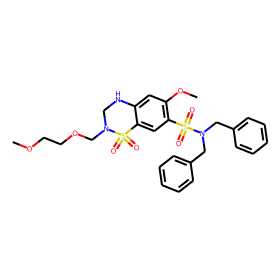

smiles:  CCC/N=C1\S/C(=C\c2ccc(O)c(Cl)c2)C(=O)N1C1CCN(C)C(=O)C1
logD:  0.6
Jchem:  2.64
ADMET:  2.443
fpadmet:  1.686
prediction:  2.531


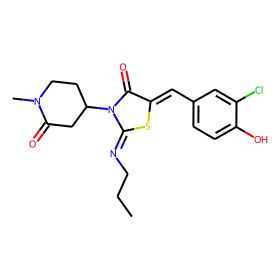

smiles:  FC(F)Oc1ccc(-c2nnc3cncc(OCCC45C6C7C8C6C4C8C75)n23)cc1
logD:  4.3
Jchem:  1.57
ADMET:  2.776
fpadmet:  2.679
prediction:  3.729


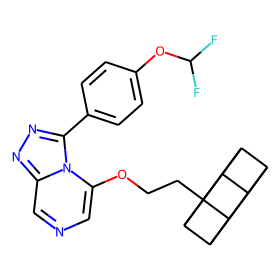

smiles:  CCN(CC)Cc1ccc(OC)c(-c2cc3c(-c4ccc(-c5nnn[nH]5)c(C(C)C)c4)ccnc3[nH]2)c1
logD:  0.93
Jchem:  3.45
ADMET:  4.308
fpadmet:  2.799
prediction:  2.45


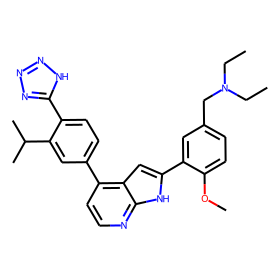

smiles:  CCN(CC)Cc1cccc(-c2cc3c(-c4ccc(C(=O)O)c(C(C)C)c4)ccnc3[nH]2)c1OC
logD:  0.74
Jchem:  3.09
ADMET:  4.212
fpadmet:  1.66
prediction:  2.259


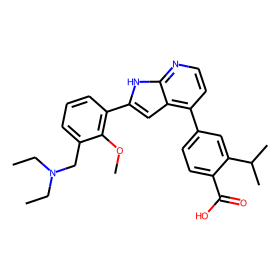

smiles:  CCN(CC)Cc1ccc(OC)c(-c2cc3c(-c4ccc(C(=O)O)c(C)c4)ccnc3[nH]2)c1
logD:  0.66
Jchem:  2.37
ADMET:  3.683
fpadmet:  1.437
prediction:  1.641


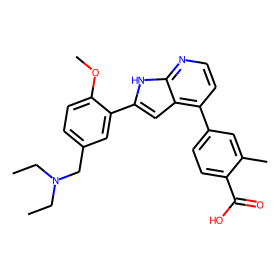

smiles:  CCN(CC)Cc1ccc(OC)c(-c2cc3c(-c4ccc(C(=O)O)c(C(C)C)c4)ccnc3[nH]2)c1
logD:  0.93
Jchem:  3.1
ADMET:  4.099
fpadmet:  1.604
prediction:  2.0


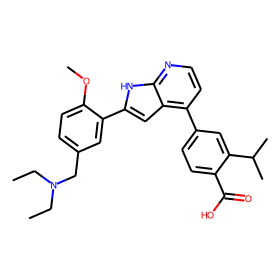

smiles:  COc1ccc(CN(C)C)cc1-c1cc2c(-c3ccc(C(=O)O)c(C(C)C)c3)ccnc2[nH]1
logD:  0.85
Jchem:  2.38
ADMET:  3.627
fpadmet:  1.456
prediction:  2.215


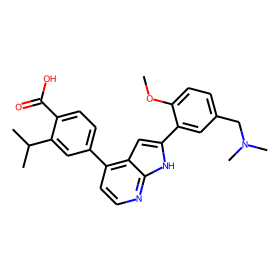

smiles:  CNC(=O)C(C)N(CC(c1ccccc1)c1ccccc1)C(=O)c1cn(C)c(=O)c(C)n1
logD:  4.1
Jchem:  2.14
ADMET:  2.402
fpadmet:  2.208
prediction:  3.122


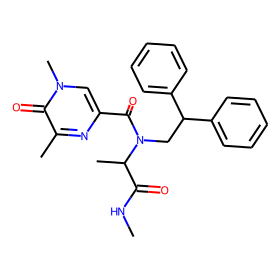

smiles:  CNC(=O)C(N(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1)C(C)(C)C
logD:  5.4
Jchem:  3.95
ADMET:  3.56
fpadmet:  2.788
prediction:  4.338


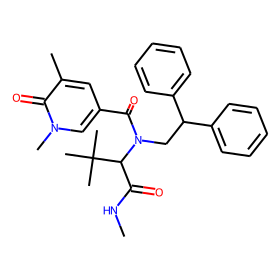

smiles:  O=C1CCC(N2C(=O)c3cccc(NCCOCCOCCOCc4ccccc4)c3C2=O)C(=O)N1
logD:  3.1
Jchem:  1.72
ADMET:  1.428
fpadmet:  2.411
prediction:  1.854


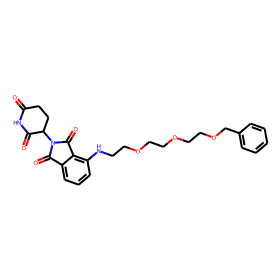

smiles:  O=C1CCC(N2C(=O)c3cccc(C#CCOCCOCCOCc4ccccc4)c3C2=O)C(=O)N1
logD:  3.2
Jchem:  2.0
ADMET:  2.076
fpadmet:  2.399
prediction:  2.037


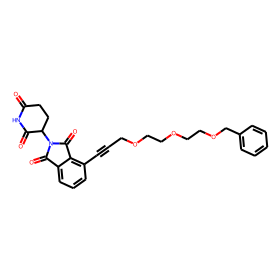

smiles:  O=C1CCC(N2C(=O)c3ccc(C#CCOCCOCCOCc4ccccc4)cc3C2=O)C(=O)N1
logD:  3.3
Jchem:  2.0
ADMET:  2.283
fpadmet:  2.317
prediction:  2.335


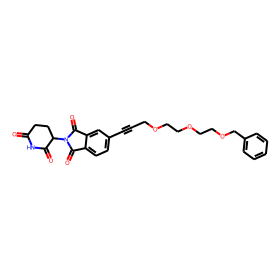

smiles:  C[C@H]1[C@H](O)CN1c1nc(N2C[C@H]3[C@H](CC(=O)O)[C@H]3C2)cc(C(F)(F)F)c1C#N
logD:  1.0
Jchem:  -1.2
ADMET:  2.39
fpadmet:  0.262
prediction:  1.065


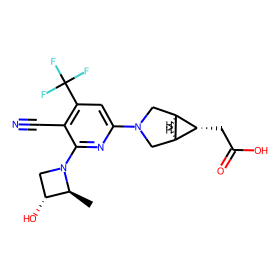

smiles:  C[C@H]1CCN1c1nc(N2C[C@H]3[C@H](CC(=O)O)[C@H]3C2)cc(C(F)(F)F)n1
logD:  1.0
Jchem:  -0.63
ADMET:  3.027
fpadmet:  0.141
prediction:  1.482


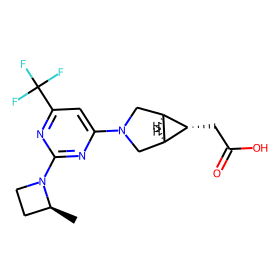

smiles:  N[C@@]1(C(=O)O)[C@@H](F)C[C@H]2[C@H](C(=O)O)[C@H]21
logD:  -4.02
Jchem:  -6.12
ADMET:  0.15
fpadmet:  -0.696
prediction:  0.034


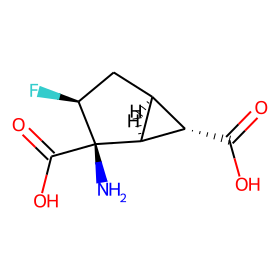

smiles:  CC(C)OC(=O)OC(C)OC(=O)[C@@H]1[C@@H]2[C@H]1C[C@H](F)[C@@]2(N)C(=O)O
logD:  0.06
Jchem:  -1.44
ADMET:  1.115
fpadmet:  0.57
prediction:  -0.937


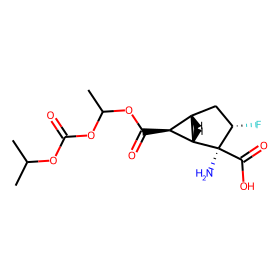

smiles:  Cc1oc(=O)oc1COC(=O)[C@]1(N)[C@@H](F)C[C@H]2[C@H](C(=O)O)[C@H]21
logD:  -0.95
Jchem:  -2.95
ADMET:  0.735
fpadmet:  0.769
prediction:  -1.632


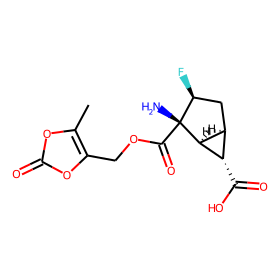

smiles:  Cc1nnc(C23CC(Nc4nc(Cc5ccc(Cl)cc5)cc(C(C)(C)O)n4)(C2)C3)o1
logD:  4.0
Jchem:  2.65
ADMET:  2.84
fpadmet:  2.63
prediction:  3.214


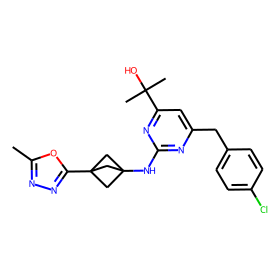

smiles:  O=C([C@H]1C[C@@H]2CC[C@H]1O2)N1CCC(CN[C@H]2CCN(c3nccn4ccnc34)C2)CC1
logD:  0.4
Jchem:  -2.01
ADMET:  1.775
fpadmet:  1.455
prediction:  0.303


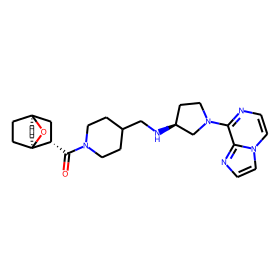

smiles:  N#C[C@@]1(c2ccc3c(N)ncnn23)O[C@H](CO)[C@@H](O)[C@H]1O
logD:  0.3
Jchem:  -1.88
ADMET:  -1.717
fpadmet:  0.937
prediction:  -0.527


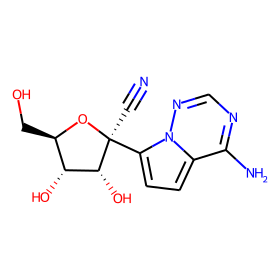

smiles:  CCC(=O)OC[C@H]1O[C@@](C#N)(c2ccc3c(N)ncnn23)[C@H](OC(=O)CC)[C@@H]1OC(=O)CC
logD:  2.7
Jchem:  1.54
ADMET:  0.799
fpadmet:  1.791
prediction:  2.582


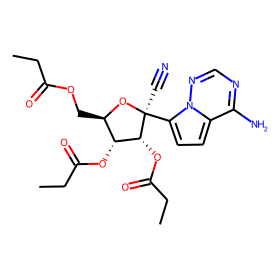

smiles:  CC(C)[C@H](N)C(=O)OC[C@H]1O[C@@](C#N)(c2ccc3c(N)ncnn23)[C@H](O)[C@@H]1O
logD:  0.5
Jchem:  -1.25
ADMET:  -1.704
fpadmet:  1.357
prediction:  -0.481


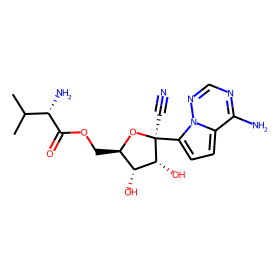

smiles:  CCOC(=O)[C@H](C)NP(=O)(N[C@@H](C)C(=O)OCC)OC[C@H]1O[C@@](C#N)(c2ccc3c(N)ncnn23)[C@H](O)[C@@H]1O
logD:  0.3
Jchem:  -1.61
ADMET:  -1.536
fpadmet:  1.345
prediction:  0.693


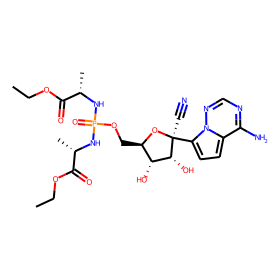

smiles:  O=C1Cc2cccc(c2)OCC/C=C/CCOc2cccc(c2)CC(=O)Nc2nnc(s2)CCCCc2nnc(s2)N1
logD:  3.16
Jchem:  4.81
ADMET:  4.959
fpadmet:  2.568
prediction:  4.083


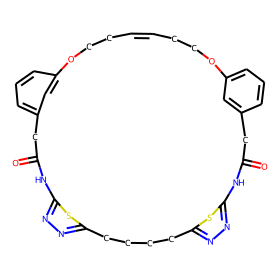

smiles:  O=C1Cc2cccc(c2)OCCC/C=C/CCCOc2cccc(c2)CC(=O)Nc2nnc(s2)CCCCc2nnc(s2)N1
logD:  3.49
Jchem:  5.7
ADMET:  5.216
fpadmet:  2.544
prediction:  4.494


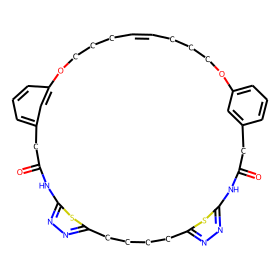

smiles:  O=C1Cc2cccc(c2)OCCCC/C=C/CCCCOc2cccc(c2)CC(=O)Nc2nnc(s2)CCCCc2nnc(s2)N1
logD:  3.85
Jchem:  6.59
ADMET:  5.42
fpadmet:  2.544
prediction:  4.683


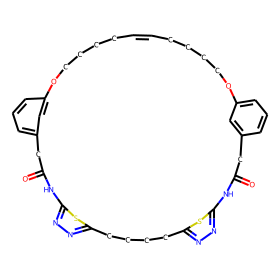

smiles:  O=C1Cc2ccc(cc2)OCC/C=C/CCOc2ccc(cc2)CC(=O)Nc2nnc(s2)CCCCc2nnc(s2)N1
logD:  3.52
Jchem:  4.81
ADMET:  4.951
fpadmet:  2.521
prediction:  4.554


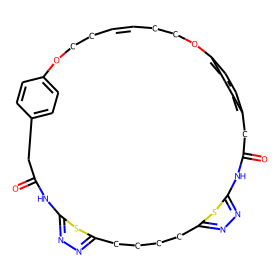

smiles:  O=C1Cc2ccc(cc2)OCCC/C=C/CCCOc2ccc(cc2)CC(=O)Nc2nnc(s2)CCCCc2nnc(s2)N1
logD:  3.62
Jchem:  5.7
ADMET:  5.231
fpadmet:  2.501
prediction:  5.026


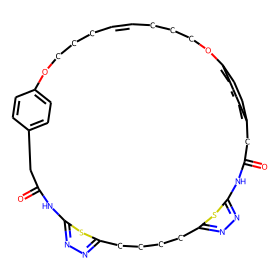

smiles:  O=C1Cc2ccc(cc2)OCCCC/C=C/CCCCOc2ccc(cc2)CC(=O)Nc2nnc(s2)CCCCc2nnc(s2)N1
logD:  3.91
Jchem:  6.59
ADMET:  5.441
fpadmet:  2.501
prediction:  5.271


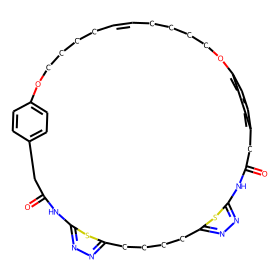

smiles:  O=C1Cc2cccc(c2)OCCC/C=C/CCCOc2cccc(c2)CC(=O)Nc2nnc(s2)CCCCc2ccc(nn2)N1
logD:  3.48
Jchem:  5.65
ADMET:  4.506
fpadmet:  2.853
prediction:  4.162


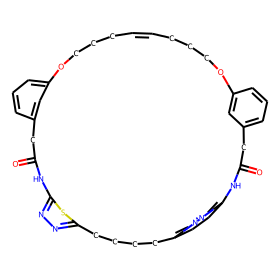

smiles:  O=C1Cc2ccccc2OCCCC/C=C/CCCCOc2cccc(c2)CC(=O)Nc2nnc(s2)CCCCc2ccc(nn2)N1
logD:  3.72
Jchem:  6.53
ADMET:  4.799
fpadmet:  3.004
prediction:  4.491


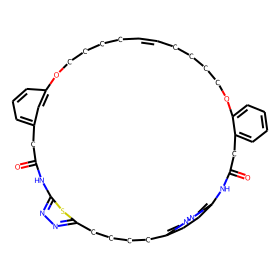

smiles:  O=C(Nc1ccccc1)c1cnc(NCc2c(F)ccc3c2CCO3)n2cnnc12
logD:  4.1
Jchem:  1.6
ADMET:  2.833
fpadmet:  2.989
prediction:  2.765


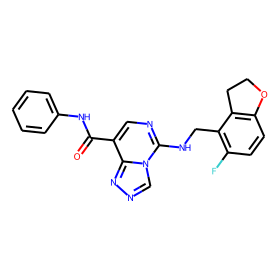

smiles:  Cc1ncnc2c1ccn2[C@@H]3O[C@@H]4[C@H](Cc5ccc6cc(Cl)c(N)nc6c5)CC[C@]4(O)[C@H]3O
logD:  2.0
Jchem:  3.02
ADMET:  3.107
fpadmet:  2.645
prediction:  2.795


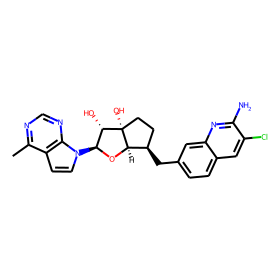

smiles:  Nc1nc2cc(C[C@@H]3CC[C@]4(O)[C@@H](O)[C@@H](C[C@H]34)n5ccc6c(N)ncnc56)ccc2cc1Br
logD:  1.8
Jchem:  2.94
ADMET:  2.845
fpadmet:  2.471
prediction:  2.148


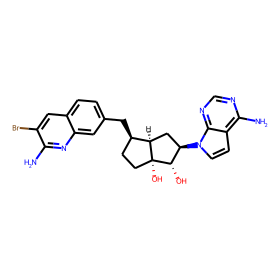

smiles:  Cc1ncnc2c1ccn2C3CC4C(Cc5ccc6cc(Cl)c(N)nc6c5)CCC4(O)C3O
logD:  2.0
Jchem:  3.17
ADMET:  3.768
fpadmet:  2.623
prediction:  3.058


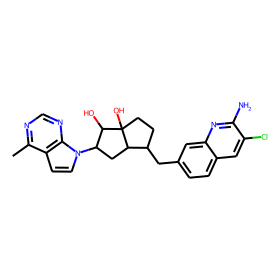

smiles:  Cc1ncnc2c1ccn2[C@@H]3C[C@@H]4[C@H](Cc5ccc6cc(F)c(N)nc6c5)CC[C@]4(O)[C@H]3O
logD:  1.7
Jchem:  2.71
ADMET:  3.48
fpadmet:  2.501
prediction:  2.735


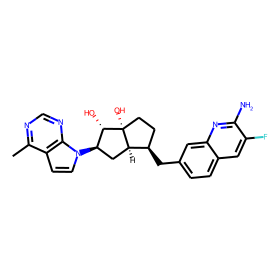

smiles:  CCC[C@H]1C(=O)N[C@@H](C2CCCCCC2)C(=O)N[C@@H](CN)C(=O)N[C@@H](CO[C@H]2C[C@H](N)C2)C(=O)N[C@H](C)CO[C@H](CC2CC3(CCC3)C2)[C@@H](C)C(=O)N1C
logD:  2.2
Jchem:  -2.07
ADMET:  3.74
fpadmet:  1.197
prediction:  1.13


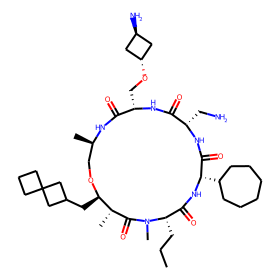

smiles:  CCC[C@H]1C(=O)N[C@@H](C2CCCCCC2)C(=O)N[C@@H](CN)C(=O)N[C@@H](CO[C@H]2C[C@H](N)C2)C(=O)N[C@H](C)CO[C@H](CC2C[C@H]3CC[C@@H](C2)C3)[C@@H](C)C(=O)N1C
logD:  1.7
Jchem:  -1.64
ADMET:  4.229
fpadmet:  1.161
prediction:  1.647


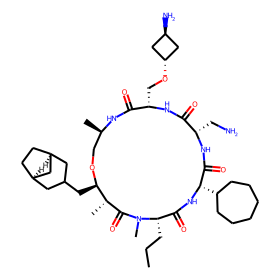

smiles:  CCC[C@H]1C(=O)N[C@@H](C2CCCCCC2)C(=O)N[C@@H](CN)C(=O)N[C@@H](COCCCNCCCN)C(=O)N[C@H](C)CO[C@H](CC2C[C@H]3CC[C@@H](C2)C3)[C@@H](C)C(=O)N1C
logD:  0.2
Jchem:  -2.95
ADMET:  3.704
fpadmet:  1.11
prediction:  0.245


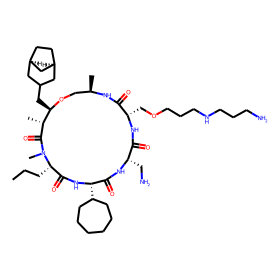

smiles:  CCCC[C@H]1C(=O)N(C)[C@@H](CCC)C(=O)N[C@@H](C2CCCCC2)C(=O)N[C@@H](CN)C(=O)N[C@@H](CO[C@H]2C[C@H](N)C2)C(=O)N[C@H](C)CN1CCCC
logD:  1.5
Jchem:  -2.45
ADMET:  3.734
fpadmet:  0.792
prediction:  0.795


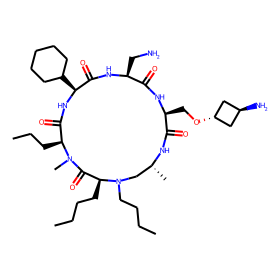

smiles:  CNc1nc2nc3c1[nH]c(=O)n3Cc1cccc(c1)OCC(=O)N(C)CCO2
logD:  3.0
Jchem:  0.96
ADMET:  1.571
fpadmet:  2.494
prediction:  1.651


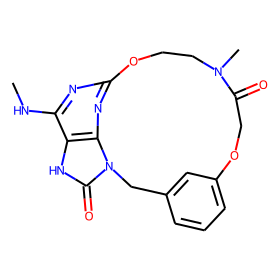

smiles:  CC(C)n1cc(C(=O)c2ccnc(NC(=O)Nc3ccc(F)cc3F)c2)c2c(N)ncnc21
logD:  4.6
Jchem:  3.54
ADMET:  2.625
fpadmet:  2.49
prediction:  3.114


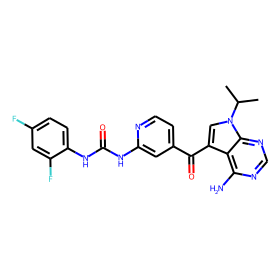

smiles:  CC(C)(CO)n1cc(C(=O)c2cncc(NC(=O)Cc3ccc(Cl)cc3)c2)c2cnc(N)nc21
logD:  3.7
Jchem:  2.51
ADMET:  1.932
fpadmet:  2.67
prediction:  2.71


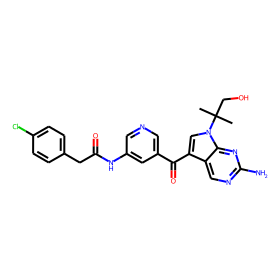

smiles:  CC1(CN)CCN(c2cnc(Sc3cccnc3C(F)(F)F)c(N)n2)CC1
logD:  -1.6
Jchem:  0.49
ADMET:  2.294
fpadmet:  2.263
prediction:  1.06


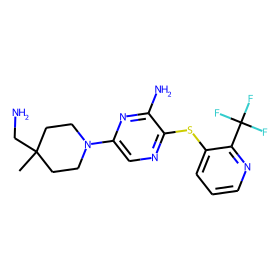

smiles:  Nc1nccc(Sc2cnc(N3CCC4(CCC[C@H]4N)CC3)cn2)c1Cl
logD:  1.2
Jchem:  0.11
ADMET:  3.3
fpadmet:  2.32
prediction:  0.907


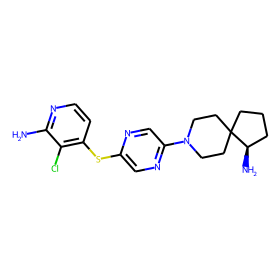

smiles:  Nc1ncc(-c2cc(N[C@@]3(CO)CCN(C(=O)OCC(F)F)C3)nc(N3CCOCC3)n2)cn1
logD:  1.7
Jchem:  0.14
ADMET:  0.019
fpadmet:  2.323
prediction:  1.12


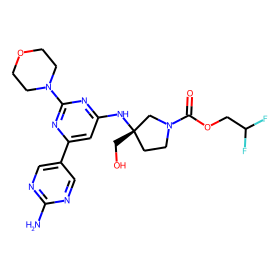

smiles:  COc1cc(-c2noc([C@H](C)NC(=O)c3cc(C(F)(F)F)nn3C)n2)cc(C)n1
logD:  4.4
Jchem:  2.46
ADMET:  3.105
fpadmet:  2.259
prediction:  3.332


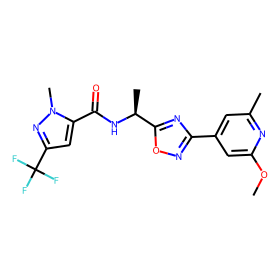

smiles:  C[C@H](NC(=O)c1cc(C(F)(F)F)nn1C)c1nc(-c2ccnc(C3CC3)c2)no1
logD:  4.1
Jchem:  2.74
ADMET:  3.084
fpadmet:  2.185
prediction:  3.286


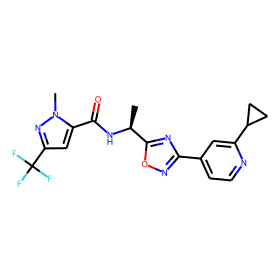

smiles:  C[C@H]1C[C@@H](c2ccncc2NC(=O)c2ccnc(-c3c(F)cccc3F)n2)C[C@@H](O)[C@]1(C)O
logD:  1.3
Jchem:  3.06
ADMET:  2.402
fpadmet:  2.453
prediction:  2.584


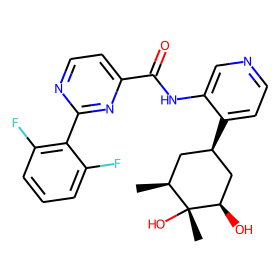

smiles:  CNC(=O)c1csc2c(C(F)(F)F)cc(N3CCC(OC(=O)N4CC(OC(F)(F)F)C4)CC3)nc12
logD:  5.13
Jchem:  3.98
ADMET:  3.795
fpadmet:  2.132
prediction:  4.019


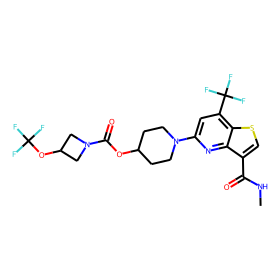

smiles:  CC(C)(O)c1ccc2c(c1)C(=O)N(Cc1ccc(Cl)cn1)[C@@]2(OCC1(CO)CC1)c1ccc(Cl)cc1
logD:  0.3
Jchem:  4.86
ADMET:  3.378
fpadmet:  2.703
prediction:  4.022


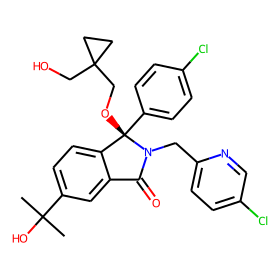

smiles:  CCC[C@@H](NC(=O)c1cccc2[nH]c(=O)oc12)[C@@H](O)c1cccc(Cl)c1C
logD:  5.1
Jchem:  4.0
ADMET:  3.809
fpadmet:  2.327
prediction:  3.376


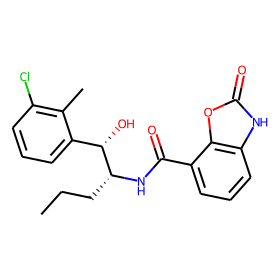

smiles:  CCC[C@@H](NC(=O)c1cccc2oc(=O)[nH]c12)[C@@H](O)c1cccc(Cl)c1C
logD:  5.2
Jchem:  3.99
ADMET:  3.961
fpadmet:  2.283
prediction:  3.098


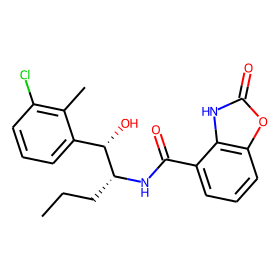

smiles:  C/C=C1\NC(=O)C(NC(=O)CCCCCCCCC)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  3.756
Jchem:  -13.44
ADMET:  -0.893
fpadmet:  -0.05
prediction:  -0.666


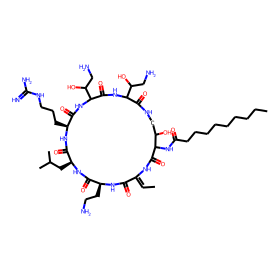

smiles:  C/C=C1\NC(=O)C(NC(=O)c2cc3cc(Cl)ccc3o2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  2.829
Jchem:  -14.71
ADMET:  -1.39
fpadmet:  1.928
prediction:  -0.924


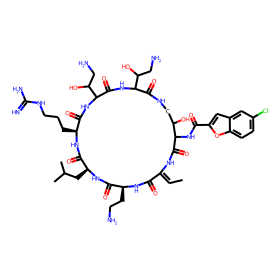

smiles:  C/C=C1\NC(=O)C(NC(=O)COc2ccc(/C=C/C(=O)OC(C)(C)C)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  2.65
Jchem:  -14.14
ADMET:  -0.893
fpadmet:  0.517
prediction:  -1.252


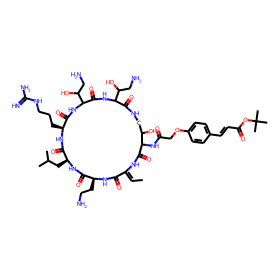

smiles:  C/C=C1\NC(=O)C(NC(=O)c2ccc(Oc3ccccc3CCCC)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  4.984
Jchem:  -12.05
ADMET:  -0.154
fpadmet:  1.702
prediction:  -0.846


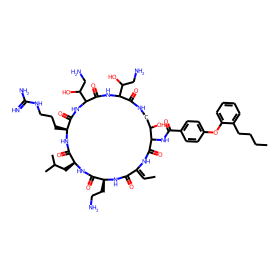

smiles:  C/C=C1\NC(=O)C(NC(=O)c2ccc(Oc3ccccc3-c3ccccc3)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  4.648
Jchem:  -12.29
ADMET:  -0.464
fpadmet:  2.536
prediction:  -0.643


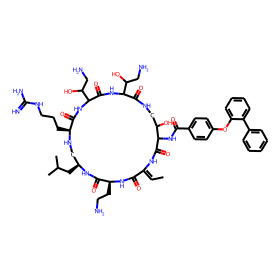

smiles:  C/C=C1\NC(=O)C(NC(=O)c2ccc(-c3ccc(Cl)cc3)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  3.752
Jchem:  -13.18
ADMET:  -0.386
fpadmet:  2.017
prediction:  -0.929


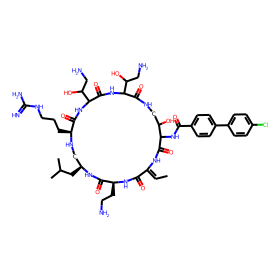

smiles:  C/C=C1\NC(=O)C(NC(=O)c2ccc(OCCCCc3ccccc3)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  4.37
Jchem:  -12.69
ADMET:  -0.889
fpadmet:  1.612
prediction:  -1.4


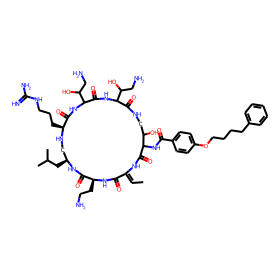

smiles:  C/C=C1\NC(=O)C(NC(=O)C[C@H](O)CCCCCCCCCCC)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  4.479
Jchem:  -12.93
ADMET:  0.31
fpadmet:  -0.069
prediction:  -0.022


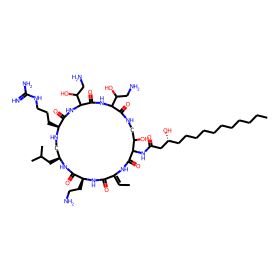

smiles:  C/C=C1\NC(=O)C(NC(=O)CCCc2ccc(C)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  2.993
Jchem:  -14.05
ADMET:  -2.127
fpadmet:  -0.461
prediction:  -2.11


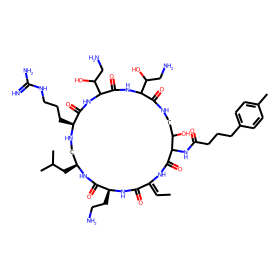

smiles:  C/C=C1\NC(=O)C(NC(=O)CCCc2ccc(C(C)(C)C)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  3.907
Jchem:  -13.02
ADMET:  -0.966
fpadmet:  -0.319
prediction:  -1.46


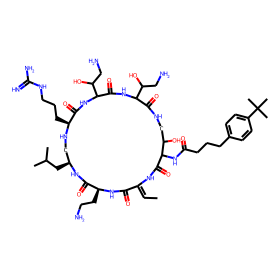

smiles:  C/C=C1\NC(=O)C(NC(=O)c2ccc(Oc3ccc(C)cc3)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  3.616
Jchem:  -13.42
ADMET:  -1.218
fpadmet:  1.597
prediction:  -1.512


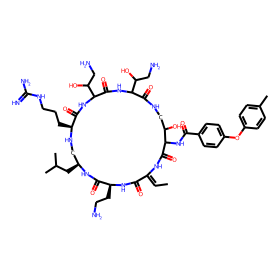

smiles:  COc1ncc(C2=CCOCC2)cc1S(=O)(=O)Nc1cncc(C#CCN2C[C@H](C)O[C@H](C)C2)c1
logD:  3.6
Jchem:  1.37
ADMET:  1.486
fpadmet:  1.752
prediction:  1.487


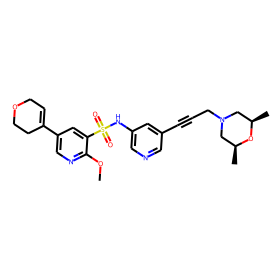

smiles:  COc1ncc(C2=CCOCC2)cc1S(=O)(=O)Nc1cncc(-c2ccc(CN3CCNCC3)cc2)c1
logD:  3.3
Jchem:  0.58
ADMET:  1.334
fpadmet:  2.236
prediction:  0.583


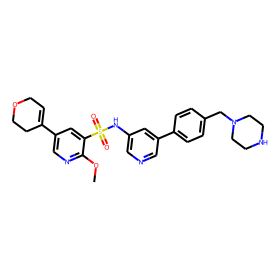

smiles:  COc1ncc(C2=CCOCC2)cc1S(=O)(=O)Nc1cncc(-c2cccc(CN3CCCCC3)c2)c1
logD:  3.5
Jchem:  1.76
ADMET:  2.231
fpadmet:  2.285
prediction:  1.273


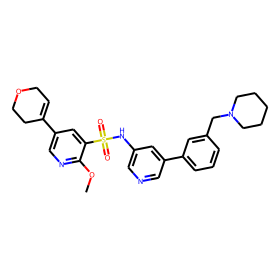

smiles:  COc1ncc(C2=CCOCC2)cc1S(=O)(=O)Nc1cncc(-c2ccc(CN3CCCCC3)s2)c1
logD:  4.7
Jchem:  1.73
ADMET:  2.383
fpadmet:  2.162
prediction:  1.604


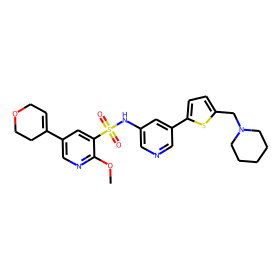

smiles:  COc1ncc(C2=CCOCC2)cc1S(=O)(=O)Nc1cncc(-c2ccc(CN3C[C@H](C)N(C)[C@H](C)C3)cc2)c1
logD:  3.1
Jchem:  1.72
ADMET:  1.66
fpadmet:  2.261
prediction:  1.513


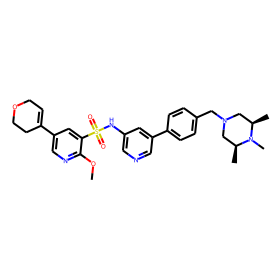

smiles:  COc1ncc(C2=CCOCC2)cc1S(=O)(=O)Nc1cncc(-c2ccc(N3CCN(C(C)C)CC3)cc2)c1
logD:  3.8
Jchem:  1.95
ADMET:  2.339
fpadmet:  2.285
prediction:  1.393


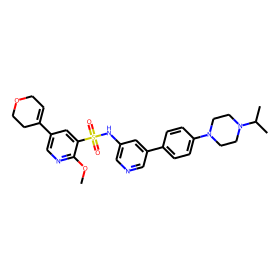

smiles:  CC(C)(O)c1cnc(N2C[C@@]3(CCC[C@](C)(Cn4cnc5ccc(C#N)cc54)C3)OC2=O)cn1
logD:  4.0
Jchem:  2.88
ADMET:  2.172
fpadmet:  2.157
prediction:  2.996


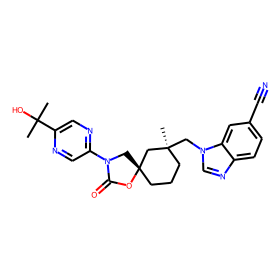

smiles:  COc1cc(F)cc([C@@H](CO)NC(=O)[C@@H](C)N2Cc3ccc(-c4nc(NC5COC5)ncc4Cl)cc3C2=O)c1
logD:  3.3
Jchem:  2.27
ADMET:  1.947
fpadmet:  2.67
prediction:  2.9


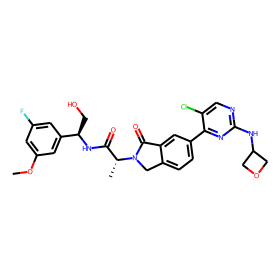

smiles:  COc1cc(F)cc([C@@H](CO)NC(=O)[C@@H](C)N2Cc3ccc(-c4nc(Nc5cnn(C)n5)ncc4Cl)cc3C2=O)c1
logD:  3.7
Jchem:  2.2
ADMET:  2.538
fpadmet:  2.621
prediction:  3.233


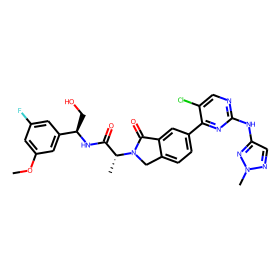

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)COCCOCCOCCOCCOc2cc3nccc(Nc4ccc5scnc5c4)c3cc2S(=O)(=O)C(C)(C)C)CC1
logD:  4.5
Jchem:  3.37
ADMET:  2.941
fpadmet:  2.586
prediction:  2.255


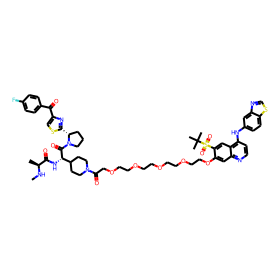

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)COCCOCCOCCOCCOc2cc3ncnc(Nc4n[nH]c(C)c4C)c3cc2S(=O)(=O)C(C)(C)C)CC1
logD:  0.84
Jchem:  2.93
ADMET:  2.264
fpadmet:  2.532
prediction:  2.103


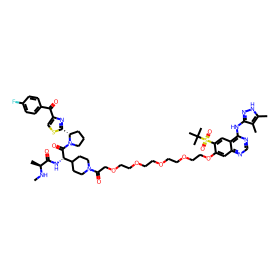

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCC(COc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.46
Jchem:  4.43
ADMET:  3.445
fpadmet:  2.54
prediction:  3.183


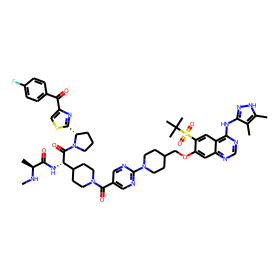

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCC(CCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.61
Jchem:  4.8
ADMET:  3.652
fpadmet:  2.524
prediction:  3.323


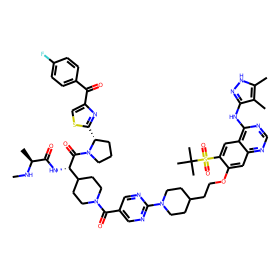

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCC(CCCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.66
Jchem:  5.24
ADMET:  3.901
fpadmet:  2.524
prediction:  3.578


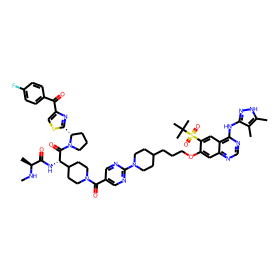

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCN(CCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.48
Jchem:  3.81
ADMET:  2.936
fpadmet:  2.535
prediction:  2.748


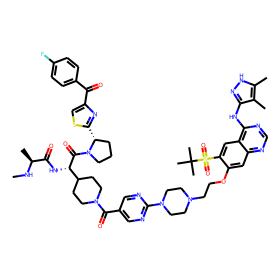

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCN(CCCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.78
Jchem:  3.86
ADMET:  3.045
fpadmet:  2.524
prediction:  2.649


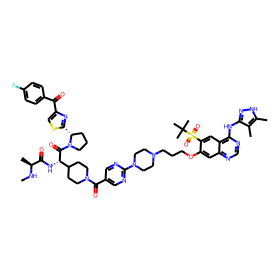

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2ccc(N3CCN(CCCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.64
Jchem:  4.48
ADMET:  3.282
fpadmet:  2.524
prediction:  2.713


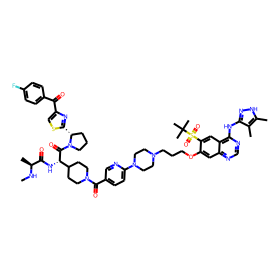

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCN(CCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)cn2)CC1
logD:  0.46
Jchem:  3.6
ADMET:  2.995
fpadmet:  2.531
prediction:  2.624


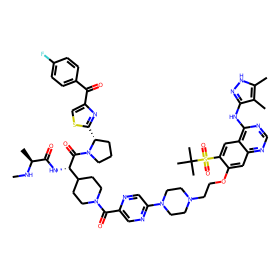

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCN(CCCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)cn2)CC1
logD:  0.72
Jchem:  3.65
ADMET:  3.103
fpadmet:  2.525
prediction:  2.539


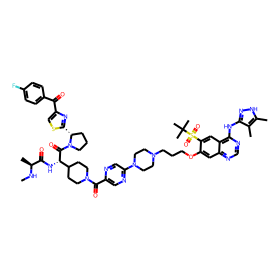

smiles:  O=C(/C=C/CNCCOc1ccc(Oc2c(-c3ccc(F)cc3)sc3cc(O)ccc23)cc1)N1CCC1
logD:  1.67
Jchem:  3.63
ADMET:  4.179
fpadmet:  3.253
prediction:  3.695


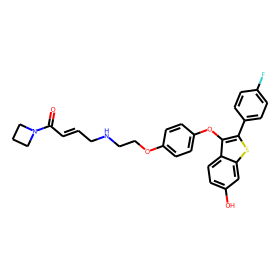

smiles:  N#Cc1ccc(CN(Cc2nnc(N)o2)C(=O)CSc2ccccc2OC(F)(F)F)c(F)c1
logD:  1.6
Jchem:  3.2
ADMET:  3.421
fpadmet:  2.794
prediction:  3.298


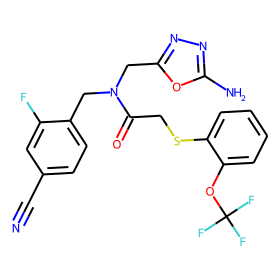

smiles:  Nc1ncc(-c2nc(N3CCOCC3)nc3c2CCN3[C@H]2CCNC2)cn1
logD:  -0.74
Jchem:  -1.87740717
ADMET:  0.905
fpadmet:  2.22
prediction:  -0.096


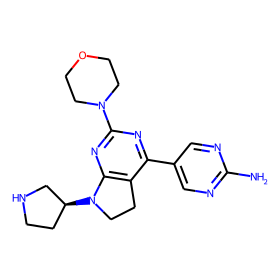

smiles:  CC(C)(C)OC(=O)N1CC[C@](C)(N2CCc3c(-c4cnc(N)nc4)nc(N4CCOCC4)nc32)C1
logD:  3.7
Jchem:  2.461204002
ADMET:  2.613
fpadmet:  2.65
prediction:  3.195


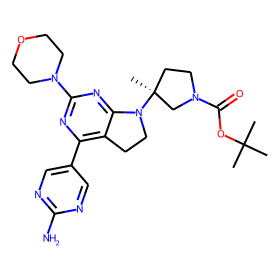

smiles:  O=c1c2ccccc2[se]n1-c1ccc(C(F)(F)F)cc1
logD:  1.67
Jchem:  3.5376
ADMET:  3.52
fpadmet:  3.0
prediction:  2.994


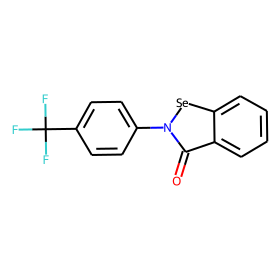

smiles:  O=c1c2ccccc2[se]n1-c1cccc(Cl)c1
logD:  1.45
Jchem:  3.1728
ADMET:  2.948
fpadmet:  3.07
prediction:  2.795


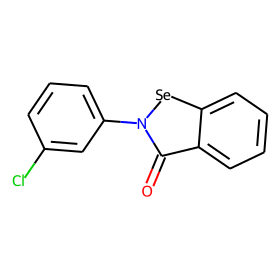

smiles:  Cc1c(-c2ccccc2)nc2ccc(Br)cc2c1CNc1ccc(C(=O)O)cc1F
logD:  2.3
Jchem:  3.563392796
ADMET:  3.748
fpadmet:  1.739
prediction:  2.216


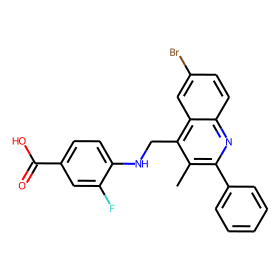

smiles:  Cc1c(-c2ccccc2)nc2ccc(Br)cc2c1C(=O)NCC(CCCC(=O)O)c1ccccc1Cl
logD:  2.3
Jchem:  4.482832173
ADMET:  4.341
fpadmet:  1.792
prediction:  2.732


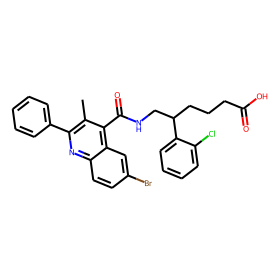

smiles:  COCCN(Cc1ccc(F)cc1)S(=O)(=O)c1cc(C(=O)N2CCOCC2)ccc1OC
logD:  2.9
Jchem:  1.76864897
ADMET:  1.534
fpadmet:  2.24
prediction:  1.946


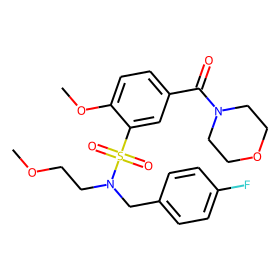

smiles:  CC1(C)NC(=O)C(c2ccc(F)c(C(F)(F)F)c2)C1=O
logD:  0.5
Jchem:  2.813945213
ADMET:  2.58
fpadmet:  1.782
prediction:  2.16


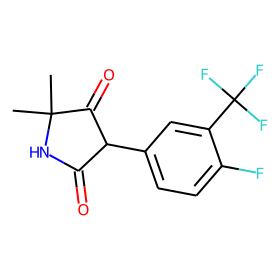

smiles:  CCN(CC)Cc1ccc(OC)c(-c2cc3c(-c4ccc(C(=O)O)cc4)ccnc3[nH]2)c1
logD:  0.65
Jchem:  1.858027589
ADMET:  3.51
fpadmet:  1.393
prediction:  1.24


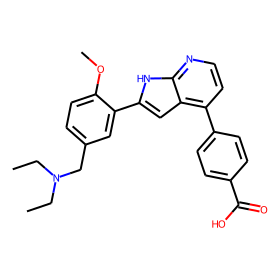

smiles:  CCOC(=O)c1ccc(-c2ccnc3[nH]c(-c4cc(CN(CC)CC)ccc4OC)cc23)cc1C(C)C
logD:  2.45
Jchem:  4.438234523
ADMET:  4.627
fpadmet:  1.922
prediction:  4.142


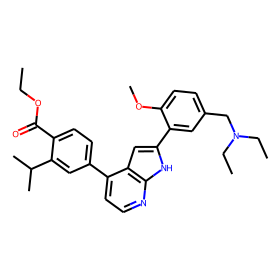

smiles:  COc1ccc(CN)cc1-c1cc2c(-c3ccc(C(=O)O)c(C(C)C)c3)ccnc2[nH]1
logD:  0.61
Jchem:  2.038636
ADMET:  2.857
fpadmet:  1.412
prediction:  1.583


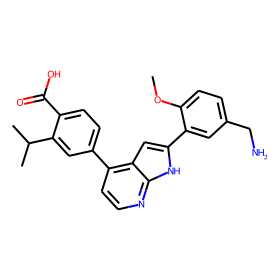

smiles:  N=C(N)NC(=O)c1nc(-c2cc3ccccc3s2)c(N)nc1N
logD:  2.9
Jchem:  1.556102195
ADMET:  0.718
fpadmet:  2.354
prediction:  2.051


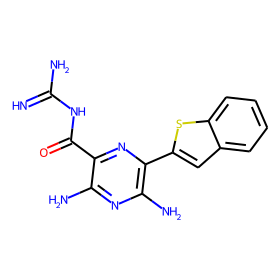

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2C[C@@H]2C)cc(Cc2ccccc2)n1
logD:  4.6
Jchem:  2.086303543
ADMET:  2.974
fpadmet:  1.914
prediction:  2.539


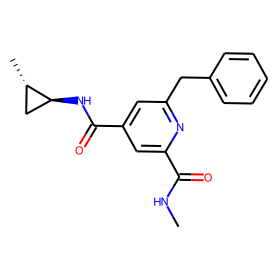

smiles:  CNC(=O)c1cc(C(=O)N[C@@H]2[C@H]3C[C@@H](O)C[C@H]32)cc(Cc2ccccc2)n1
logD:  3.5
Jchem:  1.045400596
ADMET:  2.28
fpadmet:  1.768
prediction:  1.557


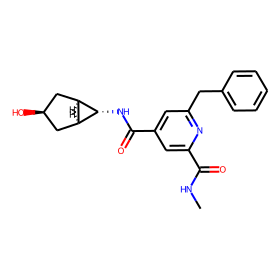

smiles:  CNC(=O)c1cc(C(=O)NC2C3COCC32)cc(C(C)c2ccccc2)n1
logD:  4.1
Jchem:  1.36572243
ADMET:  2.243
fpadmet:  1.945
prediction:  2.54


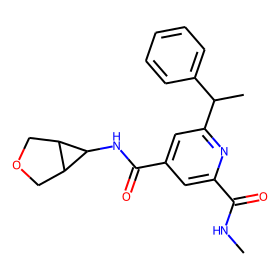

smiles:  CNC(=O)c1cc(C(=O)NC2C3CC(O)CC32)cc(C(C)c2ccccc2)n1
logD:  4.1
Jchem:  1.588386867
ADMET:  2.242
fpadmet:  1.798
prediction:  2.355


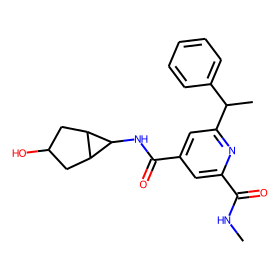

smiles:  CNC(=O)c1cc(C(=O)NC2C3CC(O)CC32)cc(C(C)c2ccccc2)n1
logD:  3.6
Jchem:  1.588386867
ADMET:  2.242
fpadmet:  1.798
prediction:  2.303


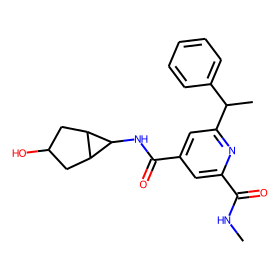

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2C[C@@H]2C)cc(C(OC)c2ccccc2)n1
logD:  4.3
Jchem:  2.014271444
ADMET:  2.773
fpadmet:  1.767
prediction:  2.601


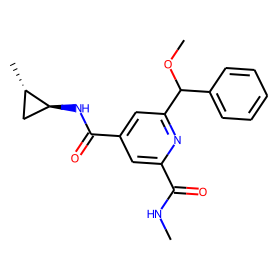

smiles:  CNC(=O)c1cc(C(=O)N[C@@H]2[C@H]3COC[C@H]32)cc(C(OC)c2ccccc2)n1
logD:  3.4
Jchem:  0.750704059
ADMET:  2.161
fpadmet:  1.797
prediction:  2.067


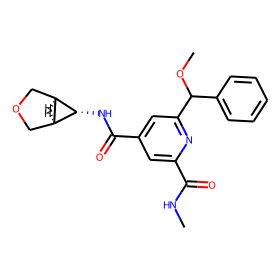

smiles:  CNC(=O)c1cc(C(=O)NC2CC2C)cc(C(CO)c2ccccc2)n1
logD:  3.3
Jchem:  1.348518628
ADMET:  2.137
fpadmet:  1.774
prediction:  2.393


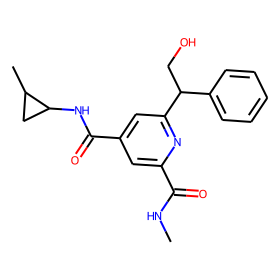

smiles:  CNC(=O)c1cc(C(=O)NC2CC2C)cc(C(CC#N)c2ccccc2)n1
logD:  4.0
Jchem:  1.811565505
ADMET:  2.488
fpadmet:  1.799
prediction:  2.463


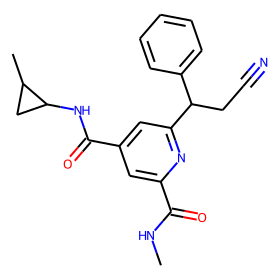

smiles:  CNC(=O)c1cc(C(=O)NC2C3COCC32)cc(C(CC#N)c2ccccc2)n1
logD:  3.1
Jchem:  0.547998121
ADMET:  1.636
fpadmet:  1.801
prediction:  2.05


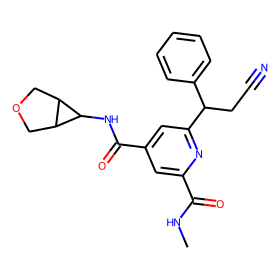

smiles:  CNC(=O)c1cc(C(=O)NC2CC2C)cc(C(O)c2ccccc2)n1
logD:  3.2
Jchem:  1.371143623
ADMET:  1.95
fpadmet:  1.556
prediction:  2.206


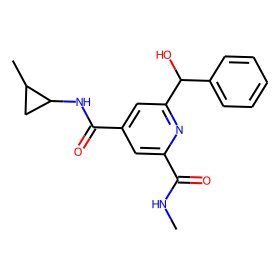

smiles:  Cn1c(=O)c2cc(C(=O)NCCCN3CCCCCC3)sc2c2ccccc21
logD:  1.89
Jchem:  0.807135184
ADMET:  3.37
fpadmet:  2.818
prediction:  2.26


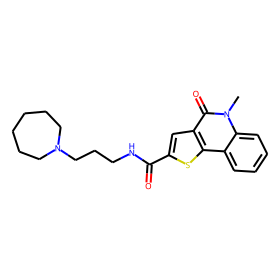

smiles:  CNC(=O)CN(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(OC)c(C)c1
logD:  5.7
Jchem:  4.547037632
ADMET:  3.549
fpadmet:  3.275
prediction:  4.124


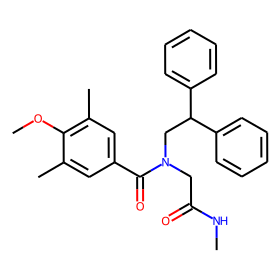

smiles:  CCN(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1
logD:  4.9
Jchem:  3.580270903
ADMET:  3.4
fpadmet:  3.097
prediction:  3.912


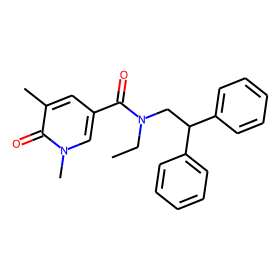

smiles:  Cc1cc(C(=O)N(CC(c2ccccc2)c2ccccc2)C(C)C#N)cn(C)c1=O
logD:  4.8
Jchem:  3.328159369
ADMET:  3.097
fpadmet:  3.025
prediction:  3.815


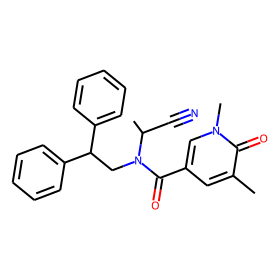

smiles:  Cc1cc(C(=O)N(CC(c2ccccc2)c2ccccc2)C(C)C2CCCO2)cn(C)c1=O
logD:  5.1
Jchem:  4.058626986
ADMET:  3.373
fpadmet:  2.966
prediction:  4.144


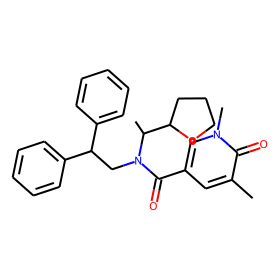

smiles:  Cc1cc(C(=O)N(CC(c2ccccc2)c2ccccc2)C(C)CN2CCOCC2)cn(C)c1=O
logD:  5.4
Jchem:  3.376877392
ADMET:  3.167
fpadmet:  2.978
prediction:  4.76


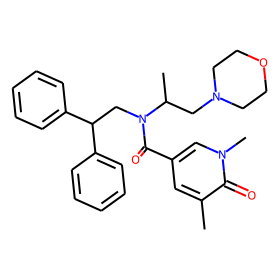

smiles:  COCC(COC)N(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1
logD:  5.5
Jchem:  3.189278996
ADMET:  2.866
fpadmet:  3.019
prediction:  3.329


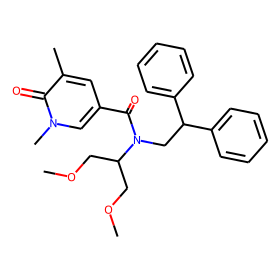

smiles:  CCNC(=O)C(C)N(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1
logD:  4.3
Jchem:  3.043751905
ADMET:  2.901
fpadmet:  2.84
prediction:  3.767


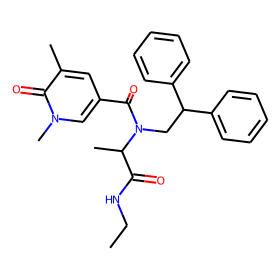

smiles:  CCNC(=O)C(C)N(CC(c1ccccc1)c1ccccc1)C(=O)c1ccc(=O)n(C)c1
logD:  3.7
Jchem:  2.648201421
ADMET:  2.317
fpadmet:  2.857
prediction:  2.977


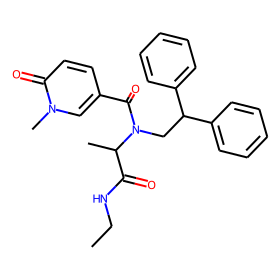

smiles:  CCNC(=O)C(C)N(CC(c1ccccc1)c1ccccc1)C(=O)C1CCC(=O)N(C)C1
logD:  3.9
Jchem:  2.439896997
ADMET:  2.154
fpadmet:  2.178
prediction:  2.503


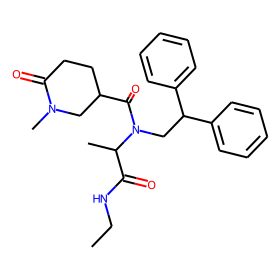

smiles:  CNC(=O)CN(CC(c1ccccc1)C(C)C)C(=O)c1cc(C)c(=O)n(C)c1
logD:  3.3
Jchem:  1.715963497
ADMET:  2.154
fpadmet:  1.882
prediction:  2.609


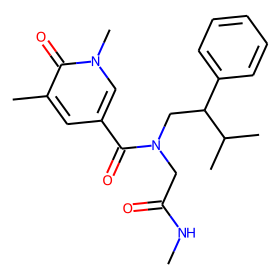

smiles:  CCOC(CN(CC(=O)NC)C(=O)c1cc(C)c(=O)n(C)c1)c1ccccc1
logD:  2.7
Jchem:  0.700341226
ADMET:  1.297
fpadmet:  1.84
prediction:  1.735


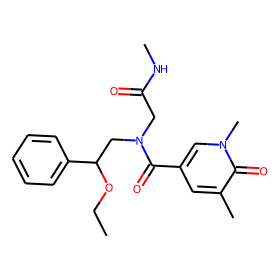

smiles:  CNC(=O)C(C)N(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1
logD:  3.7
Jchem:  2.686943951
ADMET:  2.605
fpadmet:  2.84
prediction:  3.265


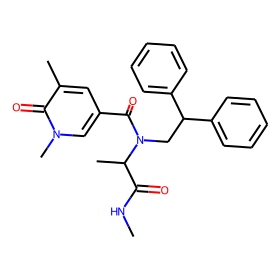

smiles:  CCC(C(=O)NC)N(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1
logD:  4.3
Jchem:  3.209466339
ADMET:  3.038
fpadmet:  2.84
prediction:  3.579


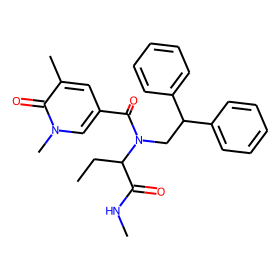

smiles:  CNC(=O)C(C(C)C)N(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1
logD:  4.9
Jchem:  3.574439155
ADMET:  2.999
fpadmet:  2.828
prediction:  3.863


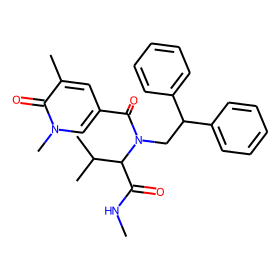

smiles:  CNC(=O)C(C1CC1)N(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1
logD:  4.4
Jchem:  3.110713252
ADMET:  2.968
fpadmet:  2.854
prediction:  3.776


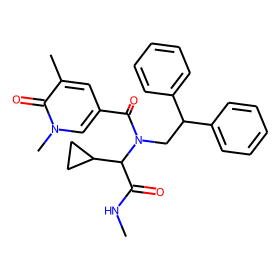

smiles:  CNC(=O)C(C1CCC1)N(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1
logD:  4.9
Jchem:  3.555281918
ADMET:  3.25
fpadmet:  2.652
prediction:  4.106


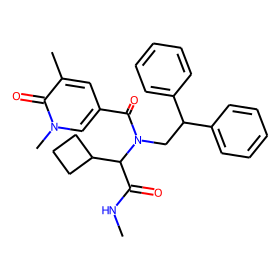

smiles:  CNC(=O)C(C1COC1)N(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1
logD:  3.6
Jchem:  2.165421372
ADMET:  2.139
fpadmet:  2.818
prediction:  2.992


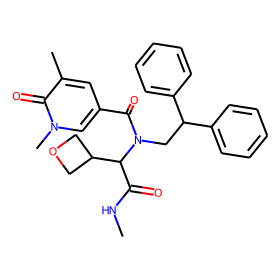

smiles:  CNC(=O)C(C1CCOC1)N(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1
logD:  4.0
Jchem:  2.348910886
ADMET:  2.572
fpadmet:  2.942
prediction:  3.217


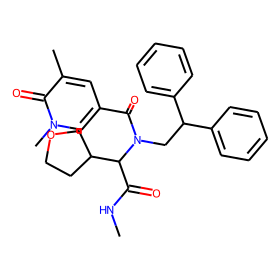

smiles:  CNC(=O)C1(N(CC(c2ccccc2)c2ccccc2)C(=O)c2cc(C)c(=O)n(C)c2)CC1
logD:  4.4
Jchem:  2.811891388
ADMET:  2.908
fpadmet:  2.754
prediction:  3.422


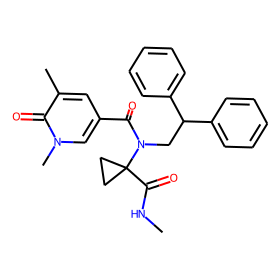

smiles:  CNC(=O)C1(N(CC(c2ccccc2)c2ccccc2)C(=O)c2cc(C)c(=O)n(C)c2)CCC1
logD:  4.9
Jchem:  3.256460042
ADMET:  3.1
fpadmet:  2.574
prediction:  3.583


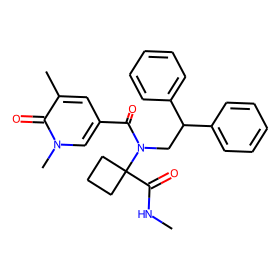

smiles:  O=C1CCC(N2C(=O)c3ccc(OCCOCCOCCOCc4ccccc4)cc3C2=O)C(=O)N1
logD:  2.9
Jchem:  1.441555161
ADMET:  1.551
fpadmet:  2.348
prediction:  1.838


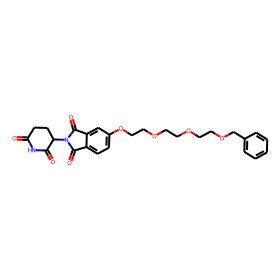

smiles:  COc1ccc(-c2ccc(C(=O)O)cc2C)cc1-c1c(C)cc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  6.0
Jchem:  7.243028307
ADMET:  4.428
fpadmet:  2.061
prediction:  4.71


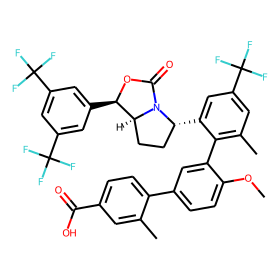

smiles:  COc1cc(F)c(-c2ccc(C(=O)O)cc2C)cc1-c1cc(C)c(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  6.0
Jchem:  7.339739435
ADMET:  4.295
fpadmet:  2.066
prediction:  4.622


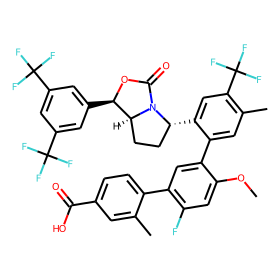

smiles:  COc1ccc([C@H]2CCC(=O)N[C@@H]2C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  5.9
Jchem:  7.829039764
ADMET:  4.86
fpadmet:  2.762
prediction:  5.213


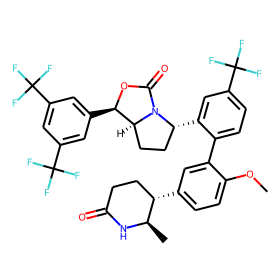

smiles:  COc1ccc(C2CNC(=O)OC2(C)C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  5.7
Jchem:  8.060121316
ADMET:  4.253
fpadmet:  2.96
prediction:  5.488


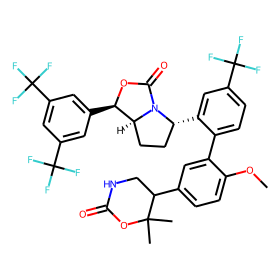

smiles:  COc1cc(F)c(-c2ccc(-c3nnc(N)o3)cc2C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C)cc(C(F)(F)F)c3)OC(=O)N12
logD:  6.6
Jchem:  8.822428809
ADMET:  4.55
fpadmet:  2.726
prediction:  5.399


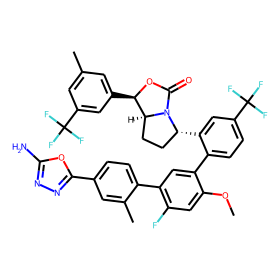

smiles:  COc1cc(F)c(-c2ccc(-c3n[nH]c(=O)o3)cc2C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C)cc(C(F)(F)F)c3)OC(=O)N12
logD:  6.9
Jchem:  9.332662172
ADMET:  4.51
fpadmet:  2.79
prediction:  5.666


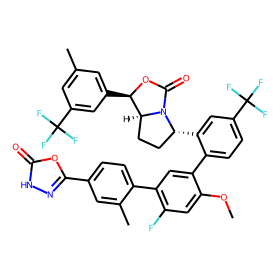

smiles:  CC(C)n1ncc2c1C(=O)CC1(CCN(C(=O)c3cc(-c4ccc(C(=O)O)cc4)nc(N(C)C)c3)CC1)C2
logD:  1.4
Jchem:  0.294518657
ADMET:  3.023
fpadmet:  0.863
prediction:  0.925


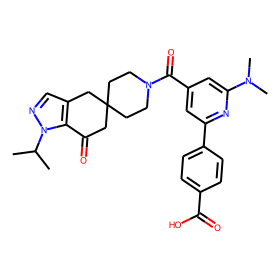

smiles:  CNC(=O)c1nc(C)n2ccc(Nc3nccc(-n4cc(OCCN)cn4)n3)cc12
logD:  0.6
Jchem:  -1.941837421
ADMET:  1.914
fpadmet:  2.205
prediction:  1.045


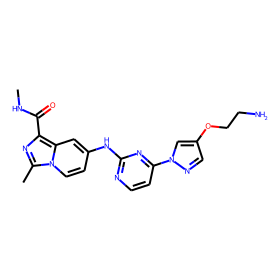

smiles:  CNC(=O)c1nn(C)c2ccc(Nc3nccc(-n4cc(N[C@@H]5CCOC[C@@H]5N)c(C)n4)n3)cc12
logD:  1.6
Jchem:  -1.259260544
ADMET:  2.849
fpadmet:  2.427
prediction:  1.73


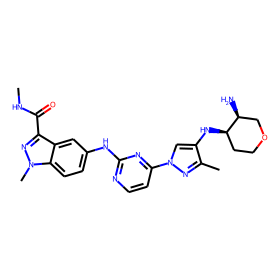

smiles:  CNC(=O)c1nn(C)c2ccc(Nc3nccc(-n4cc(NC5CNC5)c(C)n4)n3)cc12
logD:  0.7
Jchem:  -0.804044903
ADMET:  2.505
fpadmet:  2.185
prediction:  1.581


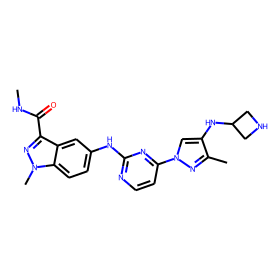

smiles:  CNC(=O)c1nn(C)c2ccc(Nc3nccc(-n4cc(N[C@@H]5CCNC5)c(C)n4)n3)cc12
logD:  0.3
Jchem:  -1.8458891
ADMET:  2.779
fpadmet:  2.251
prediction:  1.459


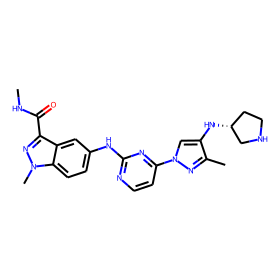

smiles:  CNC(=O)c1nn(C)c2ccc(Nc3nccc(-n4cc(N[C@@H]5CCCNC5)c(C)n4)n3)cc12
logD:  0.6
Jchem:  -0.607572671
ADMET:  2.937
fpadmet:  2.075
prediction:  1.545


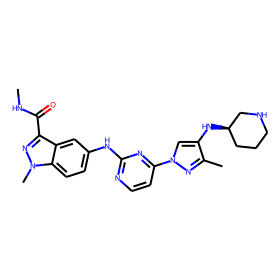

smiles:  CNC(=O)c1nn(C)c2ccc(Nc3nccc(-n4cc(O[C@@H]5CCNC5)c(C)n4)n3)cc12
logD:  1.4
Jchem:  -1.3661569
ADMET:  2.824
fpadmet:  2.328
prediction:  1.187


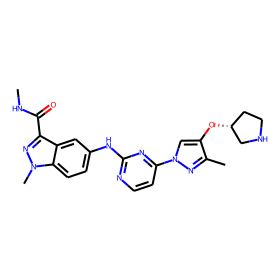

smiles:  CNC(=O)c1nn(C)c2ccc(Nc3nccc(-n4cc(O[C@@H]5CCCNC5)c(C)n4)n3)cc12
logD:  1.7
Jchem:  -0.134033231
ADMET:  2.971
fpadmet:  2.333
prediction:  1.323


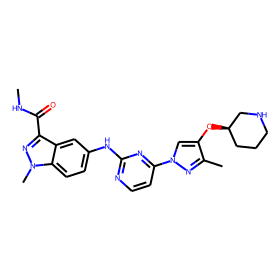

smiles:  CNC(=O)c1nn(C)c2ccc(Nc3nccc(-n4cc(N[C@H]5CNC[C@@H]5F)c(C)n4)n3)cc12
logD:  1.7
Jchem:  -0.167126903
ADMET:  2.935
fpadmet:  2.351
prediction:  2.045


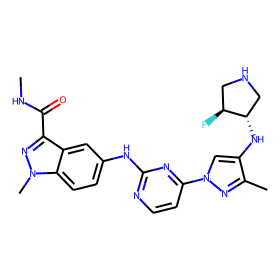

smiles:  O=C(NC1CCN(C2CCCCC2)CC1)c1nnc(-c2ccc(F)cc2F)o1
logD:  1.6
Jchem:  0.408392548
ADMET:  3.621
fpadmet:  2.759
prediction:  2.244


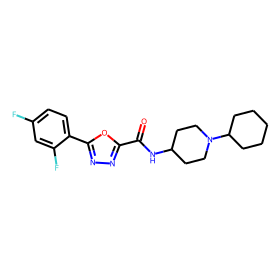

smiles:  O=C(N[C@H]1CCNCC1C(=O)NC1(c2ncccn2)CC1)c1cc(-c2ccc(F)cc2F)on1
logD:  0.6
Jchem:  -0.810759663
ADMET:  1.744
fpadmet:  2.266
prediction:  1.081


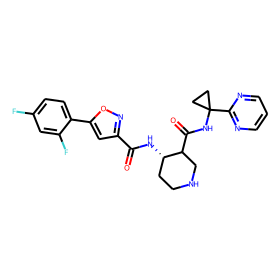

smiles:  O=C(O)Cc1ccccc1NC(=O)c1cccc(-c2ccc(Cl)c(OC3CCCNC3)c2)c1
logD:  3.6
Jchem:  2.422612637
ADMET:  2.452
fpadmet:  1.939
prediction:  0.961


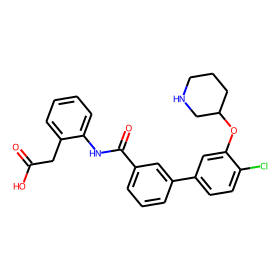

smiles:  CCCCCC[C@H]1OC[C@@H](C)NC(=O)C(COCCCN(C)C)NC(=O)C(CN)NC(=O)C(C2CCCCC2)NC(=O)C(CC(C)C)N(C)C(=O)C1C
logD:  2.1
Jchem:  -0.441939185
ADMET:  3.977
fpadmet:  1.134
prediction:  2.142


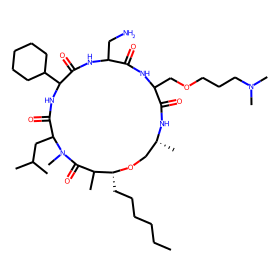

smiles:  CCCCCC[C@H]1OC[C@@H](C)NC(=O)C(COc2ccc(CN)cc2)NC(=O)C(CN)NC(=O)C(C2CCCCC2)NC(=O)C(CCC)N(C)C(=O)C1C
logD:  2.5
Jchem:  0.194282629
ADMET:  4.07
fpadmet:  1.488
prediction:  1.862


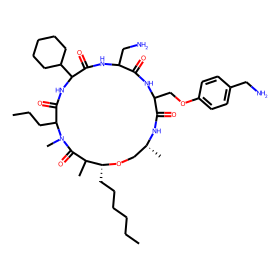

smiles:  CCCCCC[C@H]1OC[C@@H](C)NC(=O)C(COc2ccc(CCN)cc2)NC(=O)C(CN)NC(=O)C(C2CCCCC2)NC(=O)C(CCC)N(C)C(=O)C1C
logD:  2.4
Jchem:  0.018702947
ADMET:  4.232
fpadmet:  1.48
prediction:  1.76


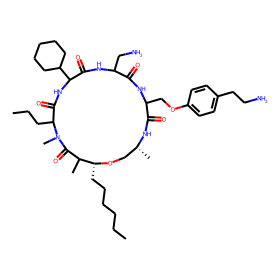

smiles:  CCCCCC[C@H]1OC[C@@H](C)NC(=O)C(COCCCCN)NC(=O)C(CN)NC(=O)C(C2CCCCCC2)NC(=O)C(CCC)N(C)C(=O)C1C
logD:  1.8
Jchem:  -1.13852233
ADMET:  3.707
fpadmet:  1.206
prediction:  1.096


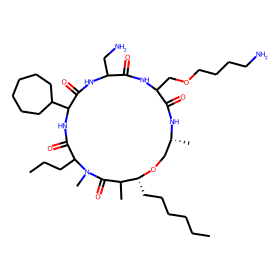

smiles:  CCCCCC[C@H]1OC[C@@H](C)NC(=O)C(CN(C)CCCN)NC(=O)C(CN)NC(=O)C(C2CCCCCC2)NC(=O)C(CCC)N(C)C(=O)C1C
logD:  1.8
Jchem:  -1.581277104
ADMET:  3.522
fpadmet:  1.159
prediction:  1.015


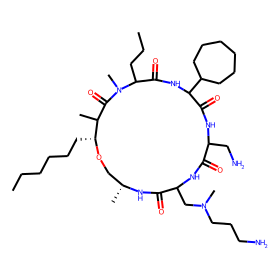

smiles:  COc1ccc(-c2c(C)nc3c(NCC4CCOCC4)nc(C)cn23)cc1OC
logD:  5.2
Jchem:  1.545442619
ADMET:  3.093
fpadmet:  2.704
prediction:  3.025


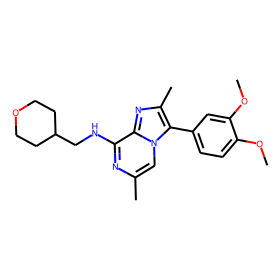

smiles:  COc1ccc(-c2c(C)nc3c(NCc4cccnc4)nc(C)cn23)cc1OC
logD:  4.5
Jchem:  1.62944419
ADMET:  2.991
fpadmet:  2.777
prediction:  2.845


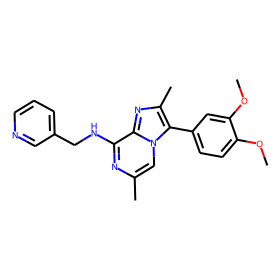

smiles:  COc1ccc(-c2c(C)nc3c(NCc4ccc(C(N)=O)cc4)nc(C)cn23)cc1OC
logD:  3.9
Jchem:  1.698771278
ADMET:  2.806
fpadmet:  2.676
prediction:  2.692


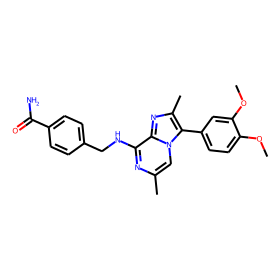

smiles:  COc1ccc(-c2c(C)nc3c(NCC4CCOCC4)cc(C)cn23)cc1OC
logD:  6.0
Jchem:  2.502792236
ADMET:  3.729
fpadmet:  2.864
prediction:  3.53


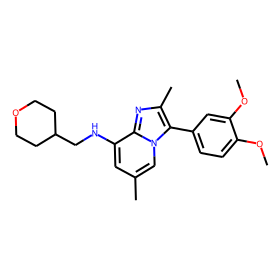

smiles:  COc1ccc(-c2c(C)nc3c(NCc4cccnc4)cc(C)cn23)cc1OC
logD:  4.9
Jchem:  2.587949256
ADMET:  3.55
fpadmet:  2.756
prediction:  3.455


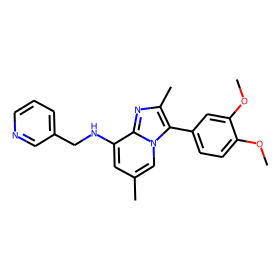

smiles:  COc1ccc(-c2c(C)nc3c(NCc4ccc(C(N)=O)cc4)cc(C)cn23)cc1OC
logD:  4.3
Jchem:  2.657262807
ADMET:  3.219
fpadmet:  2.672
prediction:  3.14


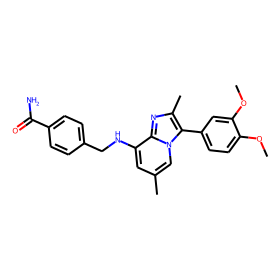

smiles:  c1ccc2c(c1)nc1cc3c(c[nH]c4ccccc43)cc12
logD:  -1.55
Jchem:  4.593732313
ADMET:  4.219
fpadmet:  2.793
prediction:  2.037


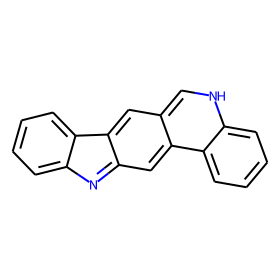

smiles:  Fc1ccc2c(c1)[nH]cc1cc3c(cc12)nc1ccccc13
logD:  1.61
Jchem:  4.735851082
ADMET:  4.203
fpadmet:  2.773
prediction:  2.237


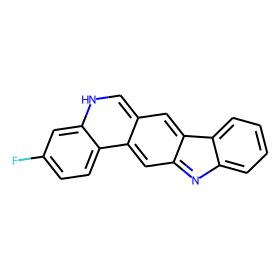

smiles:  CC(C)(C)OC(=O)N1CC[C@](C)(Nc2cc(-c3cnc(N)nc3)nc(N3CCOCC3)n2)C1
logD:  3.8
Jchem:  1.775646042
ADMET:  1.965
fpadmet:  2.583
prediction:  2.868


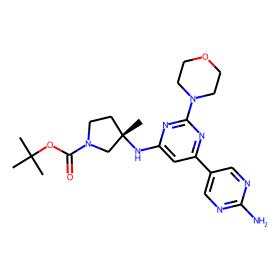

smiles:  CC(C)C(=O)N1CC[C@](CO)(Nc2cc(-c3cnc(N)nc3)nc(N3CCOCC3)n2)C1
logD:  1.4
Jchem:  0.299863415
ADMET:  -0.211
fpadmet:  2.053
prediction:  1.086


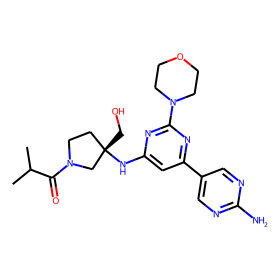

smiles:  COC(=O)N1CC[C@](CO)(Nc2cc(-c3cnc(N)nc3)nc(N3CCOCC3)n2)C1
logD:  1.5
Jchem:  -0.324367081
ADMET:  -0.449
fpadmet:  2.033
prediction:  0.924


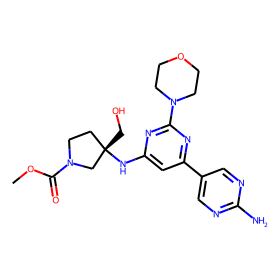

smiles:  CS(=O)(=O)N1CC[C@](CO)(Nc2cc(-c3cnc(N)nc3)nc(N3CCOCC3)n2)C1
logD:  0.79
Jchem:  -1.4486086
ADMET:  -1.113
fpadmet:  1.757
prediction:  0.813


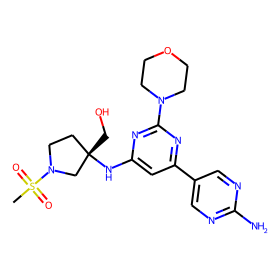

smiles:  CCOc1nc(Nc2ccc(C(=O)N3CC4(COC4)C3)cc2OC)nc2[nH]ccc12
logD:  4.3
Jchem:  2.028756183
ADMET:  2.809
fpadmet:  2.547
prediction:  2.844


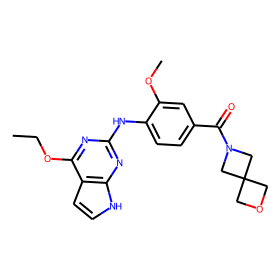

smiles:  CCOc1nc(Nc2ccc(C(=O)N3C[C@H](C)O[C@H](C)C3)cc2OC)nc2[nH]ccc12
logD:  5.7
Jchem:  3.183134637
ADMET:  3.061
fpadmet:  2.688
prediction:  2.901


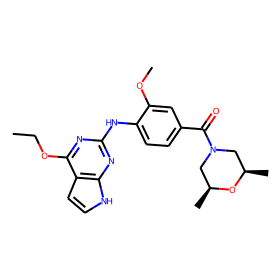

smiles:  CCOc1nc(Nc2ccc(C(=O)N3CCOC[C@H]3C)cc2OC)nc2[nH]ccc12
logD:  5.1
Jchem:  2.766559659
ADMET:  2.819
fpadmet:  2.698
prediction:  2.962


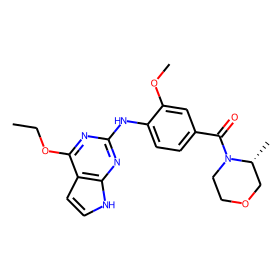

smiles:  CCOc1nc(Nc2ccc(C(=O)N3CCOC[C@@H]3C)cc2OC)nc2[nH]ccc12
logD:  5.0
Jchem:  2.766559659
ADMET:  2.8
fpadmet:  2.698
prediction:  2.952


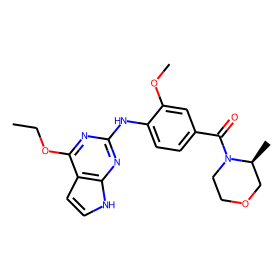

smiles:  CCOc1nc(Nc2ccc(C(=O)NCC(C)(C)O)cc2OC)nc2[nH]ccc12
logD:  4.1
Jchem:  2.351858197
ADMET:  2.601
fpadmet:  2.47
prediction:  2.275


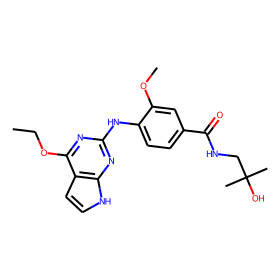

smiles:  Cc1cc2c(C3CCCCC3)cnc(N=C3CCNCC3C(=O)NC3CCCCC3)c2[nH]c1=O
logD:  4.78
Jchem:  2.928475333
ADMET:  3.757
fpadmet:  2.315
prediction:  3.029


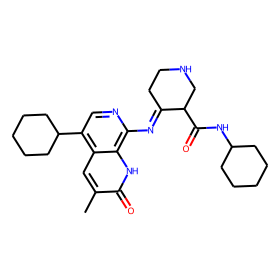

smiles:  CCP(=O)(OC)c1ccc2oc(-c3ccc4c(c3)OC(F)(F)O4)nc2c1
logD:  2.4
Jchem:  4.615799998
ADMET:  3.559
fpadmet:  2.944
prediction:  3.978


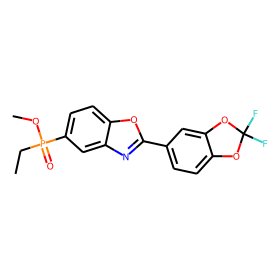

smiles:  O=C(Nc1ccc(Br)cc1)NC(C(=O)Nc1cccnc1)C1CCOCC1
logD:  4.7
Jchem:  2.197816464
ADMET:  2.885
fpadmet:  2.134
prediction:  3.134


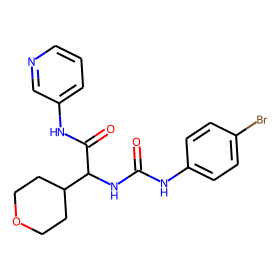

smiles:  O=C(Nc1ccc(Br)cc1)NC(C(=O)NC1CNC1)C1CCCC1
logD:  1.6
Jchem:  0.452249575
ADMET:  2.846
fpadmet:  0.672
prediction:  2.254


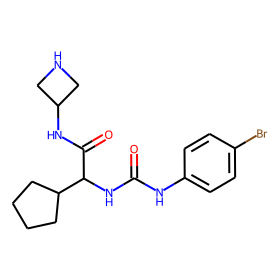

smiles:  O=C(Nc1ccc(Br)cc1)NC(C(=O)NC1COC1)C1CCCC1
logD:  4.3
Jchem:  2.487491296
ADMET:  2.964
fpadmet:  0.889
prediction:  3.65


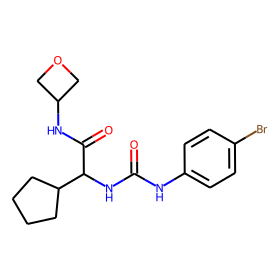

smiles:  O=C(Nc1ccc(Br)cc1)NC(C(=O)NCC1CCCO1)C1CCCC1
logD:  4.7
Jchem:  3.064815637
ADMET:  3.418
fpadmet:  1.176
prediction:  4.124


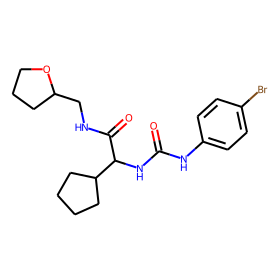

smiles:  CN1CCN(c2nc3ncc(Cl)cc3n3cnnc23)CC1
logD:  0.95
Jchem:  -0.065908144
ADMET:  2.09
fpadmet:  2.621
prediction:  1.901


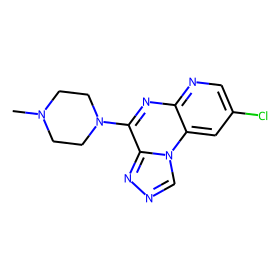

smiles:  Oc1cc(O)c2c(c1)O[C@H](c1ccc(O)c(O)c1)[C@@H](O)C2
logD:  0.01
Jchem:  1.784451022
ADMET:  1.62
fpadmet:  2.813
prediction:  1.101


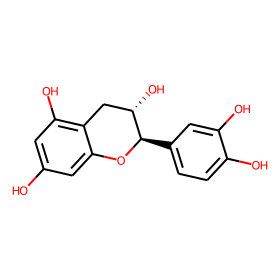

smiles:  C[C@H]1COc2c(N3CC[C@@H](C4(N)CC4)C3)c(F)c(N)c3cc(C(=O)O)c(=O)n1c23
logD:  -0.97
Jchem:  -2.048135329
ADMET:  0.469
fpadmet:  0.512
prediction:  0.132


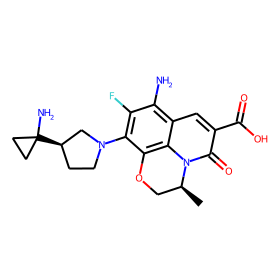

smiles:  CCC[C@@H](NC(=O)c1cccc2[nH]c(O)cc12)[C@@H](O)c1ccncc1C
logD:  1.6
Jchem:  2.657158887
ADMET:  2.736
fpadmet:  2.178
prediction:  1.813


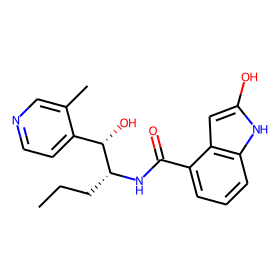

smiles:  CCCCCCCCCC(=O)NC1C(=O)N=C(CC)C(=O)NC(CCN)C(=O)NC(CC(C)C)C(=O)NC(CCCNC(=N)N)C(=O)NC(C(O)CN)C(=O)NC(C(O)CN)C(=O)NCC1O
logD:  3.756
Jchem:  -12.33762487
ADMET:  -1.153
fpadmet:  0.069
prediction:  -0.229


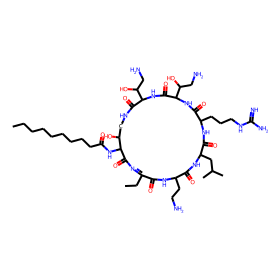

smiles:  CCC1=NC(=O)C(NC(=O)c2cc3cc(Cl)ccc3o2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)C(CCCNC(=N)N)NC(=O)C(CC(C)C)NC(=O)C(CCN)NC1=O
logD:  2.829
Jchem:  -13.61125364
ADMET:  -1.795
fpadmet:  1.913
prediction:  -0.616


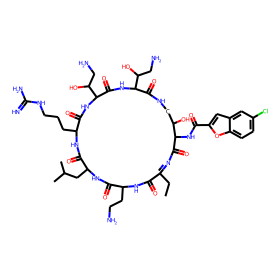

smiles:  CCC1=NC(=O)C(NC(=O)COc2ccc(/C=C/C(=O)OC(C)(C)C)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)C(CCCNC(=N)N)NC(=O)C(CC(C)C)NC(=O)C(CCN)NC1=O
logD:  2.65
Jchem:  -13.03450012
ADMET:  -1.392
fpadmet:  0.495
prediction:  -0.748


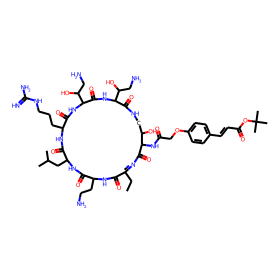

smiles:  COc1ncc(C2=CCOCC2)cc1S(=O)(=O)Nc1cncc(-c2ccc(CN3CCN(C(C)C)CC3)cc2)c1
logD:  2.9
Jchem:  1.787572912
ADMET:  1.869
fpadmet:  2.263
prediction:  1.716


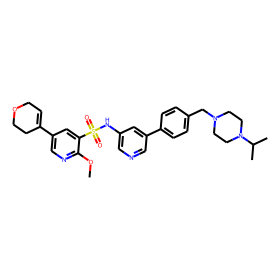

smiles:  COc1ncc(C2=CCOCC2)cc1S(=O)(=O)Nc1cncc(-c2ccc(CN3C[C@H](C)O[C@H](C)C3)cc2)c1
logD:  5.3
Jchem:  2.155008799
ADMET:  2.124
fpadmet:  2.296
prediction:  1.986


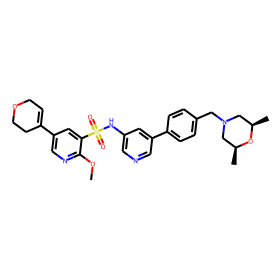

smiles:  COc1ncc(N2CCOCC2)cc1S(=O)(=O)Nc1ccnc(-c2ccc(CN3C[C@H](C)O[C@H](C)C3)cc2F)c1
logD:  3.9
Jchem:  2.23701319
ADMET:  2.582
fpadmet:  2.413
prediction:  1.845


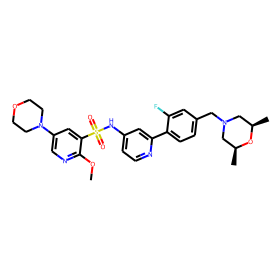

smiles:  Cc1nc2c(-c3ccc(F)cc3)cnn2c(NCc2ccccn2)c1S(C)(=O)=O
logD:  3.7
Jchem:  1.564884367
ADMET:  2.009
fpadmet:  2.431
prediction:  2.245


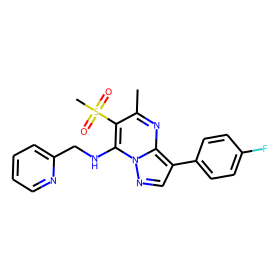

smiles:  Cc1nc2c(-c3ccc(S(C)(=O)=O)cc3)cnn2c(NCc2ccccn2)c1C
logD:  3.3
Jchem:  1.93551572
ADMET:  2.127
fpadmet:  2.259
prediction:  2.193


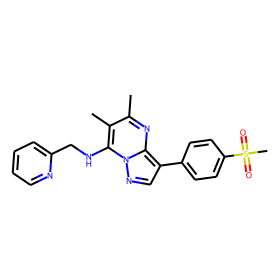

smiles:  O=C(CN1Cc2ccc(-c3nc(NC4CCOCC4)ncc3Cl)cc2C1=O)N[C@@]1(CO)CCc2ccccc21
logD:  3.6
Jchem:  2.245880605
ADMET:  2.219
fpadmet:  2.492
prediction:  3.477


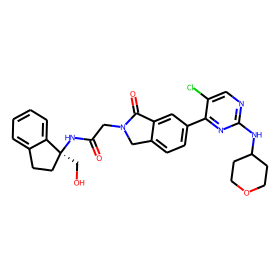

smiles:  O=C(CN1Cc2ccc(-c3nc(NC4CCOCC4)ncc3Cl)cc2C1=O)N1CCc2ccccc2CC1
logD:  4.7
Jchem:  3.020225227
ADMET:  2.937
fpadmet:  2.471
prediction:  3.494


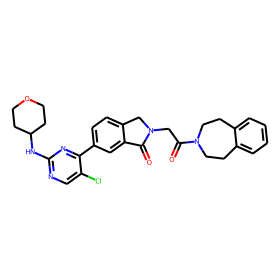

smiles:  COc1cc(F)cc([C@@H](CO)NC(=O)C(C)N2Cc3ccc(-c4nc(NC5CCOCC5)ncc4Cl)cc3C2=O)c1
logD:  3.8
Jchem:  2.391447831
ADMET:  2.437
fpadmet:  2.63
prediction:  3.169


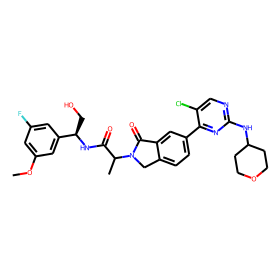

smiles:  CC(C(=O)N[C@H](CO)c1cc(F)cc(N2CCN(C)CC2)c1)N1Cc2ccc(-c3nc(NC4CCOCC4)ncc3Cl)cc2C1=O
logD:  3.6
Jchem:  2.032993254
ADMET:  2.4
fpadmet:  2.664
prediction:  2.779


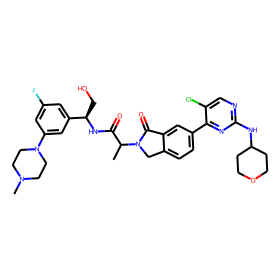

smiles:  CC(C(=O)N[C@H](CO)c1cccc(N2CCN(C)CC2)n1)N1Cc2ccc(-c3nc(NC4CCOCC4)ncc3Cl)cc2C1=O
logD:  3.3
Jchem:  1.599913701
ADMET:  2.065
fpadmet:  2.482
prediction:  2.178


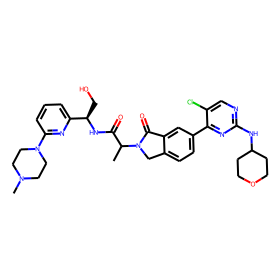

smiles:  COc1cc(F)cc([C@@H](CO)NC(=O)C(C)N2Cc3ccc(-c4ccnc(NC5CCOCC5)n4)cc3C2=O)c1
logD:  3.2
Jchem:  1.787309393
ADMET:  2.084
fpadmet:  2.52
prediction:  2.719


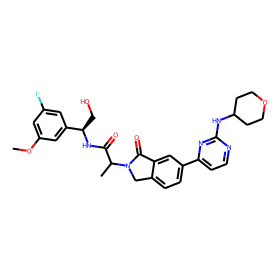

smiles:  CC[C@@H](NC(=O)C1C[C@H](NC(=O)COCCOCCOCCOCCOc2cc3nccc(Nc4ccc5scnc5c4)c3cc2S(=O)(=O)C(C)(C)C)CN1C(=O)C(NC(=O)C(C)NC)C(C)(C)C)c1ccccc1
logD:  5.6
Jchem:  2.957932904
ADMET:  3.346
fpadmet:  2.389
prediction:  2.7


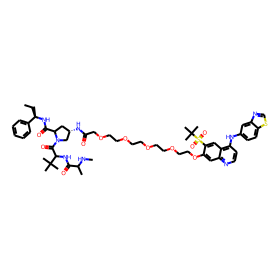

smiles:  CNC(C)C(=O)NC(C(=O)N1CCCC1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2ccc(N3CCN(CCOc4cc5ncnc(Nc6[nH]nc(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.55
Jchem:  3.853883273
ADMET:  3.222
fpadmet:  2.539
prediction:  2.758


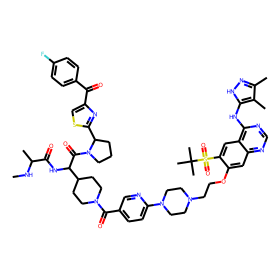

smiles:  [2H]C([2H])([2H])Oc1cc2c(cc1NC(=O)c1ccc(C(C)(C)C)cc1)CCCCC2
logD:  3.0
Jchem:  6.349338497
ADMET:  4.148
fpadmet:  2.325
prediction:  5.089


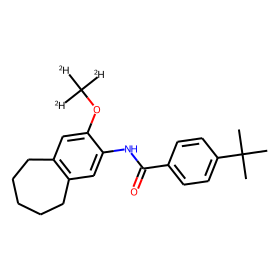

smiles:  CCNC(=O)c1cc2c(-c3cc(C(C)(C)O)ccc3Oc3c(C)cc(F)cc3C)cn(C)c(=O)c2[nH]1
logD:  5.1
Jchem:  3.931433092
ADMET:  3.348
fpadmet:  2.648
prediction:  3.47


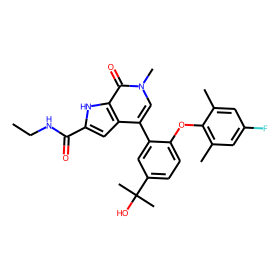

smiles:  CCC(=O)c1c[nH]c(C(=O)NC)c1
logD:  3.1
Jchem:  0.305627345
ADMET:  1.115
fpadmet:  0.781
prediction:  0.974


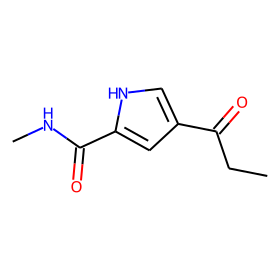

smiles:  CNC(=O)c1cc(C(=O)NC)n([C@@H](C)c2ccccc2)n1
logD:  3.0
Jchem:  0.996637683
ADMET:  1.742
fpadmet:  1.668
prediction:  2.298


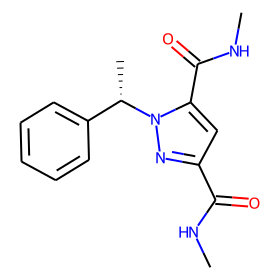

smiles:  CCNC(=O)c1cc(C(=O)NC)nn1[C@@H](C)c1ccccc1
logD:  3.7
Jchem:  1.353445688
ADMET:  1.932
fpadmet:  1.915
prediction:  2.273


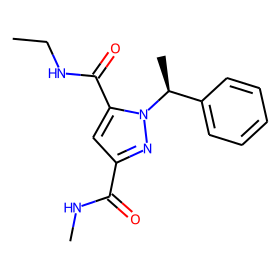

smiles:  CCCNC(=O)c1cc(C(=O)NC)nn1[C@@H](C)c1ccccc1
logD:  4.4
Jchem:  1.875968082
ADMET:  2.6
fpadmet:  1.915
prediction:  2.786


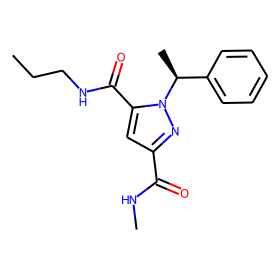

smiles:  CCCNC(=O)c1cc(C(=O)NC)oc1C(C)c1ccccc1
logD:  4.2
Jchem:  2.282315693
ADMET:  2.985
fpadmet:  1.857
prediction:  3.181


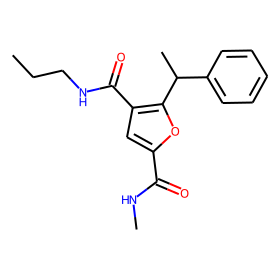

smiles:  CNC(=O)c1cc(C(=O)NCCO)n([C@@H](C)c2ccccc2)n1
logD:  2.4
Jchem:  0.306535704
ADMET:  1.071
fpadmet:  1.555
prediction:  1.446


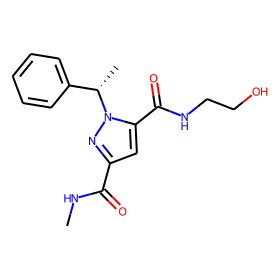

smiles:  CNC(=O)c1cc(C(=O)NC(C)CO)n([C@@H](C)c2ccccc2)n1
logD:  2.8
Jchem:  0.723110766
ADMET:  1.489
fpadmet:  1.483
prediction:  1.852


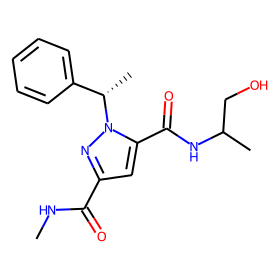

smiles:  CNC(=O)c1cc(C(=O)N[C@@H]2[C@H]3COC[C@H]32)c(C(C)c2ccccc2)o1
logD:  4.1
Jchem:  0.969955356
ADMET:  2.525
fpadmet:  1.822
prediction:  2.185


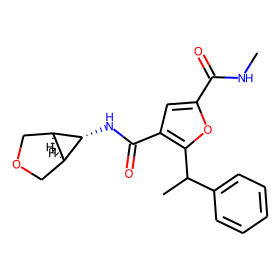

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2CC[C@H](O)CC2)n([C@@H](C)c2cccc(C(F)(F)F)c2)n1
logD:  4.1
Jchem:  2.287038251
ADMET:  2.788
fpadmet:  2.198
prediction:  3.063


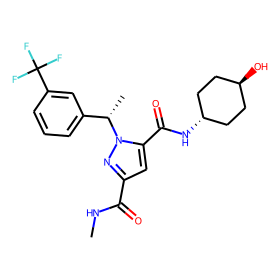

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2CC[C@H](O)CC2)n([C@@H](C)c2ccc(C(F)(F)F)cc2)n1
logD:  3.9
Jchem:  2.287038251
ADMET:  2.835
fpadmet:  2.227
prediction:  3.05


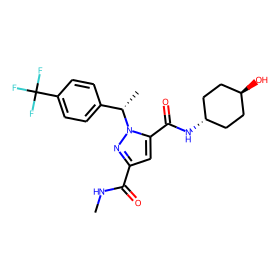

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2CC[C@H](O)CC2)n([C@@H](C)c2ccccc2Cl)n1
logD:  3.9
Jchem:  2.013234444
ADMET:  2.302
fpadmet:  2.308
prediction:  2.813


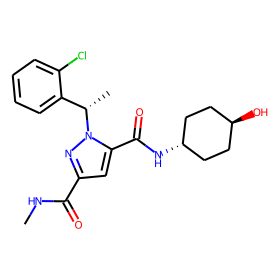

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2CC[C@H](O)CC2)n([C@@H](C)c2cccc(Cl)c2)n1
logD:  3.7
Jchem:  2.013234445
ADMET:  2.481
fpadmet:  2.381
prediction:  2.59


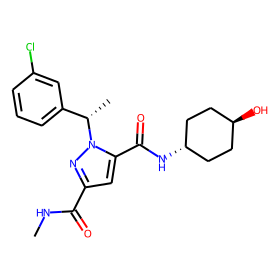

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2CC[C@H](O)CC2)n([C@@H](C)c2ccc(Cl)cc2)n1
logD:  3.7
Jchem:  2.013234445
ADMET:  2.534
fpadmet:  2.256
prediction:  2.563


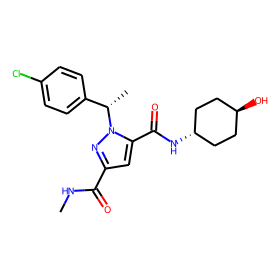

smiles:  CC[C@@H](c1ccccc1)n1nc(C(=O)NC)cc1C(=O)N[C@@H]1[C@H]2C[C@@H](O)C[C@H]21
logD:  3.6
Jchem:  1.308794579
ADMET:  2.421
fpadmet:  1.614
prediction:  2.218


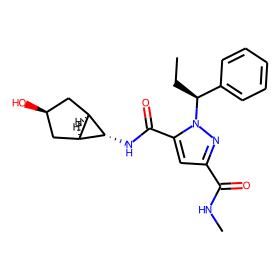

smiles:  CNC(=O)c1cc(C(=O)N[C@@H]2[C@H]3C[C@@H](O)C[C@H]32)n([C@@H](C)c2cccc(Cl)c2)n1
logD:  3.7
Jchem:  1.390316862
ADMET:  2.514
fpadmet:  2.096
prediction:  2.106


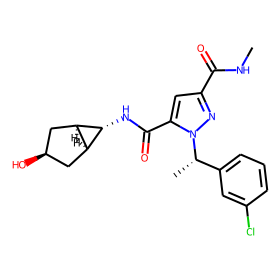

smiles:  CNC(=O)c1cc(C(=O)NC)c2c(c1)[C@H](c1ccccc1)[C@@H](CF)O2
logD:  3.3
Jchem:  1.763628998
ADMET:  2.082
fpadmet:  2.228
prediction:  2.776


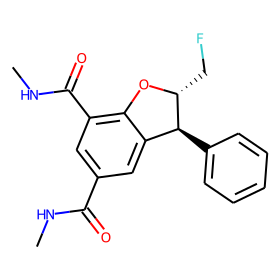

smiles:  CNC(=O)c1cc(C(=O)NC)c2c(c1)[C@H](c1ccccc1)CO2
logD:  3.2
Jchem:  1.502872185
ADMET:  1.811
fpadmet:  2.305
prediction:  2.676


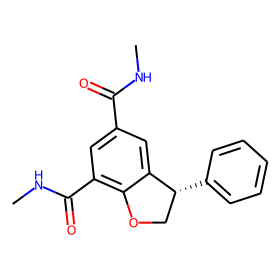

smiles:  CNC(=O)c1cc(C(=O)N[C@@H]2C[C@H]2C)cc2c1O[C@H](CF)[C@H]2c1ccccc1
logD:  4.5
Jchem:  2.594166374
ADMET:  3.202
fpadmet:  2.242
prediction:  3.141


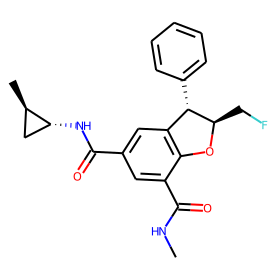

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2C[C@@H]2C)cc2c1OC[C@H]2c1ccccc1
logD:  4.5
Jchem:  2.333409561
ADMET:  2.88
fpadmet:  2.225
prediction:  3.072


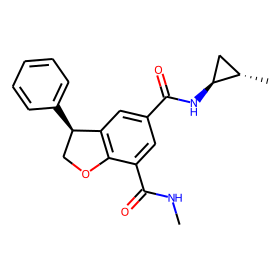

smiles:  CNC(=O)c1cc(C(=O)N[C@@H]2[C@H]3COC[C@H]32)cc2c1OC[C@H]2c1ccccc1
logD:  3.3
Jchem:  1.069842179
ADMET:  2.192
fpadmet:  2.156
prediction:  2.541


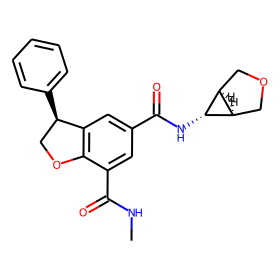

smiles:  CCC(=O)N1C[C@H]2[C@H](NC(=O)c3cc(C(=O)NC)c4c(c3)[C@H](c3ccccc3)CO4)[C@H]2C1
logD:  3.4
Jchem:  1.062892393
ADMET:  2.138
fpadmet:  2.159
prediction:  2.468


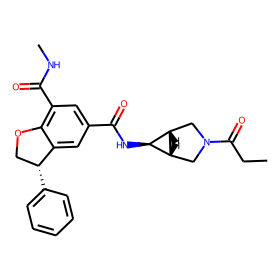

smiles:  CNC(=O)c1cc(C(=O)Nc2cnn(C)c2)cc2c1OC[C@H]2c1ccccc1
logD:  3.5
Jchem:  1.94830026
ADMET:  2.205
fpadmet:  2.526
prediction:  2.968


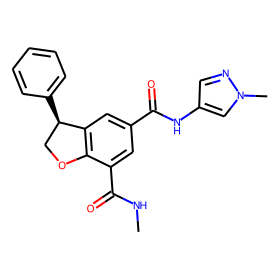

smiles:  CNC(=O)c1cc(C(=O)NCCc2cnn(C)c2)cc2c1OC[C@H]2c1ccccc1
logD:  3.2
Jchem:  1.943864626
ADMET:  2.066
fpadmet:  2.519
prediction:  2.831


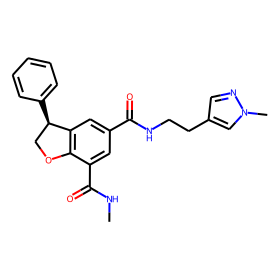

smiles:  CNC(=O)c1cc(C(=O)N[C@@H]2[C@H]3COC[C@H]32)cc2c1OC[C@H]2c1ccccc1C
logD:  4.0
Jchem:  1.583263568
ADMET:  2.468
fpadmet:  2.179
prediction:  2.643


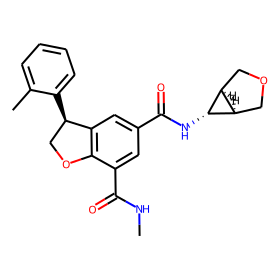

smiles:  CNC(=O)c1cc(C(=O)NCCc2cnn(C)c2)cc2c1OC[C@H]2c1cccc2[nH]ccc12
logD:  3.2
Jchem:  2.042626616
ADMET:  2.164
fpadmet:  2.238
prediction:  2.483


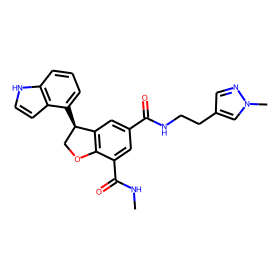

smiles:  CNC(=O)c1cc(C(=O)N[C@@H]2[C@H]3COC[C@H]32)cc2c1OC[C@@]2(C)c1ccccc1
logD:  3.7
Jchem:  1.447843014
ADMET:  2.483
fpadmet:  2.165
prediction:  2.773


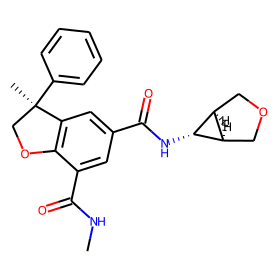

smiles:  CC[C@@]1(c2ccccc2)COc2c(C(=O)NC)cc(C(=O)N[C@@H]3[C@H]4COC[C@H]43)cc21
logD:  4.2
Jchem:  1.892411675
ADMET:  2.555
fpadmet:  2.165
prediction:  3.132


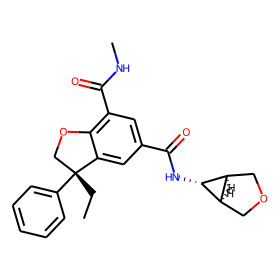

smiles:  CNC(=O)c1cc(C(=O)NC)c2c(c1)[C@](C)(c1ccccc1)CO2
logD:  3.4
Jchem:  1.880873019
ADMET:  2.225
fpadmet:  2.334
prediction:  2.952


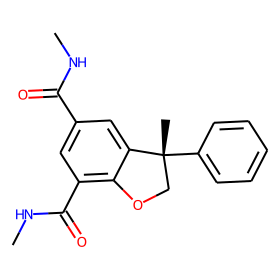

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2C[C@@H]2C)cc2c1OC[C@@]2(C)c1ccccc1
logD:  4.7
Jchem:  2.711410395
ADMET:  3.107
fpadmet:  2.265
prediction:  3.351


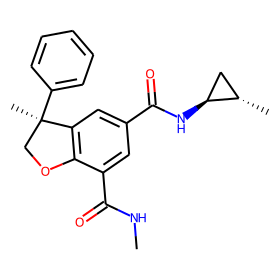

smiles:  CNC(=O)c1cc(C(=O)N[C@@H]2[C@H]3C[C@@H](O)C[C@H]32)cc2c1OC[C@@]2(C)c1ccccc1
logD:  3.7
Jchem:  1.67050745
ADMET:  2.524
fpadmet:  1.838
prediction:  2.556


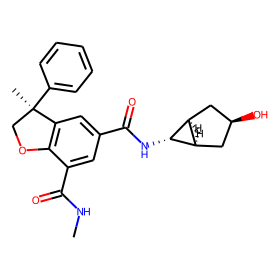

smiles:  COc1ccc(-n2cc(-c3[nH]nc4cc(Cl)c(N[C@@H]5CCN(C6COC6)C5)cc34)cn2)cc1
logD:  4.75
Jchem:  3.007291998
ADMET:  3.702
fpadmet:  2.353
prediction:  3.937


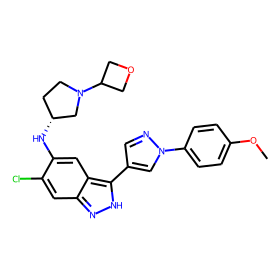

smiles:  C[C@H](Oc1ccc2ncc(/C=C/C(=O)O)c(-n3ccnc3)c2c1)c1c(Cl)ccc(F)c1Cl
logD:  2.0
Jchem:  3.364959576
ADMET:  3.527
fpadmet:  1.319
prediction:  2.083


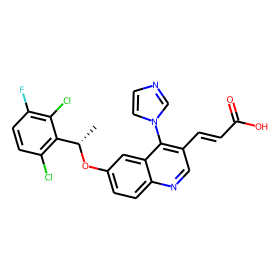

smiles:  C[C@H](Oc1ccc2ncc(=CCC(=O)NC(CC(=O)O)CC(=O)O)c(=C3CC3)c2c1)c1c(Cl)ccc(F)c1Cl
logD:  0.4
Jchem:  -1.341577795
ADMET:  3.081
fpadmet:  1.271
prediction:  1.547


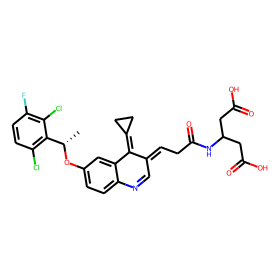

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cc(C(F)(F)F)cc(C(F)(F)F)c2)cc1
logD:  0.4
Jchem:  3.068606844
ADMET:  3.923
fpadmet:  2.188
prediction:  3.11


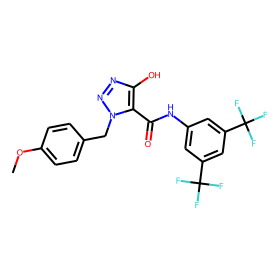

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2ccc(-c3ccccc3)cc2)cc1
logD:  0.47
Jchem:  2.960129279
ADMET:  3.814
fpadmet:  2.299
prediction:  3.574


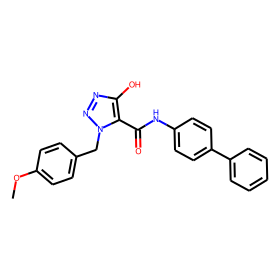

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(-c3ccccc3)c2)cc1
logD:  0.069
Jchem:  2.960131849
ADMET:  3.852
fpadmet:  2.306
prediction:  3.627


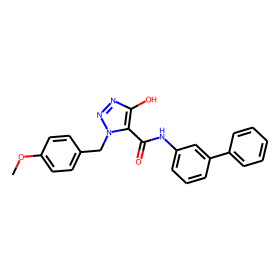

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(-c3ccc(O)cc3)c2)cc1
logD:  0.31
Jchem:  2.65510252
ADMET:  3.426
fpadmet:  2.176
prediction:  3.734


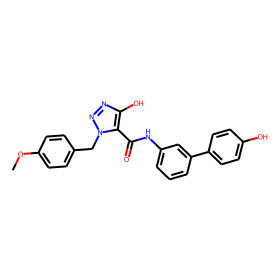

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(-c3cccc(O)c3)c2)cc1
logD:  0.21
Jchem:  2.654941375
ADMET:  3.495
fpadmet:  2.162
prediction:  3.67


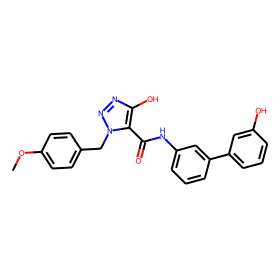

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(-c3ccc(OC)cc3)c2)cc1
logD:  0.22
Jchem:  2.802460576
ADMET:  3.678
fpadmet:  2.202
prediction:  3.851


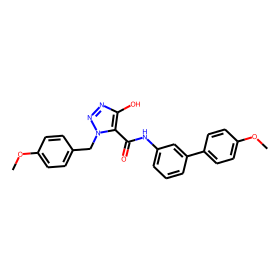

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(-c3cccc(OC)c3)c2)cc1
logD:  0.26
Jchem:  2.802460581
ADMET:  3.76
fpadmet:  2.186
prediction:  3.38


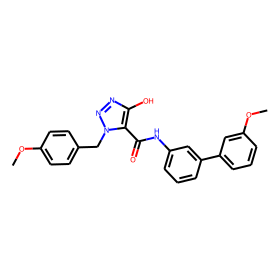

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2ccc(Oc3ccccc3)cc2)cc1
logD:  0.27
Jchem:  2.813185376
ADMET:  3.671
fpadmet:  2.19
prediction:  2.954


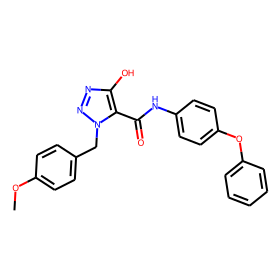

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(Oc3ccccc3)c2)cc1
logD:  0.11
Jchem:  2.813202494
ADMET:  3.676
fpadmet:  2.219
prediction:  2.874


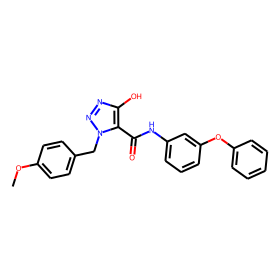

smiles:  N#Cc1ccc(OCC(O)CCNS(=O)(=O)c2ccc(Cl)cc2Cl)cc1F
logD:  5.2
Jchem:  3.057278334
ADMET:  3.165
fpadmet:  1.84
prediction:  3.734


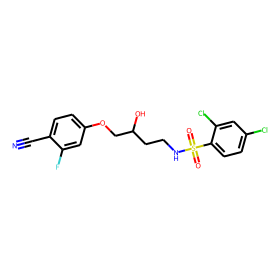

smiles:  N#Cc1ccc(OCC(N)CCNS(=O)(=O)c2ccc(Cl)cc2Cl)cc1F
logD:  4.6
Jchem:  1.409750326
ADMET:  2.902
fpadmet:  2.02
prediction:  2.899


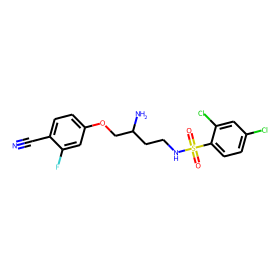

smiles:  N#Cc1ccc(OC[C@@H](N)CCNS(=O)(=O)c2ccc(Cl)cc2Cl)cc1F
logD:  4.5
Jchem:  1.409750326
ADMET:  3.001
fpadmet:  2.02
prediction:  2.944


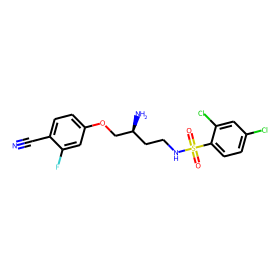

smiles:  CC(C)(NC(=O)Nc1ccc(F)c(C(F)(F)F)c1)C(=O)O
logD:  1.1
Jchem:  -0.824912458
ADMET:  2.106
fpadmet:  -0.86
prediction:  0.469


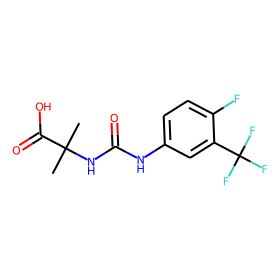

smiles:  CC1(C)C(=O)N(c2ccc(F)c(C(F)(F)F)c2)C(=O)N1S(C)(=O)=O
logD:  3.8
Jchem:  1.937141711
ADMET:  1.101
fpadmet:  1.634
prediction:  2.144


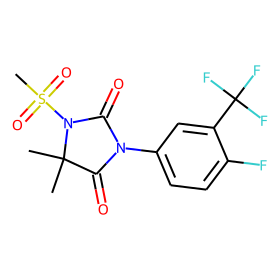

smiles:  N=C(N)NC(=O)c1nc(-c2ccc(C(F)(F)F)cc2)c(N)nc1N
logD:  2.8
Jchem:  1.502281452
ADMET:  0.699
fpadmet:  1.498
prediction:  2.539


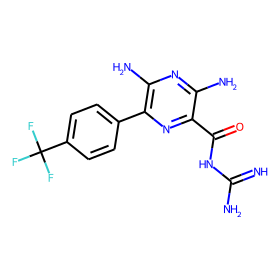

smiles:  CNC(=O)c1cccc(Cc2ccccc2)n1
logD:  4.3
Jchem:  2.181449894
ADMET:  2.667
fpadmet:  1.758
prediction:  2.635


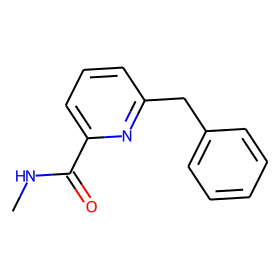

smiles:  CNC(=O)c1cc(C(N)=O)cc(Cc2ccccc2)n1
logD:  2.7
Jchem:  1.032090781
ADMET:  1.495
fpadmet:  1.723
prediction:  1.653


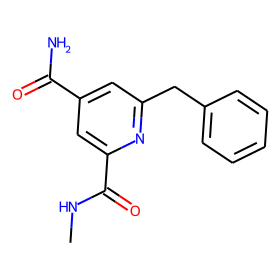

smiles:  CNC(=O)c1cc(Cc2ccccc2)nc(C(=O)NC)c1
logD:  3.1
Jchem:  1.255766095
ADMET:  1.928
fpadmet:  1.89
prediction:  2.06


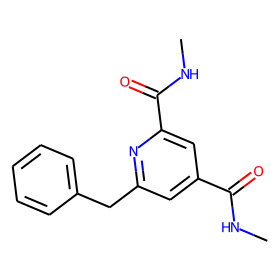

smiles:  CNC(=O)c1cc(C(=O)N(C)C)cc(Cc2ccccc2)n1
logD:  3.3
Jchem:  1.479442388
ADMET:  1.66
fpadmet:  1.853
prediction:  1.891


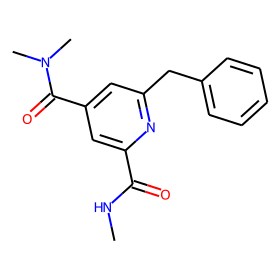

smiles:  CCNC(=O)c1cc(Cc2ccccc2)nc(C(=O)NC)c1
logD:  3.7
Jchem:  1.612574099
ADMET:  2.246
fpadmet:  1.909
prediction:  2.266


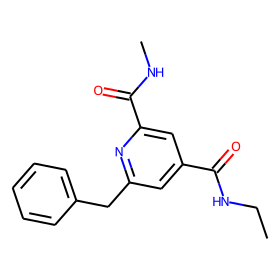

smiles:  CNC(=O)c1cc(C(=O)NC(C)C)cc(Cc2ccccc2)n1
logD:  4.3
Jchem:  2.029149163
ADMET:  2.672
fpadmet:  1.839
prediction:  2.584


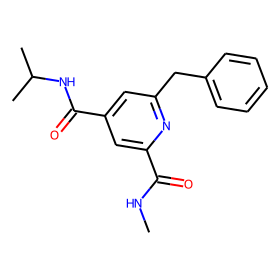

smiles:  CNC(=O)c1cc(C(=O)NC2CC2)cc(Cc2ccccc2)n1
logD:  3.9
Jchem:  1.721330718
ADMET:  2.502
fpadmet:  1.92
prediction:  2.59


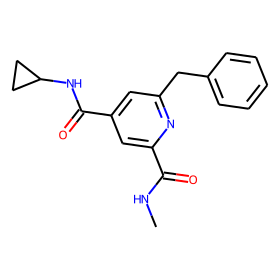

smiles:  CNC(=O)c1cc(C(=O)NC2COC2)cc(Cc2ccccc2)n1
logD:  3.1
Jchem:  1.097032778
ADMET:  1.527
fpadmet:  1.892
prediction:  1.905


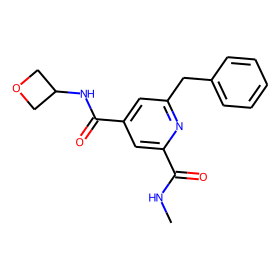

smiles:  CNC(=O)c1cc(C(=O)N[C@@H]2[C@H]3COC[C@H]32)cc(Cc2ccccc2)n1
logD:  3.5
Jchem:  0.822736159
ADMET:  2.275
fpadmet:  1.929
prediction:  1.94


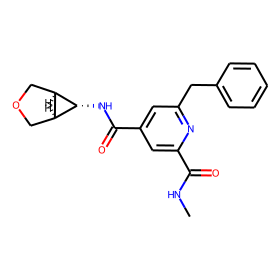

smiles:  COc1cc(F)c(-c2ccc(C(=O)O)cc2C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  5.5
Jchem:  6.826318628
ADMET:  4.265
fpadmet:  2.066
prediction:  4.706


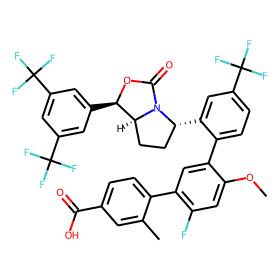

smiles:  COc1ccc([C@H]2C[C@H](O)[C@H](O)C2)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  5.7
Jchem:  7.230772752
ADMET:  4.475
fpadmet:  2.78
prediction:  5.818


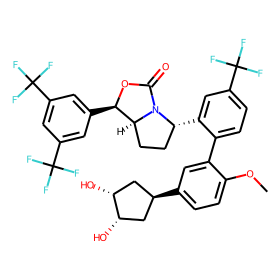

smiles:  CCCCC(=O)N(Cc1ccc(-c2ccccc2-c2nn[nH]n2)cc1)C(C(=O)O)C(C)C
logD:  -0.8
Jchem:  2.291843252
ADMET:  2.041
fpadmet:  0.594
prediction:  0.563


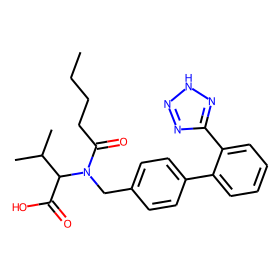

smiles:  CCCCC(NC(=O)C1CCCN1C(=O)CNC(=O)C(CCCCN)NC(=O)C(Cc1c[nH]cn1)NC(=O)C(CO)NC(=O)C(CC(C)C)N(C)C(=O)C(CCCN=C(N)N)NC(=O)C1CCCN1C(=O)C(CCCNC(=N)N)NC(=O)C(CCC(N)=O)NC(=O)C(CCCNC(=N)N)NC(=O)C(CCCNC(=N)N)NC(=O)C(Cc1ccccc1)NC(=O)C(CCCCN)NC(=O)CCOCCOCCOCCOCCOCCOCCOCCN)C(=O)NC(C)(C)C(=O)NC(Cc1ccc(Br)cc1)C(=O)O
logD:  -1.82
Jchem:  -25.63245638
ADMET:  -3.586
fpadmet:  0.141
prediction:  -1.529


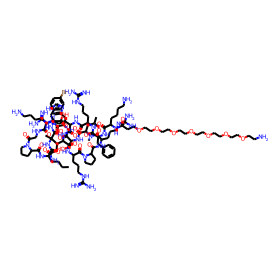

smiles:  CCCCC(NC(=O)C1CCCN1C(=O)CNC(=O)C(CCCCN)NC(=O)C(Cc1c[nH]cn1)NC(=O)C(CO)NC(=O)C(CC(C)C)N(C)C(=O)C(CCCN=C(N)N)NC(=O)C1CCCN1C(=O)C(CCCNC(=N)N)NC(=O)C(CCC(N)=O)NC(=O)C(CCCNC(=N)N)NC(=O)C(CCCNC(=N)N)NC(=O)C(Cc1ccccc1)NC(=O)C(N)CCCCN)C(=O)NC(C)(C)C(=O)NC(Cc1ccc(Br)cc1)C(=O)O
logD:  -2.01
Jchem:  -23.23761151
ADMET:  -3.15
fpadmet:  -0.372
prediction:  -1.49


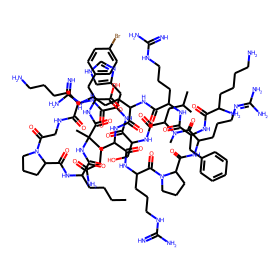

smiles:  CSCCC(NC(=O)C1CCCN1C(=O)CNC(=O)C(CCCCN)NC(=O)C(Cc1c[nH]cn1)NC(=O)C(CO)NC(=O)C(CC(C)C)NC(=O)C(CCCN=C(N)N)NC(=O)C1CCCN1C(=O)C(CCCNC(=N)N)NC(=O)C(CCC(N)=O)NC(=O)C(CCCNC(=N)N)NC(=O)C(CCCNC(=N)N)NC(=O)C(Cc1ccccc1)NC(=O)C(N)CCCCN)C(=O)N1CCCC1C(=O)NC(Cc1ccccc1)C(=O)O
logD:  -2.57
Jchem:  -25.15100046
ADMET:  -5.0
fpadmet:  -0.202
prediction:  -1.402


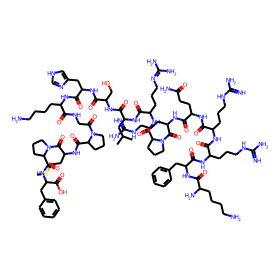

smiles:  CC(C)c1ccn2ncnc(N[C@H]3CC[C@@H](N4CCN(C(=O)CCC(=O)NCCCCNc5cccc6c5C(=O)N(C5CCC(=O)NC5=O)C6=O)CC4)CC3)c12
logD:  2.9
Jchem:  1.38069368
ADMET:  1.855
fpadmet:  2.178
prediction:  2.088


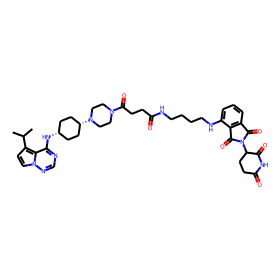

smiles:  CC(C)c1ccn2ncnc(N[C@H]3CC[C@@H](N4CCN(C(=O)CCC(=O)NCCCCCCNc5cccc6c5C(=O)N(C5CCC(=O)NC5=O)C6=O)CC4)CC3)c12
logD:  3.7
Jchem:  2.269830837
ADMET:  2.378
fpadmet:  2.178
prediction:  2.474


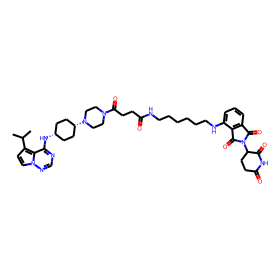

smiles:  CC(C)c1ccn2ncnc(N[C@H]3CC[C@@H](N4CCN(C(=O)CCC(=O)N5CCC(CN6CCN(c7ccc8c(c7)C(=O)N(C7CCC(=O)NC7=O)C8=O)CC6)CC5)CC4)CC3)c12
logD:  3.1
Jchem:  0.283725461
ADMET:  1.859
fpadmet:  2.272
prediction:  1.983


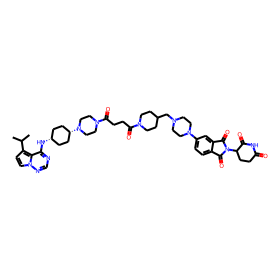

smiles:  CC(C)c1ccn2ncnc(N[C@H]3CC[C@@H](N4CCN(C(=O)CCC(=O)N5CCC(CCN6CCN(c7ccc8c(c7)C(=O)N(C7CCC(=O)NC7=O)C8=O)CC6)CC5)CC4)CC3)c12
logD:  3.1
Jchem:  0.610843828
ADMET:  2.041
fpadmet:  2.272
prediction:  1.998


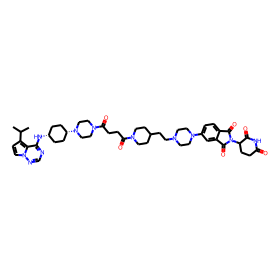

smiles:  CC(C)c1ccn2ncnc(N[C@H]3CC[C@@H](N4CCN(C(=O)CCC(=O)N5CCC(CCN6CCN(c7ccc8c(c7)C(=O)N(C7CCC(=O)N(C)C7=O)C8=O)CC6)CC5)CC4)CC3)c12
logD:  3.7
Jchem:  0.834545166
ADMET:  2.117
fpadmet:  2.272
prediction:  1.994


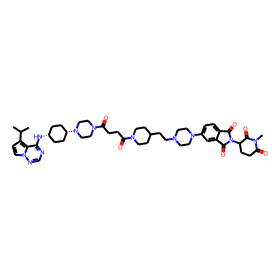

smiles:  CN1C(=O)C(NC(=O)c2[nH]nc3ncc(C(F)(F)C(F)(F)F)cc23)COc2ccccc21
logD:  4.1
Jchem:  1.99182358
ADMET:  3.047
fpadmet:  2.524
prediction:  3.115


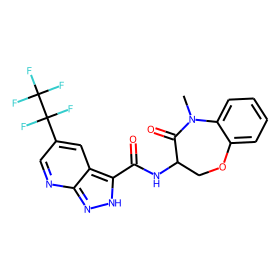

smiles:  CCCCCC[C@H]1OC[C@@H](C)NC(=O)C(COCCCCN)NC(=O)C(CN)NC(=O)C(C2CCCCC2)NC(=O)C(CC(C)C)N(C)C(=O)C1C
logD:  1.7
Jchem:  -1.296043252
ADMET:  3.819
fpadmet:  1.123
prediction:  1.193


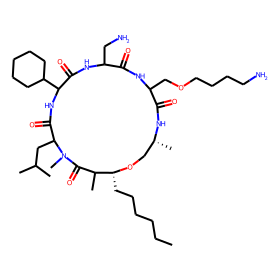

smiles:  CCCCCC[C@H]1OC[C@@H](C)NC(=O)C(COCCCN=C(N)N)NC(=O)C(CN)NC(=O)C(C2CCCCC2)NC(=O)C(CC(C)C)N(C)C(=O)C1C
logD:  2.0
Jchem:  -2.011712231
ADMET:  3.495
fpadmet:  1.052
prediction:  1.953


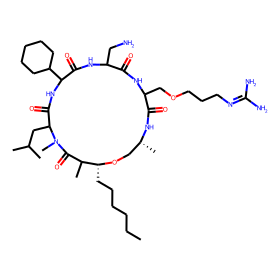

smiles:  COc1ccc(-c2c(C)nn3c(NCc4cccnc4)nc(C)nc23)cc1OC
logD:  4.5
Jchem:  2.814962928
ADMET:  2.478
fpadmet:  2.871
prediction:  2.866


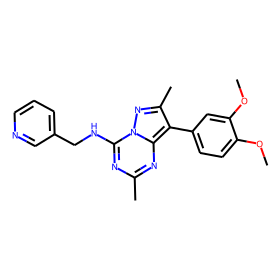

smiles:  COc1ccc(-c2c(C)nn3c(NCc4cccnc4)nc(C)cc23)cc1OC
logD:  5.5
Jchem:  2.562264515
ADMET:  2.694
fpadmet:  2.858
prediction:  3.506


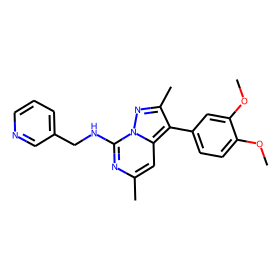

smiles:  COc1ccc(-c2c(C)nn3c(NCc4ccc(C(N)=O)cc4)nc(C)cc23)cc1OC
logD:  4.8
Jchem:  2.631590979
ADMET:  2.463
fpadmet:  2.815
prediction:  3.276


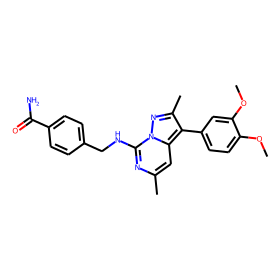

smiles:  COc1cccc(CNC2CCN(c3ccccc3-c3cncc(C(=O)NCCCN4CCCC4)c3)CC2)c1
logD:  1.9
Jchem:  -0.480883835
ADMET:  3.155
fpadmet:  2.77
prediction:  1.718


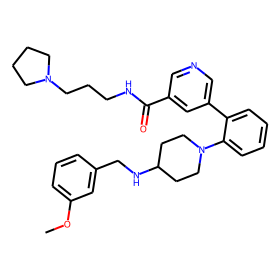

smiles:  CC(C)c1cc(C(=O)N2CCc3nc(OCCN4CCCC4)ncc3C2)c(O)cc1O
logD:  1.12
Jchem:  2.298438849
ADMET:  2.695
fpadmet:  2.087
prediction:  1.537


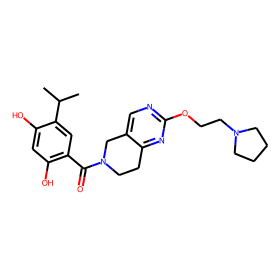

smiles:  CC(C)c1cc(C(=O)N2CCc3nc(OCCN4CCCCC4)ncc3C2)c(O)cc1O
logD:  1.21
Jchem:  2.84981328
ADMET:  3.01
fpadmet:  2.111
prediction:  1.593


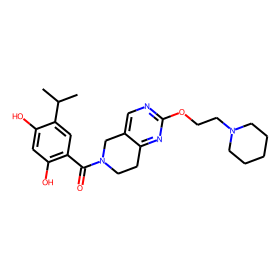

smiles:  CCOc1nc(Nc2ccc(C(=O)N3CCOCC3)cc2)nc2[nH]ccc12
logD:  3.9
Jchem:  2.507478787
ADMET:  2.579
fpadmet:  2.579
prediction:  3.007


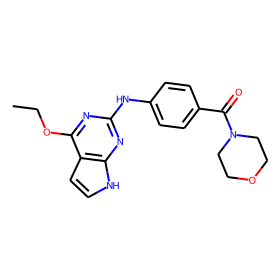

smiles:  CCOc1nc(Nc2ccc(C(=O)N3CCOCC3)cc2OC)nc2[nH]ccc12
logD:  4.5
Jchem:  2.34998458
ADMET:  2.643
fpadmet:  2.697
prediction:  2.887


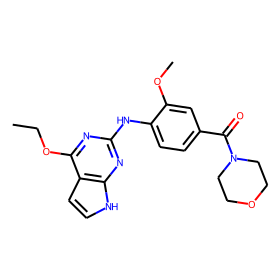

smiles:  Cc1cc2c(-c3ccco3)cnc(NC3CCN(C)CC3C(=O)NC3CCCCC3)c2[nH]c1=O
logD:  3.99
Jchem:  1.338666979
ADMET:  2.805
fpadmet:  2.509
prediction:  2.85


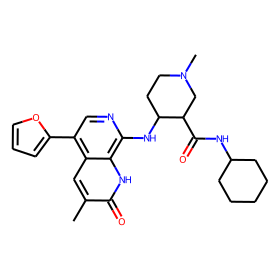

smiles:  Cc1ccc(-c2cnc(NC3CCN(C)CC3C(=O)NC3CCCCC3)c3[nH]c(=O)c(C)cc23)o1
logD:  4.33
Jchem:  1.537026776
ADMET:  2.923
fpadmet:  2.407
prediction:  3.08


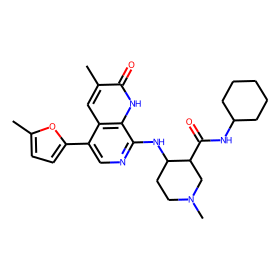

smiles:  Cc1ccoc1-c1cnc(NC2CCN(C)CC2C(=O)NC2CCCCC2)c2[nH]c(=O)c(C)cc12
logD:  4.35
Jchem:  1.85118116
ADMET:  3.298
fpadmet:  2.509
prediction:  3.154


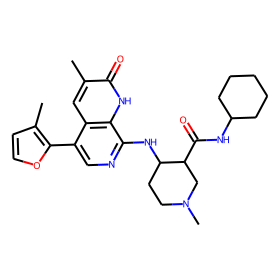

smiles:  Cc1cc2c(-c3cccs3)cnc(NC3CCN(C)CC3C(=O)NC3CCCCC3)c2[nH]c1=O
logD:  4.61
Jchem:  2.048098581
ADMET:  3.457
fpadmet:  2.157
prediction:  3.08


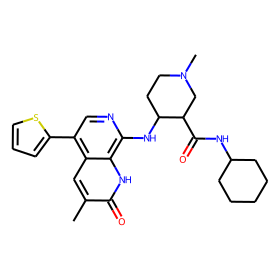

smiles:  Cc1ccc(-c2cnc(NC3CCN(C)CC3C(=O)NC3CCCCC3)c3[nH]c(=O)c(C)cc23)s1
logD:  5.3
Jchem:  2.692994341
ADMET:  3.635
fpadmet:  2.136
prediction:  3.418


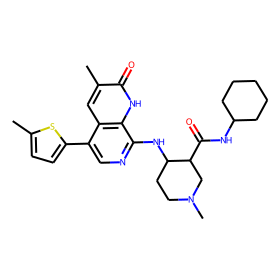

smiles:  Cc1csc(-c2cnc(NC3CCN(C)CC3C(=O)NC3CCCCC3)c3[nH]c(=O)c(C)cc23)c1
logD:  5.27
Jchem:  2.561565745
ADMET:  3.817
fpadmet:  2.178
prediction:  3.277


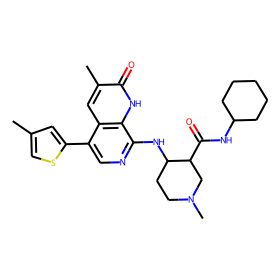

smiles:  Cc1ccsc1-c1cnc(NC2CCN(C)CC2C(=O)NC2CCCCC2)c2[nH]c(=O)c(C)cc12
logD:  5.13
Jchem:  2.560828958
ADMET:  3.553
fpadmet:  2.157
prediction:  3.239


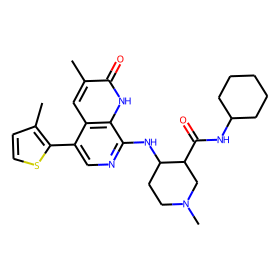

smiles:  CCNc1cc(F)cc2c1[nH]c1ncc(-c3cncc(Cc4nn[nH]n4)c3)c(-n3ccc(C(F)(F)F)n3)c12
logD:  1.93
Jchem:  3.916371585
ADMET:  3.231
fpadmet:  2.63
prediction:  2.039


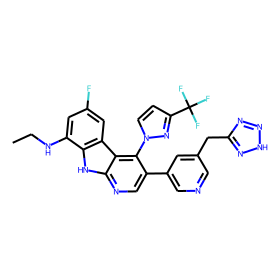

smiles:  COC(=O)NC(C(=O)N1CCCC1c1nc2cc(F)c([C@H]3CC[C@H](c4cc5[nH]c(C6CCCN6C(=O)C(NC(=O)OC)C(C)OC)nc5cc4F)N3c3cc(F)c(N4CCC(c5ccc(F)cc5)CC4)c(F)c3)cc2[nH]1)C(C)OC
logD:  5.7
Jchem:  7.627164894
ADMET:  4.654
fpadmet:  2.437
prediction:  4.792


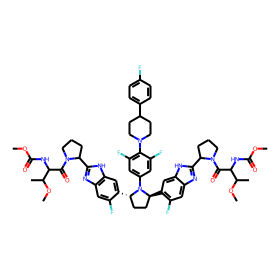

smiles:  O=C(CNC(=O)Nc1ccc(Br)cc1)Nc1cccnc1
logD:  3.6
Jchem:  1.564074313
ADMET:  2.509
fpadmet:  1.548
prediction:  2.869


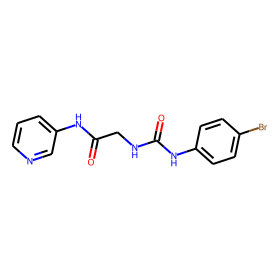

smiles:  Cc1c(N2CC[C@@H](C3(N)CC3)C2)c(F)cc2cc(C#N)c(=O)n(C3CC3)c12
logD:  1.19
Jchem:  -0.257829761
ADMET:  2.577
fpadmet:  2.034
prediction:  2.261


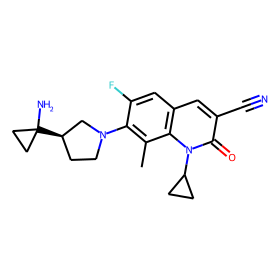

smiles:  Cc1c(N2CC[C@@H](C3(N)CC3)C2)c(F)cc2cc(-c3ncon3)c(=O)n(C3CC3)c12
logD:  1.46
Jchem:  0.242425597
ADMET:  2.622
fpadmet:  2.301
prediction:  2.02


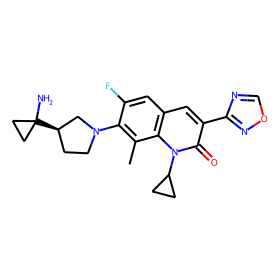

smiles:  CNC(=O)c1cc(C(=O)NC2CCOCC2)n([C@@H](C)c2ccccc2)n1
logD:  3.6
Jchem:  0.957823866
ADMET:  2.016
fpadmet:  1.567
prediction:  2.316


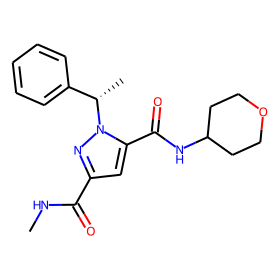

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2CC[C@H](OC)CC2)n([C@@H](C)c2ccccc2)n1
logD:  4.2
Jchem:  2.052316279
ADMET:  2.664
fpadmet:  2.038
prediction:  3.014


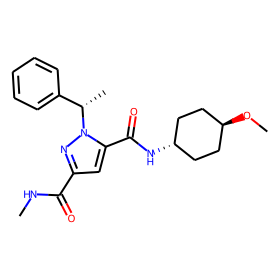

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2CC[C@H](OC)CC2)c(C(C)c2ccccc2)o1
logD:  4.1
Jchem:  2.458663885
ADMET:  2.957
fpadmet:  2.084
prediction:  2.831


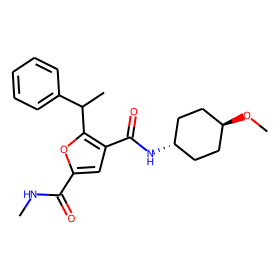

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2CC[C@H](O)CC2)c(C(C)c2cccc(F)c2)o1
logD:  4.1
Jchem:  1.958239309
ADMET:  2.509
fpadmet:  1.977
prediction:  2.317


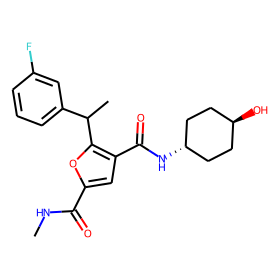

smiles:  CNC(=O)c1cc(C(=O)N[C@H]2CC[C@H](O)CC2)n([C@@H](C)c2cccc(C)c2)n1
logD:  3.4
Jchem:  1.922611158
ADMET:  2.345
fpadmet:  1.924
prediction:  2.566


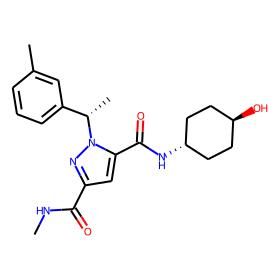

smiles:  CNC(=O)c1cc(C(N)=O)cc2c1O[C@H](CF)[C@H]2c1ccccc1
logD:  2.9
Jchem:  1.539953058
ADMET:  1.726
fpadmet:  2.21
prediction:  2.312


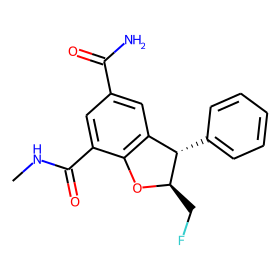

smiles:  CNC(=O)c1cc(C(=O)NC2CC2)cc2c1O[C@H](CF)[C@H]2c1ccccc1
logD:  3.9
Jchem:  2.229193548
ADMET:  2.567
fpadmet:  2.242
prediction:  3.226


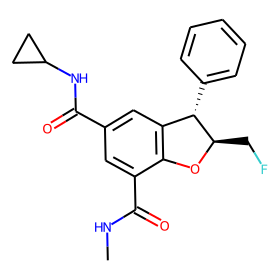

smiles:  CNC(=O)c1cc(C(=O)NC2CC2)cc2c1OC[C@H]2c1ccccc1
logD:  3.6
Jchem:  1.968436735
ADMET:  2.349
fpadmet:  2.225
prediction:  3.191


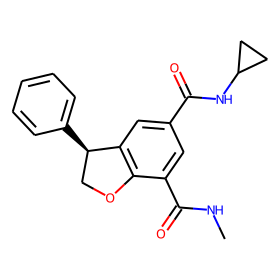

smiles:  CNC(=O)c1cc(C(=O)NC2CC2)cc2c1OC[C@H]2c1cccc(OC)c1
logD:  3.8
Jchem:  1.810765469
ADMET:  2.398
fpadmet:  2.081
prediction:  3.077


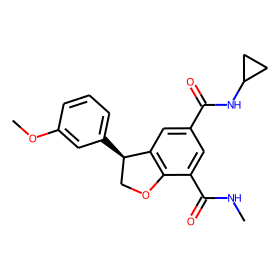

smiles:  CNC(=O)c1cc(C(=O)NC2CC2)cc2c1OC[C@H]2c1cccc(F)c1
logD:  3.7
Jchem:  2.111138671
ADMET:  2.452
fpadmet:  2.399
prediction:  3.344


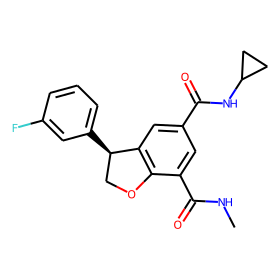

smiles:  CNC(=O)c1cc(C(=O)NC2CC2)cc2c1OC[C@H]2c1ccc(F)cc1
logD:  3.8
Jchem:  2.111138672
ADMET:  2.411
fpadmet:  2.399
prediction:  3.255


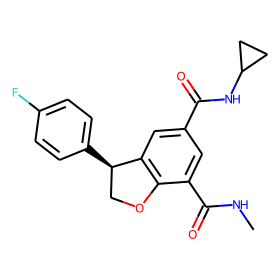

smiles:  CNC(=O)c1cc(C(=O)N[C@@H]2[C@H]3COC[C@H]32)cc2c1OC[C@H]2c1ccc(F)cc1
logD:  3.6
Jchem:  1.212544116
ADMET:  2.232
fpadmet:  2.322
prediction:  2.574


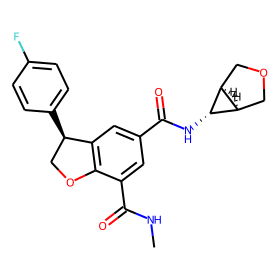

smiles:  CNC(=O)c1cc(C(=O)NC2CC2)cc2c1OC[C@@]2(C)c1ccccc1
logD:  4.0
Jchem:  2.34643757
ADMET:  2.709
fpadmet:  2.246
prediction:  3.36


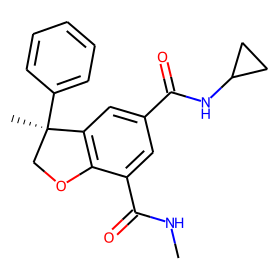

smiles:  Cn1cc(-c2[nH]nc3cc(Cl)c(N[C@@H]4CCNC4)cc23)cn1
logD:  0.32
Jchem:  -1.492886557
ADMET:  2.43
fpadmet:  2.087
prediction:  1.088


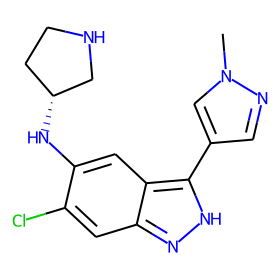

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(C(F)(F)F)c2)cc1
logD:  0.31
Jchem:  2.190755245
ADMET:  3.586
fpadmet:  2.194
prediction:  2.38


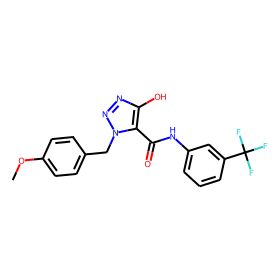

smiles:  CC1(C)C(=O)N(c2ccc(F)c(C(F)(F)F)c2)C(=O)N1CC#N
logD:  3.4
Jchem:  2.213102834
ADMET:  2.32
fpadmet:  1.77
prediction:  2.697


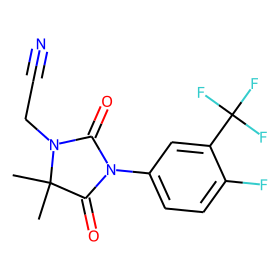

smiles:  N=C(N)NC(=O)c1nc(-c2cc3ccccc3s2)c(N2CCCCCC2)nc1N
logD:  5.3
Jchem:  3.795284484
ADMET:  2.365
fpadmet:  2.61
prediction:  4.553


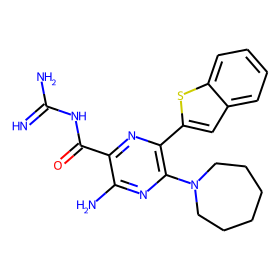

smiles:  CNC(=O)c1cc(C(=O)NC2CCOCC2)cc(Cc2ccccc2)n1
logD:  3.7
Jchem:  1.216952276
ADMET:  2.212
fpadmet:  1.98
prediction:  2.299


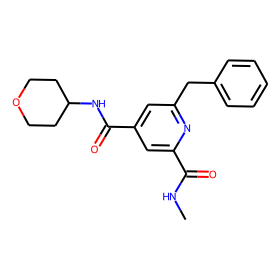

smiles:  CNC(=O)c1cc(C(=O)NC2CC2)cc(C(C)c2ccccc2)n1
logD:  4.3
Jchem:  2.264316988
ADMET:  2.73
fpadmet:  1.95
prediction:  3.095


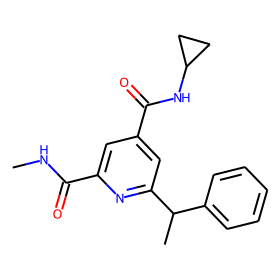

smiles:  CNC(=O)c1cc(C(=O)NC2CC2)cc(C(C)c2ccccc2)n1
logD:  4.4
Jchem:  2.264316988
ADMET:  2.73
fpadmet:  1.95
prediction:  3.108


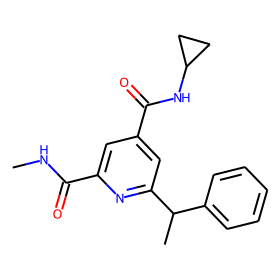

smiles:  COc1cc(F)c(C(C)C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C)cc(C(F)(F)F)c3)OC(=O)N12
logD:  7.0
Jchem:  9.045258443
ADMET:  4.916
fpadmet:  3.02
prediction:  5.671


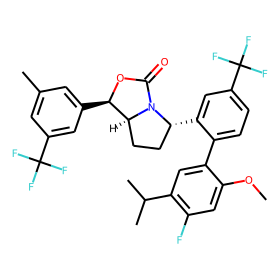

smiles:  COc1cc(F)c(C(C)C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(Cl)cc(C(F)(F)F)c3)OC(=O)N12
logD:  6.5
Jchem:  9.13588173
ADMET:  4.871
fpadmet:  3.0
prediction:  5.654


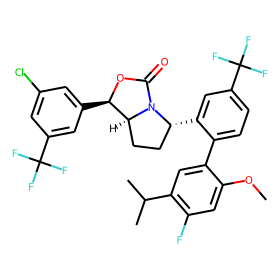

smiles:  COc1cc(F)c(C(C)C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cccc(C(F)(F)F)c3)OC(=O)N12
logD:  6.1
Jchem:  8.531837054
ADMET:  4.89
fpadmet:  3.02
prediction:  5.597


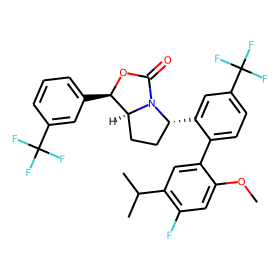

smiles:  COc1cc(F)c(C(C)C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  6.3
Jchem:  8.67453899
ADMET:  4.877
fpadmet:  3.02
prediction:  5.696


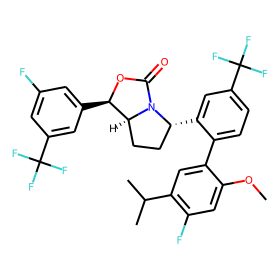

smiles:  COc1cc(F)c(C(C)C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(Cl)cc(Cl)c3)OC(=O)N12
logD:  6.1
Jchem:  8.862077925
ADMET:  4.643
fpadmet:  3.03
prediction:  5.71


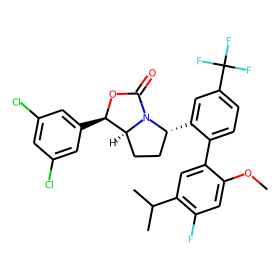

smiles:  COc1cc(F)c(C(C)C)cc1-c1ccc(F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  7.0
Jchem:  8.67453899
ADMET:  4.817
fpadmet:  3.04
prediction:  5.84


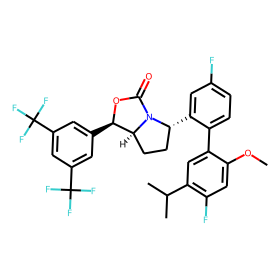

smiles:  COc1cc(F)c(C(C)C)cc1-c1cnc(N(C)C)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  7.0
Jchem:  8.006171247
ADMET:  4.455
fpadmet:  2.82
prediction:  5.059


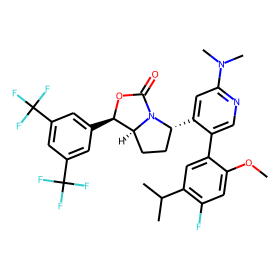

smiles:  COc1cc(F)c(C(C)C)cc1-c1ccc(N(C)C)nc1C1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  6.9
Jchem:  8.24909914
ADMET:  4.858
fpadmet:  2.84
prediction:  4.976


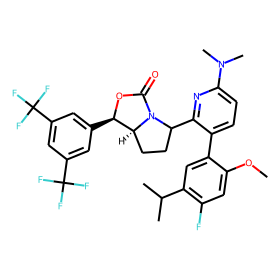

smiles:  Cc1cc(C(=O)O)ccc1-c1ccc(Cl)c(-c2ccc(C(F)(F)F)cc2CN2C(=O)O[C@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)[C@@H]2C)c1
logD:  6.2
Jchem:  7.377816506
ADMET:  4.676
fpadmet:  2.11
prediction:  4.771


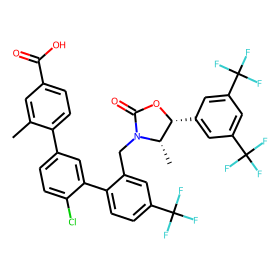

smiles:  Cc1ccc(Oc2cc(OC(C)C)c3nc(COc4cccc(C(=O)O)c4)n(C)c3c2)c(C)n1
logD:  1.9
Jchem:  0.877575386
ADMET:  3.023
fpadmet:  1.26
prediction:  2.11


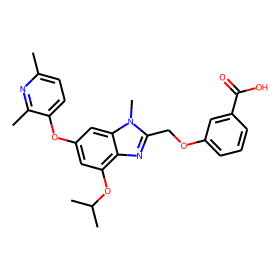

smiles:  COc1cc(Oc2cc(OC(C)C)c3nc(COc4cccc(C(=O)O)c4)n(C)c3c2)ccn1
logD:  2.0
Jchem:  0.879448867
ADMET:  3.257
fpadmet:  1.2
prediction:  2.059


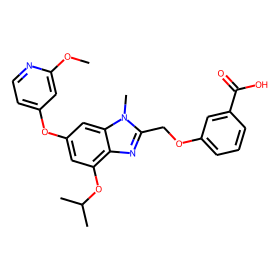

smiles:  Cn1c(=O)n(C2CCNCC2)c2c3cc(-c4cn[nH]c4)ccc3ncc21
logD:  0.1
Jchem:  -1.291631618
ADMET:  1.887
fpadmet:  2.49
prediction:  -0.349


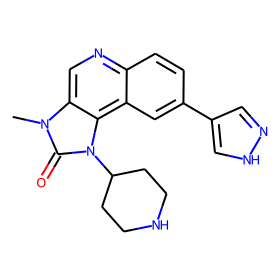

smiles:  Cc1cc(OC(CCC(F)(F)F)c2ccc(C(=O)NCCC(=O)O)cc2)cc(C)c1-c1ccc(C(C)(C)C)cc1
logD:  3.5
Jchem:  4.902867124
ADMET:  4.686
fpadmet:  2.23
prediction:  4.453


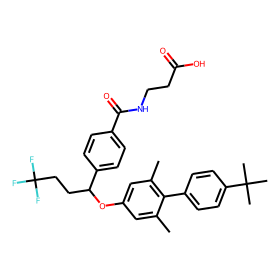

smiles:  Cc1ncsc1-c1ccc(CNC(=O)C2C[C@@H](O)CN2C(=O)C(NC(=O)COCCOCCNC(=O)CCC(=O)N2CCN([C@H]3CC[C@@H](Nc4ncnn5ccc(C(C)C)c45)CC3)CC2)C(C)(C)C)cc1
logD:  3.3
Jchem:  1.113189203
ADMET:  2.189
fpadmet:  2.71
prediction:  1.814


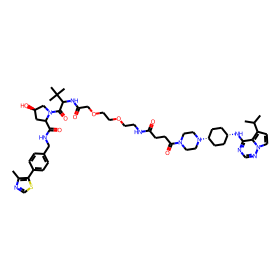

smiles:  Cc1ncsc1-c1ccc(CNC(=O)C2C[C@@H](O)CN2C(=O)C(NC(=O)CCCNC(=O)CCC(=O)N2CCN([C@H]3CC[C@@H](Nc4ncnn5ccc(C(C)C)c45)CC3)CC2)C(C)(C)C)cc1
logD:  3.7
Jchem:  1.732816273
ADMET:  2.342
fpadmet:  2.59
prediction:  1.888


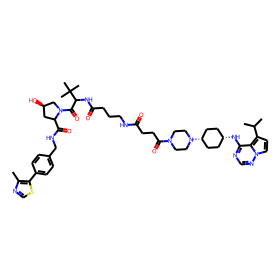

smiles:  COc1ccc(CC(=O)Nc2cnn(C(C)C)c2)cc1OC
logD:  0.9
Jchem:  1.931175788
ADMET:  2.354
fpadmet:  1.57
prediction:  1.845


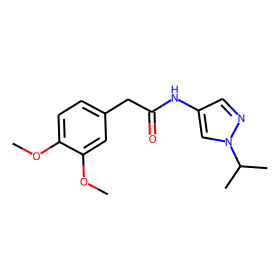

smiles:  COc1ccc(-c2c(C)nn3c(NCC4CCOCC4)nc(C)nc23)cc1OC
logD:  5.1
Jchem:  2.666424379
ADMET:  2.7
fpadmet:  2.8
prediction:  3.078


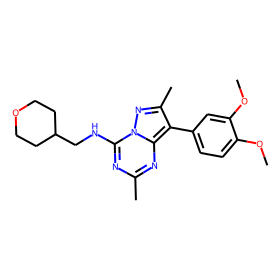

smiles:  COc1ccc(-c2c(C)nn3c(NCc4cccnc4)cc(C)nc23)cc1OC
logD:  4.3
Jchem:  2.315445866
ADMET:  2.986
fpadmet:  2.88
prediction:  2.859


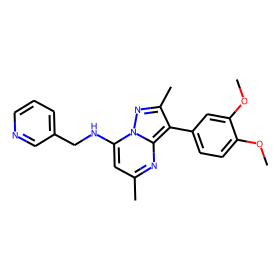

smiles:  CC(C)SC(=O)N1CCC(Oc2cc(N3CCc4ccccc43)ncn2)CC1
logD:  5.3
Jchem:  3.977827781
ADMET:  4.086
fpadmet:  2.52
prediction:  4.368


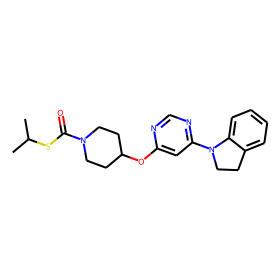

smiles:  COc1cc2ncnc(Nc3cnc(OCCC4CC4)nc3)c2cc1OCC1CCNCC1
logD:  1.4
Jchem:  0.222052359
ADMET:  3.12
fpadmet:  2.57
prediction:  0.84


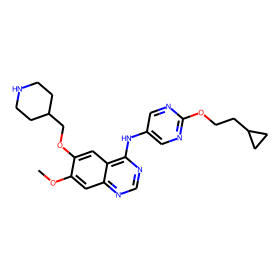

smiles:  COc1cc2c(Nc3cnc(NC(=O)c4cccn4C)nc3)ncnc2cc1OCCCNC1CCCC1
logD:  1.8
Jchem:  0.430549285
ADMET:  3.123
fpadmet:  2.6
prediction:  1.029


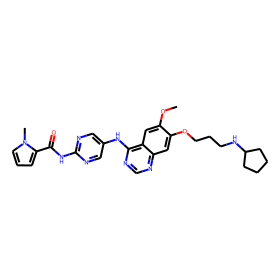

smiles:  Cc1c(N2CCC(C3(N)CC3)C2)c(F)cc2c(CC(=O)N(C)C)cc(=O)n(C3CC3)c12
logD:  0.27
Jchem:  -1.005557381
ADMET:  1.895
fpadmet:  2.12
prediction:  1.085


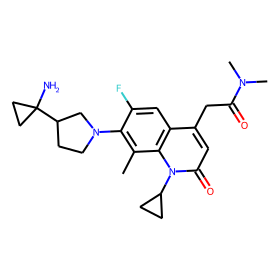

smiles:  CCS(=O)(=O)c1ccc(C(NC(=O)CC2CC2)C(=O)Nc2ccc(C(O)(C(F)(F)F)C(F)(F)F)cc2)nc1
logD:  3.5
Jchem:  2.357111178
ADMET:  2.494
fpadmet:  2.13
prediction:  3.449


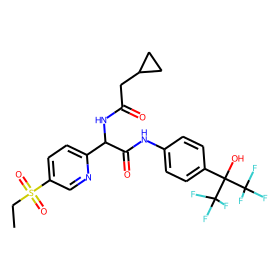

smiles:  CNC(=O)c1cc(C(=O)NC2CC2)n([C@@H](C)c2ccccc2)n1
logD:  3.6
Jchem:  1.462202307
ADMET:  2.307
fpadmet:  1.96
prediction:  2.672


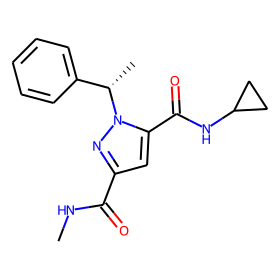

smiles:  CNC(=O)c1cc(C(=O)NC2CC2)cc2c1OC[C@H]2c1cccc2[nH]ccc12
logD:  3.5
Jchem:  2.067198726
ADMET:  2.448
fpadmet:  2.52
prediction:  2.889


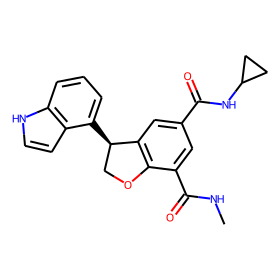

smiles:  N=C(N)NC(=O)c1nc(-c2ccco2)c(N2CCCCCC2)nc1N
logD:  4.3
Jchem:  1.923127837
ADMET:  0.923
fpadmet:  2.12
prediction:  3.672


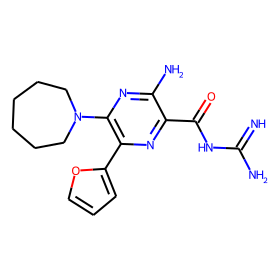

smiles:  COc1ncc(Oc2ccc3nc(COc4cccc(C(=O)O)c4)n(C)c3c2)cc1C
logD:  2.0
Jchem:  0.791511302
ADMET:  3.32
fpadmet:  1.21
prediction:  1.907


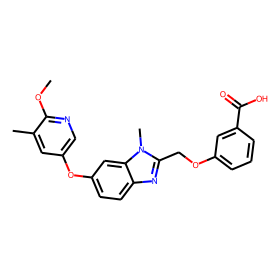

smiles:  CCCCc1nc(C)c(CC(=S)N(C)C)c(=O)n1Cc1ccc(-c2ccccc2-c2nn[nH]n2)cc1
logD:  0.9
Jchem:  4.973516584
ADMET:  3.567
fpadmet:  2.29
prediction:  1.766


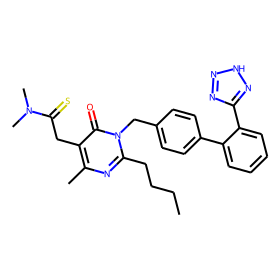

smiles:  CCCOc1ccc(S(=O)(=O)N2CCN(CC)CC2)cc1-c1nc(=O)c2nn(Cc3ccccn3)c(CC)c2[nH]1
logD:  1.0
Jchem:  2.539303845
ADMET:  2.878
fpadmet:  2.52
prediction:  1.163


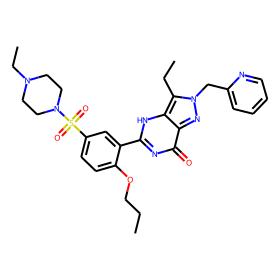

smiles:  CCCCCCCCCC[C@H]1OC(=O)CNC(=O)C(C(C)O)NC(=O)C(CN)NC(=O)C(C(C)CC)NC(=O)C(CC(C)C)N(C)C(=O)C1C
logD:  4.6
Jchem:  1.905871411
ADMET:  3.561
fpadmet:  1.68
prediction:  4.005


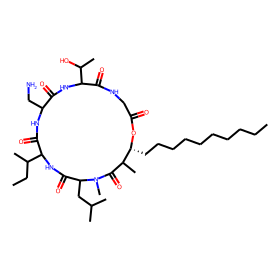

smiles:  COc1cc2c(cc1OCCCCCCCC(=O)O)C[C@@H](C(C)C)n1cc(C(=O)O)c(=O)cc1-2
logD:  0.07
Jchem:  -1.78278209
ADMET:  2.329
fpadmet:  1.29
prediction:  1.593


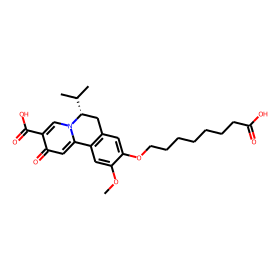

smiles:  COc1cc2c(cc1OCCCCCCCCC(=O)O)C[C@@H](C(C)C)n1cc(C(=O)O)c(=O)cc1-2
logD:  0.7
Jchem:  -1.061784578
ADMET:  2.424
fpadmet:  1.29
prediction:  1.801


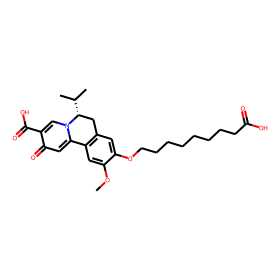

It took 503.8828s to complete the task


In [5]:
# -*- coding: utf-8 -*-
#
# Copyright Amazon.com, Inc. or its affiliates. All Rights Reserved.
# SPDX-License-Identifier: Apache-2.0
import time
import json
import pickle
import datetime
import pandas as pd
import numpy as np
import torch
import copy
from rdkit import Chem
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D
from IPython.display import SVG
from IPython.display import display
import matplotlib
import matplotlib.cm as cm
from matplotlib import pyplot as plt

import torch.nn as nn
from dgllife.utils import Meter, EarlyStopping
import sys
sys.path.append("..") 
from torch.utils.data import DataLoader
from utils import get_label_mean_and_std, collate, load_model
from utils import get_configure, mkdir_p, init_trial_path, \
    collate_molgraphs, load_model, predict, init_featurizer, load_dataset
from torch.nn.utils import clip_grad_norm
import os
os.environ['CUDA_VISIBLE_DEVICES']='3'
def log_model_evaluation(smiles_list,args, model, test_loader):
    dt = datetime.datetime.now()
    file_name='1test_result_{}_{:02d}-{:02d}-{:02d}.csv'.format(
                dt.date(), dt.hour, dt.minute, dt.second)
    with open(file_name, 'w') as f: 
        def _log_values(metric, test_values):
            f.write('{}\n'.format(metric))
            headline = '|            | averaged |'
            for t in args['task']:
                headline += ' {:15} |'.format(t)
            headline += '\n'
            f.write(headline)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            for name, values in {
                                    'Test': test_values}.items():
                row = '| {:10s} | {:8.3f} |'.format(name, np.mean(values))
                
                for t in range(len(args['task'])):
                    if len(args['task'])==1:
                        row += ' {:15.3f} |'.format(values)
                    else:
                        row += ' {:15.3f} |'.format(values[t])
                row += '\n'
                f.write(row)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            f.write('\n')
        test_r2,test_mae,test_rmse = run_an_eval_epoch(smiles_list,args, model, test_loader)
        _log_values('r2', test_r2)
        _log_values('mae',test_mae)
        _log_values('rmse', test_rmse)

def mol_with_atom_index( mol ):
    atoms = mol.GetNumAtoms()
    for idx in range( atoms ):
        mol.GetAtomWithIdx( idx ).SetProp( 'molAtomMapNumber', str( mol.GetAtomWithIdx( idx ).GetIdx() ) )
    return mol

def draw(atom_weights,smiles,bg,logD,prediction,Jchem,fpadmet,ADMET):
    # print("JCHEM: ",Jchem)
    # print("LogD: ",logD)
    min_value = torch.min(atom_weights)
    max_value = torch.max(atom_weights)
    atom_weights = (atom_weights - min_value) / (max_value - min_value)

    norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
    cmap = cm.get_cmap('bwr')
    try:
   #     if((abs(prediction[0][0].item()-logD)>1)&(Jchem-logD>1)&(fpadmet-logD>1)&(ADMET-logD)>1):
        if((abs(Jchem-logD)>1)&(abs(fpadmet-logD)>0.5)&(abs(ADMET-logD)>1)):
            plt_colors = cm.ScalarMappable(norm=norm, cmap=cmap)
            atom_colors = {i: plt_colors.to_rgba(atom_weights[i].data.item()) for i in range(bg.number_of_nodes())}
        # print("atom_colors: ",atom_colors)
            mol = Chem.MolFromSmiles(smiles[0])
            rdDepictor.Compute2DCoords(mol)
            drawer = rdMolDraw2D.MolDraw2DSVG(280, 280)
            drawer.SetFontSize(1)
            op = drawer.drawOptions()
        #    mol_with_atom_index(mol=mol)
            mol = rdMolDraw2D.PrepareMolForDrawing(mol)
            drawer.DrawMolecule(mol)
                                # , highlightAtoms=range(bg.number_of_nodes()),
                                #     highlightBonds=[],
                                #     highlightAtomColors=atom_colors)
            drawer.FinishDrawing()
            
            svg = drawer.GetDrawingText()
            svg = svg.replace('svg:', '')
            print("smiles: ",smiles[0])
            print("logD: ",logD)
            print("Jchem: ",Jchem)
            print("ADMET: ",ADMET)
            print("fpadmet: ",fpadmet)
            print("prediction: ",round(prediction[0][0].item(),3))
        #  plt.colorbar()
            display(SVG(svg))
    except:
        print("problem smiles: ",smiles[0])
        print("\n")
        a=Chem.MolFromSmiles(smiles[0])
        display(a)
        


def run_an_eval_epoch(smiles_list,args, model, data_loader,logD,Jchem,fpadmet,ADMET):
    model.eval()
    eval_meter = Meter(args['train_mean'], args['train_std'])
    predictions = []
    i=0
    with torch.no_grad():
        for _, batch_data in enumerate(data_loader):
            smiles, bg, labels, masks = batch_data
            # print("bg: ",bg)
            prediction,weight = predict(args, model, bg)
            atom_weights = weight[0]
            # print("atom_weights: ",atom_weights)
            
            prediction = prediction.detach().cpu() * args['train_std'].cpu()+args['train_mean'].cpu()
            draw(atom_weights,smiles,bg,logD[i],prediction,Jchem[i],fpadmet[i],ADMET[i])
            eval_meter.update(prediction, labels, masks)
            predictions.append(prediction)
            i=i+1
        predictions = torch.cat(predictions, dim=0)

        output_data = {'canonical_smiles': smiles_list}
        if args['task'] is None:
            args['task'] = ['task_{:d}'.format(t) for t in range(1, args['n_tasks'] + 1)]
        else:
            pass
            #args['task'] = args['task'].split(',')
        for task_id, task_name in enumerate(args['task']):
            output_data[task_name] = predictions[:, task_id]
        df = pd.DataFrame(output_data)
        # df.to_csv('./pretrain_76_small_similarity_new.csv', index=False)
        out=pd.read_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/media_similarity_results.csv")
        out['new_new_pretrain_76']=df['standard_value']
        out.to_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/media_similarity_results.csv",index=False)


def main(smiles_list,args, exp_config, test_set,logD,Jchem,fpadmet,ADMET):
    # Record settings
    exp_config.update({
        'model': args['model'],
        'mode':args['mode'],
        'n_tasks': args['n_tasks'],
        'atom_featurizer_type': args['atom_featurizer_type'],
        'bond_featurizer_type': args['bond_featurizer_type']
    })
    if args['atom_featurizer_type'] != 'pre_train':
        exp_config['in_node_feats'] = args['node_featurizer'].feat_size()+2
    if args['edge_featurizer'] is not None and args['bond_featurizer_type'] != 'pre_train':
        exp_config['in_edge_feats'] = args['edge_featurizer'].feat_size()

    # Set up directory for saving results
    t0 = time.time()
  
    test_loader = DataLoader(dataset=test_set, batch_size=1,#exp_config['batch_size'],
                             collate_fn=collate_molgraphs, num_workers=args['num_workers'])
    model = load_model(exp_config).to(args['device'])
    #checkpoint = torch.load('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/model_pretrain_76.pth', map_location='cpu')
    path='/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/my_model/new_pretrain_76/model_pretrain_76.pth'
    checkpoint=torch.load(path,map_location='cpu')
    model.load_state_dict(checkpoint)['model_state_dict']

    run_an_eval_epoch(smiles_list,args, model, test_loader,logD,Jchem,fpadmet,ADMET)

    print('It took {:.4f}s to complete the task'.format(time.time() - t0))

   
if __name__ == '__main__':
    from argparse import ArgumentParser
    from argparse import ArgumentParser
    from dgllife.data import MoleculeCSVDataset
    from dgllife.utils import smiles_to_bigraph, RandomSplitter
    import torch
   # from configure import configs
  #  from run import main
    from utils import mkdir_p, setup
    # reload a file to a variable
    # with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_no_pretrain_76_norm_new/3/args.pickle', 'rb') as file:
    #     args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/args.pickle', 'rb') as file:
        args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/configure.json', 'r') as f:
        exp_config = json.load(f)
    if torch.cuda.is_available():
        args['device'] = torch.device('cuda:0')
    else:
        args['device'] = torch.device('cpu')
    args = setup(args)
    test_set = pd.read_csv('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/all_external_test_with_logp.csv')
    Jchem=test_set['Jchem']
    fpadmet=test_set['fpadmet']
    ADMET=test_set['ADMET_lab2.0']
    
    logD=test_set['standard_value']
    test_set['logp']=np.nan
    smiles_list=test_set['smiles'].to_list()
    test_set = load_dataset(args,test_set,"test")
    exp_config = get_configure(args['model'],"test")
    main(smiles_list,args, exp_config,test_set,logD,Jchem,fpadmet,ADMET)

Loading previously saved dgl graphs...
in node features  76
smiles:  CCN(CC)Cc1ccc(OC)c(-c2cc3c(-c4ccc(-c5nnn[nH]5)c(C(C)C)c4)ccnc3[nH]2)c1
logD:  0.93
Jchem:  3.45
ADMET:  4.308
fpadmet:  2.799
prediction:  2.45


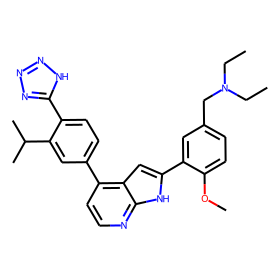

smiles:  N[C@@]1(C(=O)O)[C@@H](F)C[C@H]2[C@H](C(=O)O)[C@H]21
logD:  -4.02
Jchem:  -6.12
ADMET:  0.15
fpadmet:  -0.696
prediction:  0.034


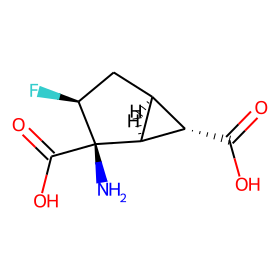

smiles:  CC1(CN)CCN(c2cnc(Sc3cccnc3C(F)(F)F)c(N)n2)CC1
logD:  -1.6
Jchem:  0.49
ADMET:  2.294
fpadmet:  2.263
prediction:  1.06


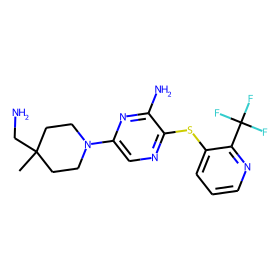

smiles:  Nc1nccc(Sc2cnc(N3CCC4(CCC[C@H]4N)CC3)cn2)c1Cl
logD:  1.2
Jchem:  0.11
ADMET:  3.3
fpadmet:  2.32
prediction:  0.907


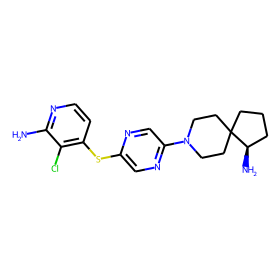

smiles:  CC(C)(O)c1ccc2c(c1)C(=O)N(Cc1ccc(Cl)cn1)[C@@]2(OCC1(CO)CC1)c1ccc(Cl)cc1
logD:  0.3
Jchem:  4.86
ADMET:  3.378
fpadmet:  2.703
prediction:  4.022


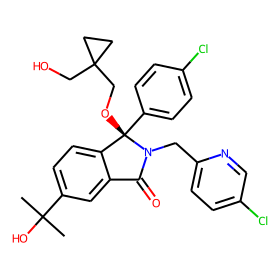

smiles:  C/C=C1\NC(=O)C(NC(=O)CCCCCCCCC)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  3.756
Jchem:  -13.44
ADMET:  -0.893
fpadmet:  -0.05
prediction:  -0.666


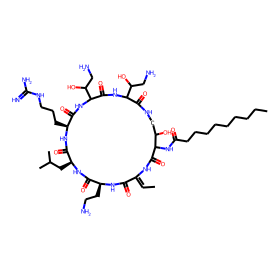

smiles:  C/C=C1\NC(=O)C(NC(=O)COc2ccc(/C=C/C(=O)OC(C)(C)C)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  2.65
Jchem:  -14.14
ADMET:  -0.893
fpadmet:  0.517
prediction:  -1.252


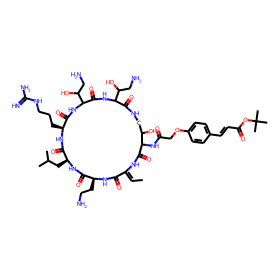

smiles:  C/C=C1\NC(=O)C(NC(=O)c2ccc(Oc3ccccc3CCCC)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC(=O)[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  4.984
Jchem:  -12.05
ADMET:  -0.154
fpadmet:  1.702
prediction:  -0.846


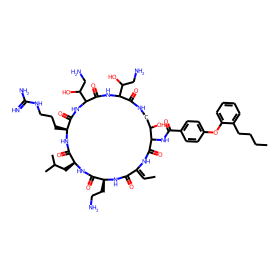

smiles:  C/C=C1\NC(=O)C(NC(=O)c2ccc(Oc3ccccc3-c3ccccc3)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  4.648
Jchem:  -12.29
ADMET:  -0.464
fpadmet:  2.536
prediction:  -0.643


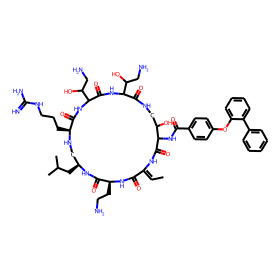

smiles:  C/C=C1\NC(=O)C(NC(=O)c2ccc(-c3ccc(Cl)cc3)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  3.752
Jchem:  -13.18
ADMET:  -0.386
fpadmet:  2.017
prediction:  -0.929


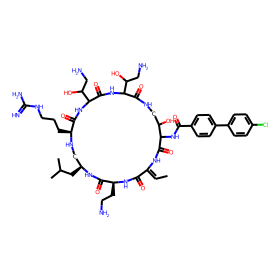

smiles:  C/C=C1\NC(=O)C(NC(=O)c2ccc(OCCCCc3ccccc3)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  4.37
Jchem:  -12.69
ADMET:  -0.889
fpadmet:  1.612
prediction:  -1.4


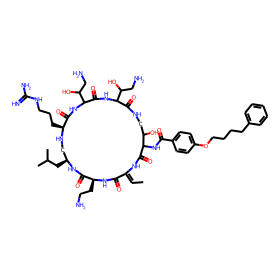

smiles:  C/C=C1\NC(=O)C(NC(=O)C[C@H](O)CCCCCCCCCCC)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  4.479
Jchem:  -12.93
ADMET:  0.31
fpadmet:  -0.069
prediction:  -0.022


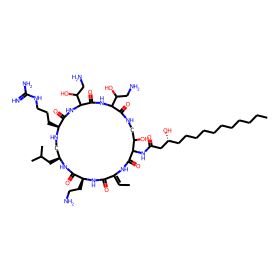

smiles:  C/C=C1\NC(=O)C(NC(=O)CCCc2ccc(C)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  2.993
Jchem:  -14.05
ADMET:  -2.127
fpadmet:  -0.461
prediction:  -2.11


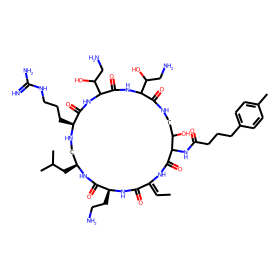

smiles:  C/C=C1\NC(=O)C(NC(=O)CCCc2ccc(C(C)(C)C)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  3.907
Jchem:  -13.02
ADMET:  -0.966
fpadmet:  -0.319
prediction:  -1.46


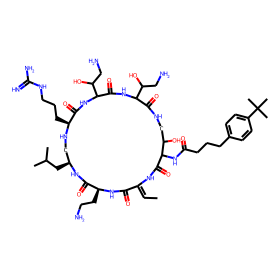

smiles:  C/C=C1\NC(=O)C(NC(=O)c2ccc(Oc3ccc(C)cc3)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)[C@H](CCCNC(=N)N)NC[C@H](CC(C)C)NC(=O)[C@H](CCN)NC1=O
logD:  3.616
Jchem:  -13.42
ADMET:  -1.218
fpadmet:  1.597
prediction:  -1.512


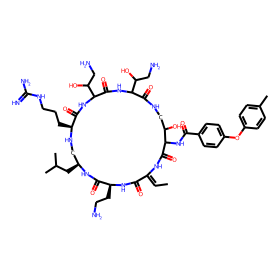

smiles:  COc1ncc(C2=CCOCC2)cc1S(=O)(=O)Nc1cncc(C#CCN2C[C@H](C)O[C@H](C)C2)c1
logD:  3.6
Jchem:  1.37
ADMET:  1.486
fpadmet:  1.752
prediction:  1.487


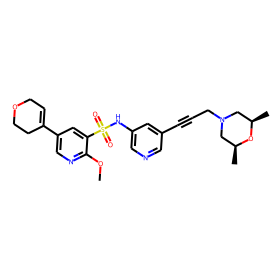

smiles:  COc1ncc(C2=CCOCC2)cc1S(=O)(=O)Nc1cncc(-c2ccc(CN3CCCCC3)s2)c1
logD:  4.7
Jchem:  1.73
ADMET:  2.383
fpadmet:  2.162
prediction:  1.604


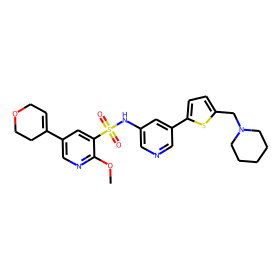

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCC(COc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.46
Jchem:  4.43
ADMET:  3.445
fpadmet:  2.54
prediction:  3.183


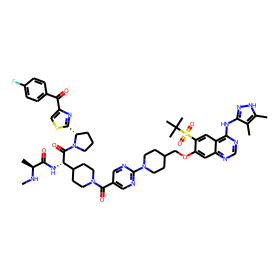

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCC(CCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.61
Jchem:  4.8
ADMET:  3.652
fpadmet:  2.524
prediction:  3.323


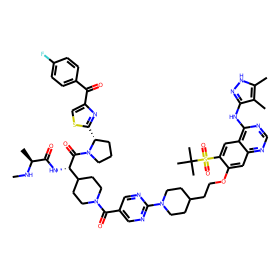

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCC(CCCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.66
Jchem:  5.24
ADMET:  3.901
fpadmet:  2.524
prediction:  3.578


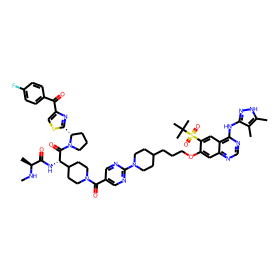

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCN(CCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.48
Jchem:  3.81
ADMET:  2.936
fpadmet:  2.535
prediction:  2.748


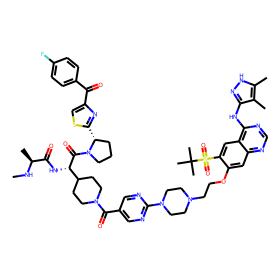

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCN(CCCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.78
Jchem:  3.86
ADMET:  3.045
fpadmet:  2.524
prediction:  2.649


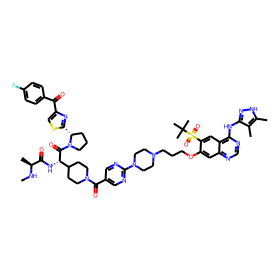

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2ccc(N3CCN(CCCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.64
Jchem:  4.48
ADMET:  3.282
fpadmet:  2.524
prediction:  2.713


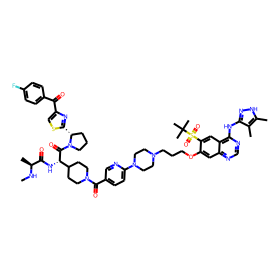

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCN(CCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)cn2)CC1
logD:  0.46
Jchem:  3.6
ADMET:  2.995
fpadmet:  2.531
prediction:  2.624


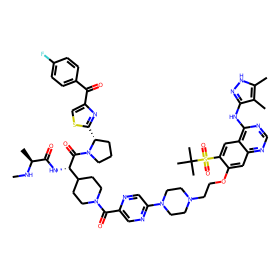

smiles:  CN[C@@H](C)C(=O)N[C@H](C(=O)N1CCC[C@H]1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2cnc(N3CCN(CCCOc4cc5ncnc(Nc6n[nH]c(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)cn2)CC1
logD:  0.72
Jchem:  3.65
ADMET:  3.103
fpadmet:  2.525
prediction:  2.539


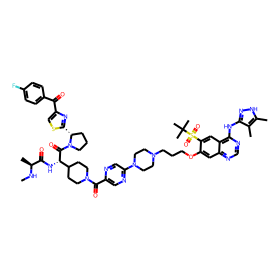

smiles:  O=C(/C=C/CNCCOc1ccc(Oc2c(-c3ccc(F)cc3)sc3cc(O)ccc23)cc1)N1CCC1
logD:  1.67
Jchem:  3.63
ADMET:  4.179
fpadmet:  3.253
prediction:  3.695


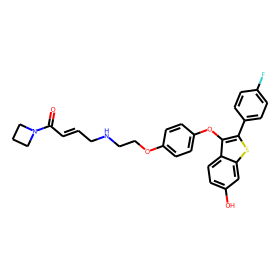

smiles:  CC1(C)NC(=O)C(c2ccc(F)c(C(F)(F)F)c2)C1=O
logD:  0.5
Jchem:  2.813945213
ADMET:  2.58
fpadmet:  1.782
prediction:  2.16


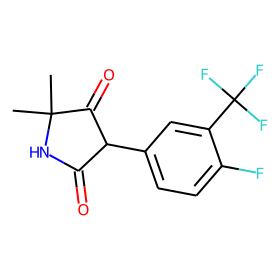

smiles:  CNC(=O)CN(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(OC)c(C)c1
logD:  5.7
Jchem:  4.547037632
ADMET:  3.549
fpadmet:  3.275
prediction:  4.124


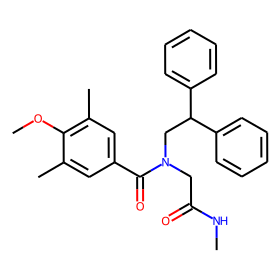

smiles:  Cc1cc(C(=O)N(CC(c2ccccc2)c2ccccc2)C(C)CN2CCOCC2)cn(C)c1=O
logD:  5.4
Jchem:  3.376877392
ADMET:  3.167
fpadmet:  2.978
prediction:  4.76


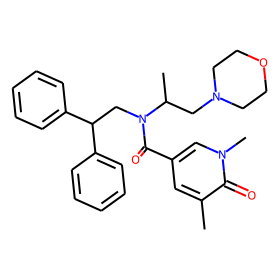

smiles:  COCC(COC)N(CC(c1ccccc1)c1ccccc1)C(=O)c1cc(C)c(=O)n(C)c1
logD:  5.5
Jchem:  3.189278996
ADMET:  2.866
fpadmet:  3.019
prediction:  3.329


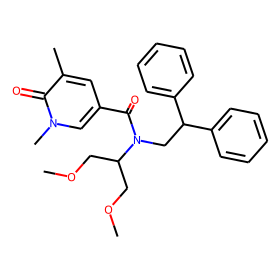

smiles:  COc1cc(F)c(-c2ccc(-c3nnc(N)o3)cc2C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C)cc(C(F)(F)F)c3)OC(=O)N12
logD:  6.6
Jchem:  8.822428809
ADMET:  4.55
fpadmet:  2.726
prediction:  5.399


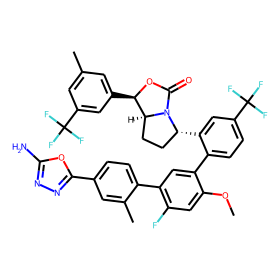

smiles:  COc1cc(F)c(-c2ccc(-c3n[nH]c(=O)o3)cc2C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C)cc(C(F)(F)F)c3)OC(=O)N12
logD:  6.9
Jchem:  9.332662172
ADMET:  4.51
fpadmet:  2.79
prediction:  5.666


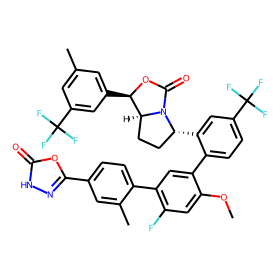

smiles:  CNC(=O)c1nn(C)c2ccc(Nc3nccc(-n4cc(N[C@@H]5CCNC5)c(C)n4)n3)cc12
logD:  0.3
Jchem:  -1.8458891
ADMET:  2.779
fpadmet:  2.251
prediction:  1.459


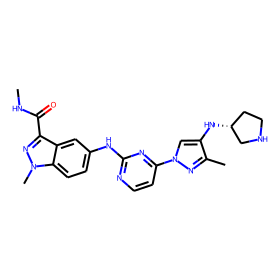

smiles:  CNC(=O)c1nn(C)c2ccc(Nc3nccc(-n4cc(N[C@@H]5CCCNC5)c(C)n4)n3)cc12
logD:  0.6
Jchem:  -0.607572671
ADMET:  2.937
fpadmet:  2.075
prediction:  1.545


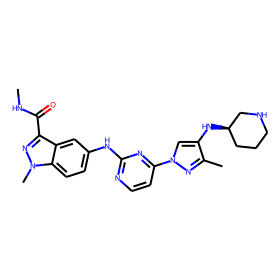

smiles:  O=C(NC1CCN(C2CCCCC2)CC1)c1nnc(-c2ccc(F)cc2F)o1
logD:  1.6
Jchem:  0.408392548
ADMET:  3.621
fpadmet:  2.759
prediction:  2.244


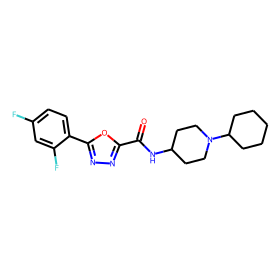

smiles:  COc1ccc(-c2c(C)nc3c(NCC4CCOCC4)nc(C)cn23)cc1OC
logD:  5.2
Jchem:  1.545442619
ADMET:  3.093
fpadmet:  2.704
prediction:  3.025


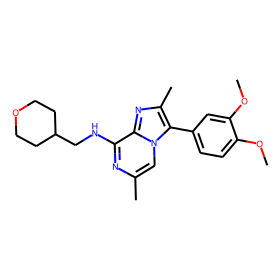

smiles:  COc1ccc(-c2c(C)nc3c(NCC4CCOCC4)cc(C)cn23)cc1OC
logD:  6.0
Jchem:  2.502792236
ADMET:  3.729
fpadmet:  2.864
prediction:  3.53


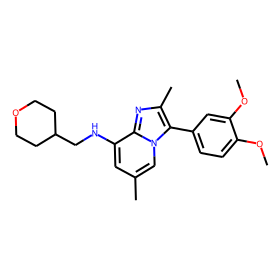

smiles:  c1ccc2c(c1)nc1cc3c(c[nH]c4ccccc43)cc12
logD:  -1.55
Jchem:  4.593732313
ADMET:  4.219
fpadmet:  2.793
prediction:  2.037


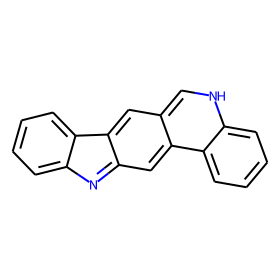

smiles:  Fc1ccc2c(c1)[nH]cc1cc3c(cc12)nc1ccccc13
logD:  1.61
Jchem:  4.735851082
ADMET:  4.203
fpadmet:  2.773
prediction:  2.237


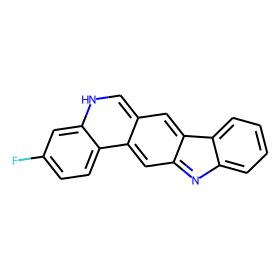

smiles:  CCOc1nc(Nc2ccc(C(=O)N3C[C@H](C)O[C@H](C)C3)cc2OC)nc2[nH]ccc12
logD:  5.7
Jchem:  3.183134637
ADMET:  3.061
fpadmet:  2.688
prediction:  2.901


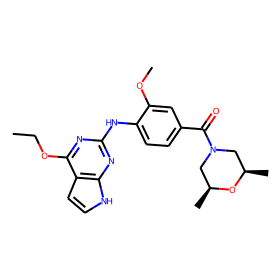

smiles:  CCOc1nc(Nc2ccc(C(=O)N3CCOC[C@H]3C)cc2OC)nc2[nH]ccc12
logD:  5.1
Jchem:  2.766559659
ADMET:  2.819
fpadmet:  2.698
prediction:  2.962


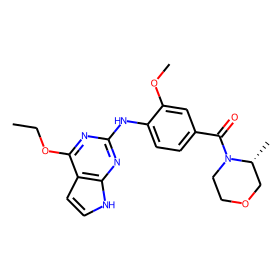

smiles:  CCOc1nc(Nc2ccc(C(=O)N3CCOC[C@@H]3C)cc2OC)nc2[nH]ccc12
logD:  5.0
Jchem:  2.766559659
ADMET:  2.8
fpadmet:  2.698
prediction:  2.952


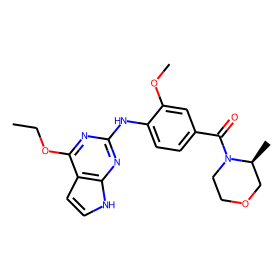

smiles:  CCCCCCCCCC(=O)NC1C(=O)N=C(CC)C(=O)NC(CCN)C(=O)NC(CC(C)C)C(=O)NC(CCCNC(=N)N)C(=O)NC(C(O)CN)C(=O)NC(C(O)CN)C(=O)NCC1O
logD:  3.756
Jchem:  -12.33762487
ADMET:  -1.153
fpadmet:  0.069
prediction:  -0.229


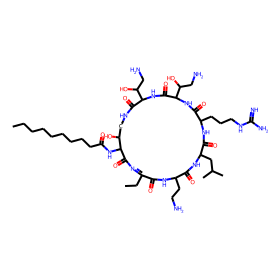

smiles:  CCC1=NC(=O)C(NC(=O)COc2ccc(/C=C/C(=O)OC(C)(C)C)cc2)C(O)CNC(=O)C(C(O)CN)NC(=O)C(C(O)CN)NC(=O)C(CCCNC(=N)N)NC(=O)C(CC(C)C)NC(=O)C(CCN)NC1=O
logD:  2.65
Jchem:  -13.03450012
ADMET:  -1.392
fpadmet:  0.495
prediction:  -0.748


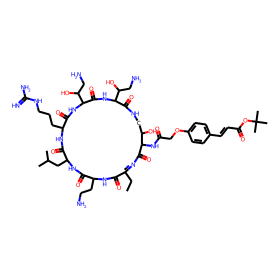

smiles:  COc1ncc(C2=CCOCC2)cc1S(=O)(=O)Nc1cncc(-c2ccc(CN3C[C@H](C)O[C@H](C)C3)cc2)c1
logD:  5.3
Jchem:  2.155008799
ADMET:  2.124
fpadmet:  2.296
prediction:  1.986


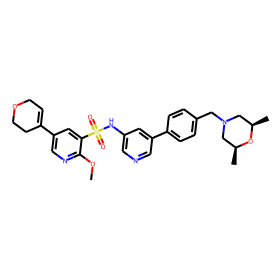

smiles:  CC[C@@H](NC(=O)C1C[C@H](NC(=O)COCCOCCOCCOCCOc2cc3nccc(Nc4ccc5scnc5c4)c3cc2S(=O)(=O)C(C)(C)C)CN1C(=O)C(NC(=O)C(C)NC)C(C)(C)C)c1ccccc1
logD:  5.6
Jchem:  2.957932904
ADMET:  3.346
fpadmet:  2.389
prediction:  2.7


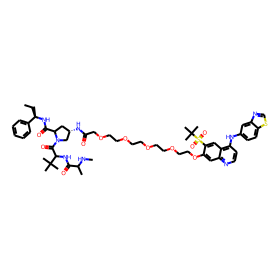

smiles:  CNC(C)C(=O)NC(C(=O)N1CCCC1c1nc(C(=O)c2ccc(F)cc2)cs1)C1CCN(C(=O)c2ccc(N3CCN(CCOc4cc5ncnc(Nc6[nH]nc(C)c6C)c5cc4S(=O)(=O)C(C)(C)C)CC3)nc2)CC1
logD:  0.55
Jchem:  3.853883273
ADMET:  3.222
fpadmet:  2.539
prediction:  2.758


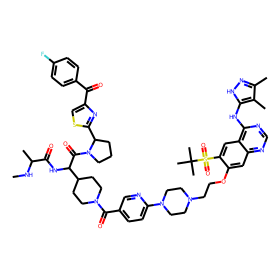

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cc(C(F)(F)F)cc(C(F)(F)F)c2)cc1
logD:  0.4
Jchem:  3.068606844
ADMET:  3.923
fpadmet:  2.188
prediction:  3.11


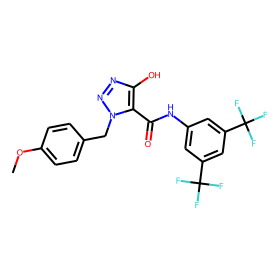

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2ccc(-c3ccccc3)cc2)cc1
logD:  0.47
Jchem:  2.960129279
ADMET:  3.814
fpadmet:  2.299
prediction:  3.574


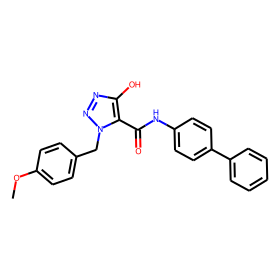

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(-c3ccccc3)c2)cc1
logD:  0.069
Jchem:  2.960131849
ADMET:  3.852
fpadmet:  2.306
prediction:  3.627


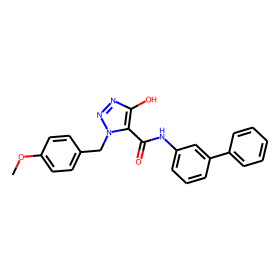

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(-c3ccc(O)cc3)c2)cc1
logD:  0.31
Jchem:  2.65510252
ADMET:  3.426
fpadmet:  2.176
prediction:  3.734


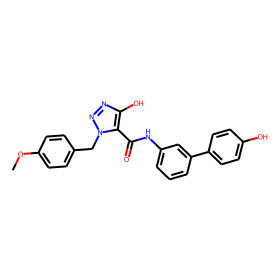

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(-c3cccc(O)c3)c2)cc1
logD:  0.21
Jchem:  2.654941375
ADMET:  3.495
fpadmet:  2.162
prediction:  3.67


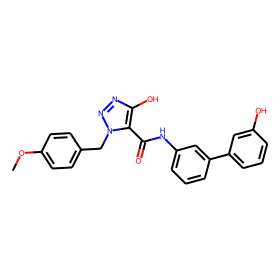

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(-c3ccc(OC)cc3)c2)cc1
logD:  0.22
Jchem:  2.802460576
ADMET:  3.678
fpadmet:  2.202
prediction:  3.851


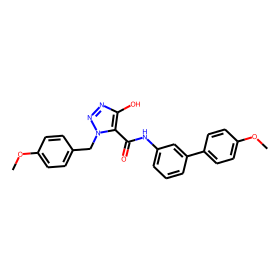

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(-c3cccc(OC)c3)c2)cc1
logD:  0.26
Jchem:  2.802460581
ADMET:  3.76
fpadmet:  2.186
prediction:  3.38


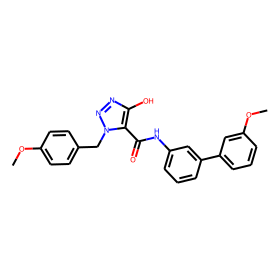

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2ccc(Oc3ccccc3)cc2)cc1
logD:  0.27
Jchem:  2.813185376
ADMET:  3.671
fpadmet:  2.19
prediction:  2.954


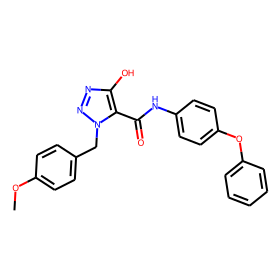

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(Oc3ccccc3)c2)cc1
logD:  0.11
Jchem:  2.813202494
ADMET:  3.676
fpadmet:  2.219
prediction:  2.874


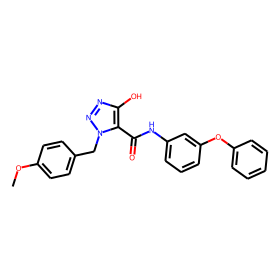

smiles:  N#Cc1ccc(OCC(O)CCNS(=O)(=O)c2ccc(Cl)cc2Cl)cc1F
logD:  5.2
Jchem:  3.057278334
ADMET:  3.165
fpadmet:  1.84
prediction:  3.734


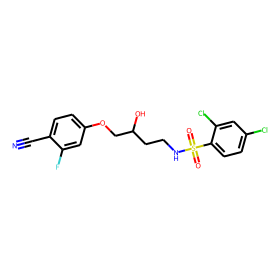

smiles:  CC1(C)C(=O)N(c2ccc(F)c(C(F)(F)F)c2)C(=O)N1S(C)(=O)=O
logD:  3.8
Jchem:  1.937141711
ADMET:  1.101
fpadmet:  1.634
prediction:  2.144


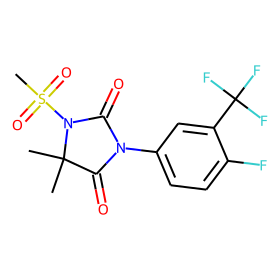

smiles:  N=C(N)NC(=O)c1nc(-c2ccc(C(F)(F)F)cc2)c(N)nc1N
logD:  2.8
Jchem:  1.502281452
ADMET:  0.699
fpadmet:  1.498
prediction:  2.539


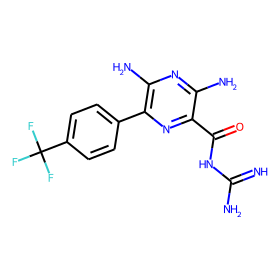

smiles:  CCCCC(=O)N(Cc1ccc(-c2ccccc2-c2nn[nH]n2)cc1)C(C(=O)O)C(C)C
logD:  -0.8
Jchem:  2.291843252
ADMET:  2.041
fpadmet:  0.594
prediction:  0.563


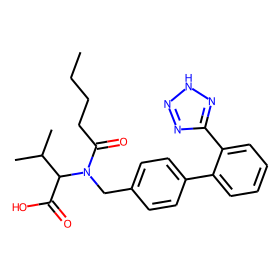

smiles:  CSCCC(NC(=O)C1CCCN1C(=O)CNC(=O)C(CCCCN)NC(=O)C(Cc1c[nH]cn1)NC(=O)C(CO)NC(=O)C(CC(C)C)NC(=O)C(CCCN=C(N)N)NC(=O)C1CCCN1C(=O)C(CCCNC(=N)N)NC(=O)C(CCC(N)=O)NC(=O)C(CCCNC(=N)N)NC(=O)C(CCCNC(=N)N)NC(=O)C(Cc1ccccc1)NC(=O)C(N)CCCCN)C(=O)N1CCCC1C(=O)NC(Cc1ccccc1)C(=O)O
logD:  -2.57
Jchem:  -25.15100046
ADMET:  -5.0
fpadmet:  -0.202
prediction:  -1.402


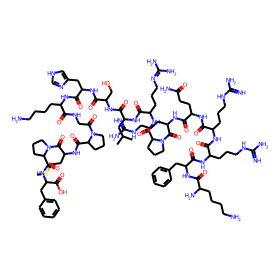

smiles:  COc1ccc(-c2c(C)nn3c(NCc4cccnc4)nc(C)nc23)cc1OC
logD:  4.5
Jchem:  2.814962928
ADMET:  2.478
fpadmet:  2.871
prediction:  2.866


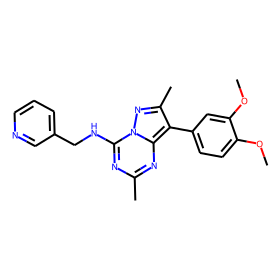

smiles:  COc1ccc(-c2c(C)nn3c(NCc4cccnc4)nc(C)cc23)cc1OC
logD:  5.5
Jchem:  2.562264515
ADMET:  2.694
fpadmet:  2.858
prediction:  3.506


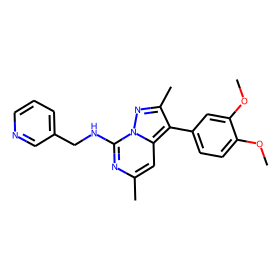

smiles:  COc1ccc(-c2c(C)nn3c(NCc4ccc(C(N)=O)cc4)nc(C)cc23)cc1OC
logD:  4.8
Jchem:  2.631590979
ADMET:  2.463
fpadmet:  2.815
prediction:  3.276


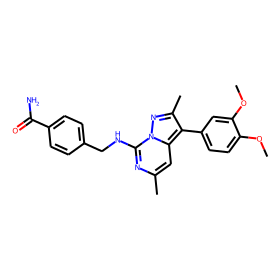

smiles:  Cn1cc(-c2[nH]nc3cc(Cl)c(N[C@@H]4CCNC4)cc23)cn1
logD:  0.32
Jchem:  -1.492886557
ADMET:  2.43
fpadmet:  2.087
prediction:  1.088


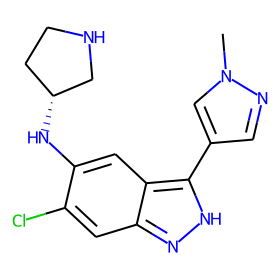

smiles:  COc1ccc(Cn2nnc(O)c2C(=O)Nc2cccc(C(F)(F)F)c2)cc1
logD:  0.31
Jchem:  2.190755245
ADMET:  3.586
fpadmet:  2.194
prediction:  2.38


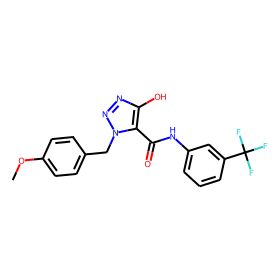

smiles:  N=C(N)NC(=O)c1nc(-c2cc3ccccc3s2)c(N2CCCCCC2)nc1N
logD:  5.3
Jchem:  3.795284484
ADMET:  2.365
fpadmet:  2.61
prediction:  4.553


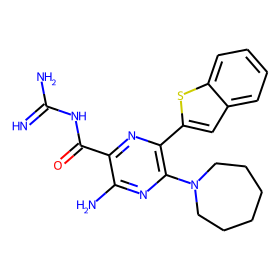

smiles:  COc1cc(F)c(C(C)C)cc1-c1ccc(C(F)(F)F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C)cc(C(F)(F)F)c3)OC(=O)N12
logD:  7.0
Jchem:  9.045258443
ADMET:  4.916
fpadmet:  3.02
prediction:  5.671


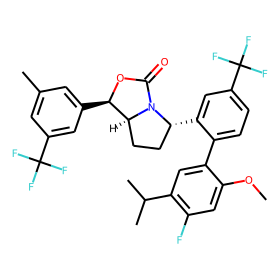

smiles:  COc1cc(F)c(C(C)C)cc1-c1ccc(F)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  7.0
Jchem:  8.67453899
ADMET:  4.817
fpadmet:  3.04
prediction:  5.84


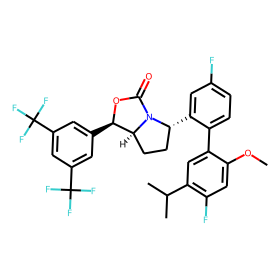

smiles:  COc1cc(F)c(C(C)C)cc1-c1cnc(N(C)C)cc1[C@@H]1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  7.0
Jchem:  8.006171247
ADMET:  4.455
fpadmet:  2.82
prediction:  5.059


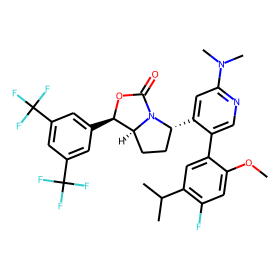

smiles:  COc1cc(F)c(C(C)C)cc1-c1ccc(N(C)C)nc1C1CC[C@H]2[C@@H](c3cc(C(F)(F)F)cc(C(F)(F)F)c3)OC(=O)N12
logD:  6.9
Jchem:  8.24909914
ADMET:  4.858
fpadmet:  2.84
prediction:  4.976


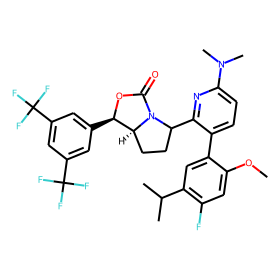

smiles:  COc1ccc(-c2c(C)nn3c(NCC4CCOCC4)nc(C)nc23)cc1OC
logD:  5.1
Jchem:  2.666424379
ADMET:  2.7
fpadmet:  2.8
prediction:  3.078


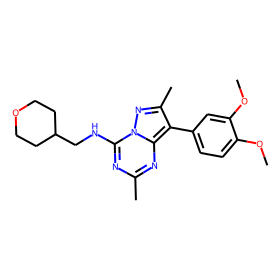

smiles:  N=C(N)NC(=O)c1nc(-c2ccco2)c(N2CCCCCC2)nc1N
logD:  4.3
Jchem:  1.923127837
ADMET:  0.923
fpadmet:  2.12
prediction:  3.672


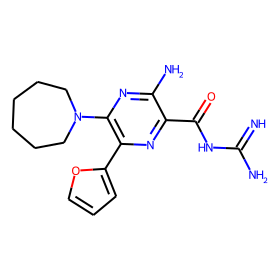

smiles:  CCCCc1nc(C)c(CC(=S)N(C)C)c(=O)n1Cc1ccc(-c2ccccc2-c2nn[nH]n2)cc1
logD:  0.9
Jchem:  4.973516584
ADMET:  3.567
fpadmet:  2.29
prediction:  1.766


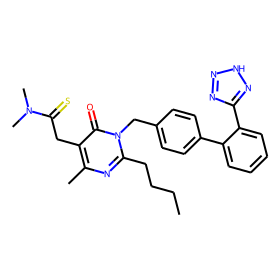

smiles:  COc1cc2c(cc1OCCCCCCCC(=O)O)C[C@@H](C(C)C)n1cc(C(=O)O)c(=O)cc1-2
logD:  0.07
Jchem:  -1.78278209
ADMET:  2.329
fpadmet:  1.29
prediction:  1.593


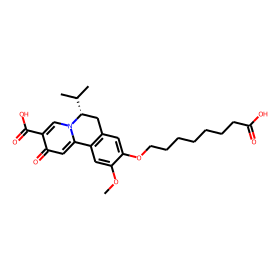

It took 472.7814s to complete the task


In [4]:
# -*- coding: utf-8 -*-
#
# Copyright Amazon.com, Inc. or its affiliates. All Rights Reserved.
# SPDX-License-Identifier: Apache-2.0
import time
import json
import pickle
import datetime
import pandas as pd
import numpy as np
import torch
import copy
from rdkit import Chem
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D
from IPython.display import SVG
from IPython.display import display
import matplotlib
import matplotlib.cm as cm
from matplotlib import pyplot as plt

import torch.nn as nn
from dgllife.utils import Meter, EarlyStopping
import sys
sys.path.append("..") 
from torch.utils.data import DataLoader
from utils import get_label_mean_and_std, collate, load_model
from utils import get_configure, mkdir_p, init_trial_path, \
    collate_molgraphs, load_model, predict, init_featurizer, load_dataset
from torch.nn.utils import clip_grad_norm
import os
os.environ['CUDA_VISIBLE_DEVICES']='3'
def log_model_evaluation(smiles_list,args, model, test_loader):
    dt = datetime.datetime.now()
    file_name='1test_result_{}_{:02d}-{:02d}-{:02d}.csv'.format(
                dt.date(), dt.hour, dt.minute, dt.second)
    with open(file_name, 'w') as f: 
        def _log_values(metric, test_values):
            f.write('{}\n'.format(metric))
            headline = '|            | averaged |'
            for t in args['task']:
                headline += ' {:15} |'.format(t)
            headline += '\n'
            f.write(headline)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            for name, values in {
                                    'Test': test_values}.items():
                row = '| {:10s} | {:8.3f} |'.format(name, np.mean(values))
                
                for t in range(len(args['task'])):
                    if len(args['task'])==1:
                        row += ' {:15.3f} |'.format(values)
                    else:
                        row += ' {:15.3f} |'.format(values[t])
                row += '\n'
                f.write(row)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            f.write('\n')
        test_r2,test_mae,test_rmse = run_an_eval_epoch(smiles_list,args, model, test_loader)
        _log_values('r2', test_r2)
        _log_values('mae',test_mae)
        _log_values('rmse', test_rmse)

def mol_with_atom_index( mol ):
    atoms = mol.GetNumAtoms()
    for idx in range( atoms ):
        mol.GetAtomWithIdx( idx ).SetProp( 'molAtomMapNumber', str( mol.GetAtomWithIdx( idx ).GetIdx() ) )
    return mol

def draw(atom_weights,smiles,bg,logD,prediction,Jchem,fpadmet,ADMET):
    # print("JCHEM: ",Jchem)
    # print("LogD: ",logD)
    min_value = torch.min(atom_weights)
    max_value = torch.max(atom_weights)
    atom_weights = (atom_weights - min_value) / (max_value - min_value)

    norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
    cmap = cm.get_cmap('bwr')
    try:
   #     if((abs(prediction[0][0].item()-logD)>1)&(Jchem-logD>1)&(fpadmet-logD>1)&(ADMET-logD)>1):
        if((abs(Jchem-logD)>1)&(abs(fpadmet-logD)>1)&(abs(ADMET-logD)>2)):
            plt_colors = cm.ScalarMappable(norm=norm, cmap=cmap)
            atom_colors = {i: plt_colors.to_rgba(atom_weights[i].data.item()) for i in range(bg.number_of_nodes())}
        # print("atom_colors: ",atom_colors)
            mol = Chem.MolFromSmiles(smiles[0])
            rdDepictor.Compute2DCoords(mol)
            drawer = rdMolDraw2D.MolDraw2DSVG(280, 280)
            drawer.SetFontSize(1)
            op = drawer.drawOptions()
        #    mol_with_atom_index(mol=mol)
            mol = rdMolDraw2D.PrepareMolForDrawing(mol)
            drawer.DrawMolecule(mol)
                                # , highlightAtoms=range(bg.number_of_nodes()),
                                #     highlightBonds=[],
                                #     highlightAtomColors=atom_colors)
            drawer.FinishDrawing()
            
            svg = drawer.GetDrawingText()
            svg = svg.replace('svg:', '')
            print("smiles: ",smiles[0])
            print("logD: ",logD)
            print("Jchem: ",Jchem)
            print("ADMET: ",ADMET)
            print("fpadmet: ",fpadmet)
            print("prediction: ",round(prediction[0][0].item(),3))
        #  plt.colorbar()
            display(SVG(svg))
    except:
        print("problem smiles: ",smiles[0])
        print("\n")
        a=Chem.MolFromSmiles(smiles[0])
        display(a)
        


def run_an_eval_epoch(smiles_list,args, model, data_loader,logD,Jchem,fpadmet,ADMET):
    model.eval()
    eval_meter = Meter(args['train_mean'], args['train_std'])
    predictions = []
    i=0
    with torch.no_grad():
        for _, batch_data in enumerate(data_loader):
            smiles, bg, labels, masks = batch_data
            # print("bg: ",bg)
            prediction,weight = predict(args, model, bg)
            atom_weights = weight[0]
            # print("atom_weights: ",atom_weights)
            
            prediction = prediction.detach().cpu() * args['train_std'].cpu()+args['train_mean'].cpu()
            draw(atom_weights,smiles,bg,logD[i],prediction,Jchem[i],fpadmet[i],ADMET[i])
            eval_meter.update(prediction, labels, masks)
            predictions.append(prediction)
            i=i+1
        predictions = torch.cat(predictions, dim=0)

        output_data = {'canonical_smiles': smiles_list}
        if args['task'] is None:
            args['task'] = ['task_{:d}'.format(t) for t in range(1, args['n_tasks'] + 1)]
        else:
            pass
            #args['task'] = args['task'].split(',')
        for task_id, task_name in enumerate(args['task']):
            output_data[task_name] = predictions[:, task_id]
        df = pd.DataFrame(output_data)
        # df.to_csv('./pretrain_76_small_similarity_new.csv', index=False)
        out=pd.read_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/media_similarity_results.csv")
        out['new_new_pretrain_76']=df['standard_value']
        out.to_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/media_similarity_results.csv",index=False)


def main(smiles_list,args, exp_config, test_set,logD,Jchem,fpadmet,ADMET):
    # Record settings
    exp_config.update({
        'model': args['model'],
        'mode':args['mode'],
        'n_tasks': args['n_tasks'],
        'atom_featurizer_type': args['atom_featurizer_type'],
        'bond_featurizer_type': args['bond_featurizer_type']
    })
    if args['atom_featurizer_type'] != 'pre_train':
        exp_config['in_node_feats'] = args['node_featurizer'].feat_size()+2
    if args['edge_featurizer'] is not None and args['bond_featurizer_type'] != 'pre_train':
        exp_config['in_edge_feats'] = args['edge_featurizer'].feat_size()

    # Set up directory for saving results
    t0 = time.time()
  
    test_loader = DataLoader(dataset=test_set, batch_size=1,#exp_config['batch_size'],
                             collate_fn=collate_molgraphs, num_workers=args['num_workers'])
    model = load_model(exp_config).to(args['device'])
    #checkpoint = torch.load('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/model_pretrain_76.pth', map_location='cpu')
    path='/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/my_model/new_pretrain_76/model_pretrain_76.pth'
    checkpoint=torch.load(path,map_location='cpu')
    model.load_state_dict(checkpoint)#['model_state_dict'])

    run_an_eval_epoch(smiles_list,args, model, test_loader,logD,Jchem,fpadmet,ADMET)

    print('It took {:.4f}s to complete the task'.format(time.time() - t0))

   
if __name__ == '__main__':
    from argparse import ArgumentParser
    from argparse import ArgumentParser
    from dgllife.data import MoleculeCSVDataset
    from dgllife.utils import smiles_to_bigraph, RandomSplitter
    import torch
   # from configure import configs
  #  from run import main
    from utils import mkdir_p, setup
    # reload a file to a variable
    # with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_no_pretrain_76_norm_new/3/args.pickle', 'rb') as file:
    #     args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/args.pickle', 'rb') as file:
        args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/configure.json', 'r') as f:
        exp_config = json.load(f)
    if torch.cuda.is_available():
        args['device'] = torch.device('cuda:0')
    else:
        args['device'] = torch.device('cpu')
    args = setup(args)
    test_set = pd.read_csv('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/all_external_test_with_logp.csv')
    Jchem=test_set['Jchem']
    fpadmet=test_set['fpadmet']
    ADMET=test_set['ADMET_lab2.0']
    
    logD=test_set['standard_value']
    test_set['logp']=np.nan
    smiles_list=test_set['smiles'].to_list()
    test_set = load_dataset(args,test_set,"test")
    exp_config = get_configure(args['model'],"test")
    main(smiles_list,args, exp_config,test_set,logD,Jchem,fpadmet,ADMET)

In [ ]:
from rdkit.Chem import AllChem
from rdkit import Chem
ECFP_list = []
for smiles in smiles_lis:
    mol = Chem.MolFromSmiles(smiles)
    fp = AllChem.GetMorganFingerprintAsBitVect(mol,2,2048)
    fp = [int(i) for i in fp]
    ECFP_list.append(fp)

In [ ]:
columns=['ECFP_4_'+str(i) for i in range(1,2049)]
df_ECFP = pd.DataFrame(ECFP_list, columns=columns) 
df = pd.concat([train,df_ECFP],axis= 1)

In [ ]:
df.head(10)

In [ ]:
df.to_csv('./scaffold_test_ECFP.csv',index = False)

In [ ]:
import xgboost

In [ ]:
import numpy as np
import pandas as pd
import pickle
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor
from math import sqrt   
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df_train=pd.read_csv("scaffold_train_ECFP.csv")
df_valid=pd.read_csv("scaffold_valid_ECFP.csv")
df_test=pd.read_csv("scaffold_test_ECFP.csv")

In [ ]:
ECFP4_column_lis = [i for i in df_train.columns if 'ECFP_4' in i]

In [ ]:
X_train = np.array(df_train[ECFP4_column_lis])
X_val = np.array(df_valid[ECFP4_column_lis])
X_test = np.array(df_test[ECFP4_column_lis])
y_train = np.array(df_train['standard_value'])
y_val = np.array(df_valid['standard_value'])
y_test = np.array(df_test['standard_value'])

In [ ]:
n_estimator_list = [5,10,15,20,25,30,40,50,70,100,150,300]
max_depth_list = [3,5,7,10,15,20,None]

result_acc_lis = []
log_lis = []

for n_estimator in n_estimator_list:
    result_MAE = []
    result_RMSE = []
    result_R2 = []
    for max_depth in max_depth_list:  
        print('n_estimator: '+ str(n_estimator))
        print('max_depth: '+ str(max_depth))
        print('')
        model = RandomForestRegressor(n_estimators = n_estimator,max_depth=max_depth,n_jobs=-1)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)
        MAE = mean_absolute_error(y_val,y_pred)
        RMSE = sqrt(mean_squared_error(y_val,y_pred))
        R2 = r2_score(y_val,y_pred)
        result_MAE.append(MAE)
        result_RMSE.append(RMSE)
        result_R2.append(R2)
        log_lis.append('n_estimator = {}, max_depth = {}, mae = {}'.format(n_estimator,max_depth,MAE))
    
    
    

In [ ]:
n_estimator_list = [5,10,15,20,25,30,40,50,70,100,150,300]
max_depth_list = [3,5,7,10,15,20,None]

log_lis = []
result_MAE = []
result_RMSE = []
result_R2 = []
for n_estimator in n_estimator_list:

    for max_depth in max_depth_list:  
        print('n_estimator: '+ str(n_estimator))
        print('max_depth: '+ str(max_depth))
        print('')
        model = RandomForestRegressor(n_estimators = n_estimator,max_depth=max_depth)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)
        MAE = mean_absolute_error(y_val,y_pred)
        RMSE = sqrt(mean_squared_error(y_val,y_pred))
        R2 = r2_score(y_val,y_pred)
        result_MAE.append(MAE)
        result_RMSE.append(RMSE)
        result_R2.append(R2)
        log_lis.append('n_estimator = {}, max_depth = {}, mae = {}'.format(n_estimator,max_depth,MAE))
    
    
    

In [ ]:
sns.set()
np.random.seed(0)
uniform_data = np.array(result_MAE)
f, ax = plt.subplots(figsize=(6.5, 6))
ax = sns.heatmap(uniform_data,cmap='YlGnBu',annot=True, linewidths=.5,xticklabels = [3,5,7,10,15,20,25,'None'],yticklabels =[5,10,15,20,25,30,50,70,100,200,300,500],vmin = 0.56, vmax = 0.86)
plt.xticks()
plt.xticks()
plt.xlabel('max_depth')
plt.ylabel('n_estimator')
plt.show()

In [ ]:
from matplotlib import pyplot as plt
import matplotlib as mpl
import numpy as np
def colorbar():
    fig, ax = plt.subplots(figsize=(6, 1))
    fig.subplots_adjust(bottom=0.5)

    norm = mpl.colors.Normalize(vmin=0, vmax=1)
    
    ax.tick_params(labelsize=16)  #设置色标刻度字体大小。
    
    fig.colorbar(
        mpl.cm.ScalarMappable(norm=norm, cmap="bwr"),
        cax=ax,
        orientation="horizontal",
    )

colorbar()

In [ ]:
# -*- coding: utf-8 -*-
#
# Copyright Amazon.com, Inc. or its affiliates. All Rights Reserved.
# SPDX-License-Identifier: Apache-2.0
import time
import json
import pickle
import datetime
import pandas as pd
import numpy as np
import torch
import copy
from rdkit import Chem
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D
from IPython.display import SVG
from IPython.display import display
import matplotlib
import matplotlib.cm as cm
from matplotlib import pyplot as plt

import torch.nn as nn
from dgllife.utils import Meter, EarlyStopping
import sys
sys.path.append("..") 
from torch.utils.data import DataLoader
from utils import get_label_mean_and_std, collate, load_model
from utils import get_configure, mkdir_p, init_trial_path, \
    collate_molgraphs, load_model, predict, init_featurizer, load_dataset
from torch.nn.utils import clip_grad_norm
import os
os.environ['CUDA_VISIBLE_DEVICES']='1'
def log_model_evaluation(smiles_list,args, model, test_loader):
    dt = datetime.datetime.now()
    file_name='1test_result_{}_{:02d}-{:02d}-{:02d}.csv'.format(
                dt.date(), dt.hour, dt.minute, dt.second)
    with open(file_name, 'w') as f: 
        def _log_values(metric, test_values):
            f.write('{}\n'.format(metric))
            headline = '|            | averaged |'
            for t in args['task']:
                headline += ' {:15} |'.format(t)
            headline += '\n'
            f.write(headline)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            for name, values in {
                                    'Test': test_values}.items():
                row = '| {:10s} | {:8.3f} |'.format(name, np.mean(values))
                
                for t in range(len(args['task'])):
                    if len(args['task'])==1:
                        row += ' {:15.3f} |'.format(values)
                    else:
                        row += ' {:15.3f} |'.format(values[t])
                row += '\n'
                f.write(row)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            f.write('\n')
        test_r2,test_mae,test_rmse = run_an_eval_epoch(smiles_list,args, model, test_loader)
        _log_values('r2', test_r2)
        _log_values('mae',test_mae)
        _log_values('rmse', test_rmse)

def mol_with_atom_index( mol ):
    atoms = mol.GetNumAtoms()
    for idx in range( atoms ):
        mol.GetAtomWithIdx( idx ).SetProp( 'molAtomMapNumber', str( mol.GetAtomWithIdx( idx ).GetIdx() ) )
    return mol

def draw(atom_weights,smiles,bg,logD,prediction):

    min_value = torch.min(atom_weights)
    max_value = torch.max(atom_weights)
    atom_weights = (atom_weights - min_value) / (max_value - min_value)

    norm = matplotlib.colors.Normalize(vmin=0, vmax=1.28)
    cmap = cm.get_cmap('bwr')
    if(abs(prediction[0][0].item()-logD)>1):
        try:
            plt_colors = cm.ScalarMappable(norm=norm, cmap=cmap)
            atom_colors = {i: plt_colors.to_rgba(atom_weights[i].data.item()) for i in range(bg.number_of_nodes())}
        # print("atom_colors: ",atom_colors)
            mol = Chem.MolFromSmiles(smiles[0])
            rdDepictor.Compute2DCoords(mol)
            drawer = rdMolDraw2D.MolDraw2DSVG(280, 280)
            drawer.SetFontSize(1)
            op = drawer.drawOptions()
        #    mol_with_atom_index(mol=mol)
            mol = rdMolDraw2D.PrepareMolForDrawing(mol)
            drawer.DrawMolecule(mol, highlightAtoms=range(bg.number_of_nodes()),
                                    highlightBonds=[],
                                    highlightAtomColors=atom_colors)
            drawer.FinishDrawing()
            svg = drawer.GetDrawingText()
            svg = svg.replace('svg:', '')
            print("smiles: ",smiles[0])
            print("logD: ",logD)
            print("prediction: ",round(prediction[0][0].item(),3))
            plt.colorbar()
            display(SVG(svg))
        except:
            print("problem smiles: ",smiles[0])
            print("\n")
            a=Chem.MolFromSmiles(smiles[0])
            display(a)
            


def run_an_eval_epoch(smiles_list,args, model, data_loader,logD):
    model.eval()
    eval_meter = Meter(args['train_mean'], args['train_std'])
    predictions = []
    i=0
    with torch.no_grad():
        for _, batch_data in enumerate(data_loader):
            smiles, bg, labels, masks = batch_data
            # print("bg: ",bg)
            prediction,weight = predict(args, model, bg)
            atom_weights = weight[0]
            # print("atom_weights: ",atom_weights)
            
            prediction = prediction.detach().cpu() * args['train_std'].cpu()+args['train_mean'].cpu()
            draw(atom_weights,smiles,bg,logD[i],prediction)
            eval_meter.update(prediction, labels, masks)
            predictions.append(prediction)
            i=i+1
        predictions = torch.cat(predictions, dim=0)

        output_data = {'canonical_smiles': smiles_list}
        if args['task'] is None:
            args['task'] = ['task_{:d}'.format(t) for t in range(1, args['n_tasks'] + 1)]
        else:
            pass
            #args['task'] = args['task'].split(',')
        for task_id, task_name in enumerate(args['task']):
            output_data[task_name] = predictions[:, task_id]
        # df = pd.DataFrame(output_data)
        # # df.to_csv('./pretrain_76_small_similarity_new.csv', index=False)
        # out=pd.read_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/all_external_test_with_logp.csv")
        # out['new_new_pretrain_76']=df['standard_value']
        # out.to_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/media_similarity_results.csv",index=False)


def main(smiles_list,args, exp_config, test_set,logD):
    # Record settings
    exp_config.update({
        'model': args['model'],
        'mode':args['mode'],
        'n_tasks': args['n_tasks'],
        'atom_featurizer_type': args['atom_featurizer_type'],
        'bond_featurizer_type': args['bond_featurizer_type']
    })
    if args['atom_featurizer_type'] != 'pre_train':
        exp_config['in_node_feats'] = args['node_featurizer'].feat_size()+2
    if args['edge_featurizer'] is not None and args['bond_featurizer_type'] != 'pre_train':
        exp_config['in_edge_feats'] = args['edge_featurizer'].feat_size()

    # Set up directory for saving results
    t0 = time.time()
  
    test_loader = DataLoader(dataset=test_set, batch_size=1,#exp_config['batch_size'],
                             collate_fn=collate_molgraphs, num_workers=args['num_workers'])
    model = load_model(exp_config).to(args['device'])
    #checkpoint = torch.load('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/model_pretrain_76.pth', map_location='cpu')
    path='/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/my_model/new_pretrain_76/model_pretrain_76.pth'
    checkpoint=torch.load(path,map_location='cpu')
    model.load_state_dict(checkpoint)#['model_state_dict'])

    run_an_eval_epoch(smiles_list,args, model, test_loader,logD)

    print('It took {:.4f}s to complete the task'.format(time.time() - t0))

   
if __name__ == '__main__':
    from argparse import ArgumentParser
    from argparse import ArgumentParser
    from dgllife.data import MoleculeCSVDataset
    from dgllife.utils import smiles_to_bigraph, RandomSplitter
    import torch
   # from configure import configs
  #  from run import main
    from utils import mkdir_p, setup
    # reload a file to a variable
    # with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_no_pretrain_76_norm_new/3/args.pickle', 'rb') as file:
    #     args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/args.pickle', 'rb') as file:
        args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/configure.json', 'r') as f:
        exp_config = json.load(f)
    if torch.cuda.is_available():
        args['device'] = torch.device('cuda:0')
    else:
        args['device'] = torch.device('cpu')
    args = setup(args)
    test_set = pd.read_csv('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/all_external_test_with_logp.csv')
    logD=test_set['standard_value']
    smiles_list=test_set['smiles'].to_list()
    test_set = load_dataset(args,test_set,"test")
    exp_config = get_configure(args['model'],"test")
    main(smiles_list,args, exp_config,test_set,logD)

In [ ]:
# -*- coding: utf-8 -*-
#
# Copyright Amazon.com, Inc. or its affiliates. All Rights Reserved.
# SPDX-License-Identifier: Apache-2.0
import time
import json
import pickle
import datetime
import pandas as pd
import numpy as np
import torch
import copy
from rdkit import Chem
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D
from IPython.display import SVG
from IPython.display import display
import matplotlib
import matplotlib.cm as cm
import torch.nn as nn
from dgllife.utils import Meter, EarlyStopping
import sys
sys.path.append("..") 
from torch.utils.data import DataLoader
from utils import get_label_mean_and_std, collate, load_model
from utils import get_configure, mkdir_p, init_trial_path, \
    collate_molgraphs, load_model, predict, init_featurizer, load_dataset
from torch.nn.utils import clip_grad_norm
import os
os.environ['CUDA_VISIBLE_DEVICES']='1'
def log_model_evaluation(smiles_list,args, model, test_loader):
    dt = datetime.datetime.now()
    file_name='1test_result_{}_{:02d}-{:02d}-{:02d}.csv'.format(
                dt.date(), dt.hour, dt.minute, dt.second)
    with open(file_name, 'w') as f: 
        def _log_values(metric, test_values):
            f.write('{}\n'.format(metric))
            headline = '|            | averaged |'
            for t in args['task']:
                headline += ' {:15} |'.format(t)
            headline += '\n'
            f.write(headline)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            for name, values in {
                                    'Test': test_values}.items():
                row = '| {:10s} | {:8.3f} |'.format(name, np.mean(values))
                
                for t in range(len(args['task'])):
                    if len(args['task'])==1:
                        row += ' {:15.3f} |'.format(values)
                    else:
                        row += ' {:15.3f} |'.format(values[t])
                row += '\n'
                f.write(row)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            f.write('\n')
        test_r2,test_mae,test_rmse = run_an_eval_epoch(smiles_list,args, model, test_loader)
        _log_values('r2', test_r2)
        _log_values('mae',test_mae)
        _log_values('rmse', test_rmse)

def mol_with_atom_index( mol ):
    atoms = mol.GetNumAtoms()
    for idx in range( atoms ):
        mol.GetAtomWithIdx( idx ).SetProp( 'molAtomMapNumber', str( mol.GetAtomWithIdx( idx ).GetIdx() ) )
    return mol

def draw(atom_weights,smiles,bg,logD,prediction):

    min_value = torch.min(atom_weights)
    max_value = torch.max(atom_weights)
    atom_weights = (atom_weights - min_value) / (max_value - min_value)

    norm = matplotlib.colors.Normalize(vmin=0, vmax=1.28)
    cmap = cm.get_cmap('bwr')
    try:
        plt_colors = cm.ScalarMappable(norm=norm, cmap=cmap)
        atom_colors = {i: plt_colors.to_rgba(atom_weights[i].data.item()) for i in range(bg.number_of_nodes())}
       # print("atom_colors: ",atom_colors)
        mol = Chem.MolFromSmiles(smiles[0])
        rdDepictor.Compute2DCoords(mol)
        drawer = rdMolDraw2D.MolDraw2DSVG(280, 280)
        drawer.SetFontSize(1)
        op = drawer.drawOptions()
    #    mol_with_atom_index(mol=mol)
        mol = rdMolDraw2D.PrepareMolForDrawing(mol)
        drawer.DrawMolecule(mol, highlightAtoms=range(bg.number_of_nodes()),
                                highlightBonds=[],
                                highlightAtomColors=atom_colors)
        drawer.FinishDrawing()
        svg = drawer.GetDrawingText()
        svg = svg.replace('svg:', '')
        print("smiles: ",smiles[0])
        print("logD: ",logD)
        print("prediction: ",round(prediction[0][0].item(),3))
        display(SVG(svg))
    except:
        print("problem smiles: ",smiles[0])
        print("\n")
        a=Chem.MolFromSmiles(smiles[0])
        display(a)
        


def run_an_eval_epoch(smiles_list,args, model, data_loader,logD):
    model.eval()
    eval_meter = Meter(args['train_mean'], args['train_std'])
    predictions = []
    i=0
    with torch.no_grad():
        for _, batch_data in enumerate(data_loader):
            smiles, bg, labels, masks = batch_data
            # print("bg: ",bg)
            prediction,weight = predict(args, model, bg)
            atom_weights = weight[0]
            # print("atom_weights: ",atom_weights)
            
            prediction = prediction.detach().cpu() * args['train_std'].cpu()+args['train_mean'].cpu()
            draw(atom_weights,smiles,bg,logD[i],prediction)
            eval_meter.update(prediction, labels, masks)
            predictions.append(prediction)
            i=i+1
        predictions = torch.cat(predictions, dim=0)

        output_data = {'canonical_smiles': smiles_list}
        if args['task'] is None:
            args['task'] = ['task_{:d}'.format(t) for t in range(1, args['n_tasks'] + 1)]
        else:
            pass
            #args['task'] = args['task'].split(',')
        for task_id, task_name in enumerate(args['task']):
            output_data[task_name] = predictions[:, task_id]
        df = pd.DataFrame(output_data)
        # df.to_csv('./pretrain_76_small_similarity_new.csv', index=False)
        out=pd.read_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/media_similarity_results.csv")
        out['new_new_pretrain_76']=df['standard_value']
        out.to_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/media_similarity_results.csv",index=False)


def main(smiles_list,args, exp_config, test_set,logD):
    # Record settings
    exp_config.update({
        'model': args['model'],
        'mode':args['mode'],
        'n_tasks': args['n_tasks'],
        'atom_featurizer_type': args['atom_featurizer_type'],
        'bond_featurizer_type': args['bond_featurizer_type']
    })
    if args['atom_featurizer_type'] != 'pre_train':
        exp_config['in_node_feats'] = args['node_featurizer'].feat_size()+2
    if args['edge_featurizer'] is not None and args['bond_featurizer_type'] != 'pre_train':
        exp_config['in_edge_feats'] = args['edge_featurizer'].feat_size()

    # Set up directory for saving results
    t0 = time.time()
  
    test_loader = DataLoader(dataset=test_set, batch_size=1,#exp_config['batch_size'],
                             collate_fn=collate_molgraphs, num_workers=args['num_workers'])
    model = load_model(exp_config).to(args['device'])
    #checkpoint = torch.load('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/model_pretrain_76.pth', map_location='cpu')
    path='/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76/8/model_pretrain_76.pth'
    checkpoint=torch.load(path,map_location='cpu')
    model.load_state_dict(checkpoint)#['model_state_dict'])

    run_an_eval_epoch(smiles_list,args, model, test_loader,logD)

    print('It took {:.4f}s to complete the task'.format(time.time() - t0))

   
if __name__ == '__main__':
    from argparse import ArgumentParser
    from argparse import ArgumentParser
    from dgllife.data import MoleculeCSVDataset
    from dgllife.utils import smiles_to_bigraph, RandomSplitter
    import torch
   # from configure import configs
  #  from run import main
    from utils import mkdir_p, setup
    # reload a file to a variable
    # with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_no_pretrain_76_norm_new/3/args.pickle', 'rb') as file:
    #     args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/args.pickle', 'rb') as file:
        args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_76_norm_new_again_lr0.5_scaffold/4/configure.json', 'r') as f:
        exp_config = json.load(f)
    if torch.cuda.is_available():
        args['device'] = torch.device('cuda:0')
    else:
        args['device'] = torch.device('cpu')
    args = setup(args)
    test_set = pd.read_csv('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/best_new_pretrain_three_weight_parallel_scaffold_new/new_large_similarity2.csv')
    logD=test_set['standard_value']
    smiles_list=test_set['smiles'].to_list()
    test_set = load_dataset(args,test_set,"test")
    exp_config = get_configure(args['model'],"test")
    main(smiles_list,args, exp_config,test_set,logD)

In [ ]:
# -*- coding: utf-8 -*-
#
# Copyright Amazon.com, Inc. or its affiliates. All Rights Reserved.
# SPDX-License-Identifier: Apache-2.0
import time
import json
import pickle
import datetime
import pandas as pd
import numpy as np
import torch
import copy
from rdkit import Chem
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D
from IPython.display import SVG
from IPython.display import display
import matplotlib
import matplotlib.cm as cm
import torch.nn as nn
from dgllife.utils import Meter, EarlyStopping
import sys
sys.path.append("..") 
from torch.utils.data import DataLoader
from utils import get_label_mean_and_std, collate, load_model
from utils import get_configure, mkdir_p, init_trial_path, \
    collate_molgraphs, load_model, predict, init_featurizer, load_dataset
from torch.nn.utils import clip_grad_norm
import os
os.environ['CUDA_VISIBLE_DEVICES']='1'
def log_model_evaluation(smiles_list,args, model, test_loader):
    dt = datetime.datetime.now()
    file_name='1test_result_{}_{:02d}-{:02d}-{:02d}.csv'.format(
                dt.date(), dt.hour, dt.minute, dt.second)
    with open(file_name, 'w') as f: 
        def _log_values(metric, test_values):
            f.write('{}\n'.format(metric))
            headline = '|            | averaged |'
            for t in args['task']:
                headline += ' {:15} |'.format(t)
            headline += '\n'
            f.write(headline)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            for name, values in {
                                    'Test': test_values}.items():
                row = '| {:10s} | {:8.3f} |'.format(name, np.mean(values))
                
                for t in range(len(args['task'])):
                    if len(args['task'])==1:
                        row += ' {:15.3f} |'.format(values)
                    else:
                        row += ' {:15.3f} |'.format(values[t])
                row += '\n'
                f.write(row)
            f.write('| ' + '-' * (len(headline) - 5) + ' |\n')
            f.write('\n')
        test_r2,test_mae,test_rmse = run_an_eval_epoch(smiles_list,args, model, test_loader)
        _log_values('r2', test_r2)
        _log_values('mae',test_mae)
        _log_values('rmse', test_rmse)

def mol_with_atom_index( mol ):
    atoms = mol.GetNumAtoms()
    for idx in range( atoms ):
        mol.GetAtomWithIdx( idx ).SetProp( 'molAtomMapNumber', str( mol.GetAtomWithIdx( idx ).GetIdx() ) )
    return mol

def draw(atom_weights,smiles,bg,logD,prediction):

    min_value = torch.min(atom_weights)
    max_value = torch.max(atom_weights)
    atom_weights = (atom_weights - min_value) / (max_value - min_value)

    norm = matplotlib.colors.Normalize(vmin=0, vmax=1.28)
    cmap = cm.get_cmap('bwr')
    try:
        plt_colors = cm.ScalarMappable(norm=norm, cmap=cmap)
        atom_colors = {i: plt_colors.to_rgba(atom_weights[i].data.item()) for i in range(bg.number_of_nodes())}
       # print("atom_colors: ",atom_colors)
        mol = Chem.MolFromSmiles(smiles[0])
        rdDepictor.Compute2DCoords(mol)
        drawer = rdMolDraw2D.MolDraw2DSVG(280, 280)
        drawer.SetFontSize(1)
        op = drawer.drawOptions()
    #    mol_with_atom_index(mol=mol)
        mol = rdMolDraw2D.PrepareMolForDrawing(mol)
        drawer.DrawMolecule(mol, highlightAtoms=range(bg.number_of_nodes()),
                                highlightBonds=[],
                                highlightAtomColors=atom_colors)
        drawer.FinishDrawing()
        svg = drawer.GetDrawingText()
        svg = svg.replace('svg:', '')
        print("smiles: ",smiles[0])
        print("logD: ",logD)
        print("prediction: ",round(prediction[0][0].item(),3))
        display(SVG(svg))
    except:
        print("problem smiles: ",smiles[0])
        print("\n")
        a=Chem.MolFromSmiles(smiles[0])
        display(a)
        


def run_an_eval_epoch(smiles_list,args, model, data_loader,logD):
    model.eval()
    eval_meter = Meter(args['train_mean'], args['train_std'])
    predictions = []
    i=0
    with torch.no_grad():
        for _, batch_data in enumerate(data_loader):
            smiles, bg, labels, masks = batch_data
            # print("bg: ",bg)
            prediction,weight = predict(args, model, bg)
            atom_weights = weight[0]
            # print("atom_weights: ",atom_weights)
            
            prediction = prediction.detach().cpu() * args['train_std'].cpu()+args['train_mean'].cpu()
            draw(atom_weights,smiles,bg,logD[i],prediction)
            eval_meter.update(prediction, labels, masks)
            predictions.append(prediction)
            i=i+1
        predictions = torch.cat(predictions, dim=0)

        output_data = {'canonical_smiles': smiles_list}
        if args['task'] is None:
            args['task'] = ['task_{:d}'.format(t) for t in range(1, args['n_tasks'] + 1)]
        else:
            pass
            #args['task'] = args['task'].split(',')
        for task_id, task_name in enumerate(args['task']):
            output_data[task_name] = predictions[:, task_id]
        df = pd.DataFrame(output_data)
        # df.to_csv('./pretrain_76_small_similarity_new.csv', index=False)
        out=pd.read_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/media_similarity_results.csv")
        out['new_new_pretrain_76']=df['standard_value']
        out.to_csv("/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/media_similarity_results.csv",index=False)


def main(smiles_list,args, exp_config, test_set,logD):
    # Record settings
    exp_config.update({
        'model': args['model'],
        'mode':args['mode'],
        'n_tasks': args['n_tasks'],
        'atom_featurizer_type': args['atom_featurizer_type'],
        'bond_featurizer_type': args['bond_featurizer_type']
    })
    if args['atom_featurizer_type'] != 'pre_train':
        exp_config['in_node_feats'] = args['node_featurizer'].feat_size()
    if args['edge_featurizer'] is not None and args['bond_featurizer_type'] != 'pre_train':
        exp_config['in_edge_feats'] = args['edge_featurizer'].feat_size()

    # Set up directory for saving results
    t0 = time.time()
  
    test_loader = DataLoader(dataset=test_set, batch_size=1,#exp_config['batch_size'],
                             collate_fn=collate_molgraphs, num_workers=args['num_workers'])
    model = load_model(exp_config).to(args['device'])
    checkpoint = torch.load('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_74_norm_new_lr0.25/3/pretrain_74.pth', map_location='cpu')
    path='/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_74_norm_new_lr0.25/3/pretrain_74.pth'
    model.load_state_dict(checkpoint)#['model_state_dict'])

    run_an_eval_epoch(smiles_list,args, model, test_loader,logD)

    print('It took {:.4f}s to complete the task'.format(time.time() - t0))

   
if __name__ == '__main__':
    from argparse import ArgumentParser
    from argparse import ArgumentParser
    from dgllife.data import MoleculeCSVDataset
    from dgllife.utils import smiles_to_bigraph, RandomSplitter
    import torch
   # from configure import configs
  #  from run import main
    from utils import mkdir_p, setup
    # reload a file to a variable
    # with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_no_pretrain_76_norm_new/3/args.pickle', 'rb') as file:
    #     args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_74_norm_new_lr0.25/3/args.pickle', 'rb') as file:
        args =pickle.load(file)
    with open('/home/wangyitian/dgl-lifesci/examples/property_prediction/csv_data_configuration/new_filter_scaffold_logp_logd_all_chembl29_pretrain_74_norm_new_lr0.25/3/configure.json', 'r') as f:
        exp_config = json.load(f)
    if torch.cuda.is_available():
        args['device'] = torch.device('cuda:0')
    else:
        args['device'] = torch.device('cpu')
    args = setup(args)
    test_set = pd.read_csv('./new_large_similarity2.csv')
    logD=test_set['standard_value']
    smiles_list=test_set['smiles'].to_list()
    test_set = load_dataset(args,test_set,"test")
    exp_config = get_configure(args['model'],"test")
    main(smiles_list,args, exp_config,test_set,logD)

In [ ]:
import torch
torch.Tensor(1)

In [ ]:
torch.tensor(1)

In [ ]:
test

In [ ]:
test['logD_lc']=float('nan')
test['logD_shake']=float('nan')
test['logp']=float('nan')

In [ ]:
test.to_csv("new_media_similarity.csv",index=False
)

In [ ]:
len(new_test)

In [ ]:
from rdkit import Chem
def stan(smiles):

    return Chem.MolToSmiles(Chem.MolFromSmiles(smiles), isomericSmiles=True)


In [ ]:
stan()

In [ ]:
test['canonical_smiles']=list(map(stan,test['smiles']))

In [ ]:
len(test)

In [ ]:
lc_train=pd.read_csv("scaffold_train_lc.csv")

In [ ]:
shake_train=pd.read_csv("scaffold_train_shake.csv")

In [ ]:
lc_train

In [ ]:
a=list(set(map(stan,lc_train['smiles'])).intersection(set(test['canonical_smiles'])))

In [ ]:
len(a)

In [ ]:
test.loc[test['canonical_smiles'].isin(a)].drop

In [ ]:
new_test=test.drop(test.loc[test['canonical_smiles'].isin(a)].index)

In [ ]:
new_test

In [ ]:

a=list(set(map(stan,shake_train['smiles'])).intersection(set(map(stan,shake_test['smiles']))))

In [ ]:
test1.shape



In [ ]:
shake

In [ ]:
shake=pd.read_csv('test1.csv')

In [ ]:
shake_test=pd.DataFrame(data=shake,columns=['smiles','logD_shake'])

In [ ]:
shake_test

In [ ]:
len(a)

In [ ]:
test1.loc[test1['stan'].isin(a)]

In [ ]:
shake_test['stan']=list(map(stan,shake_test['smiles']))

In [ ]:
shake_train['stan']=list(map(stan,shake_train['smiles']))

In [ ]:
my_train.loc[my_train['stan'].isin(a)]

In [ ]:

a=list(set(map(stan,shake_train['smiles'])).intersection(set(map(stan,shake_test['smiles']))))

In [ ]:
shake_test.loc[shake_test['stan'].isin(shake_train['stan'])]

In [ ]:
shake_train